# CGMF Summary File Analysis Tool and Sensitivity Coefficient Calculator

### Austin Carter, LANL, University of Michigan

In [1]:
import numpy as np
import scipy as sp
import scipy.optimize as opt
import os
from statistics import *
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import sympy as sym
from sympy.interactive import printing
printing.init_printing(use_latex = 'mathjax')
from IPython.display import display, Math, Latex
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from matplotlib.pyplot import cm
import pylab as pl
from scipy.stats import chisquare
%matplotlib inline

In [2]:
### rcParams are the default parameters for matplotlib
import matplotlib as mpl

print ("Matplotbib Version: ", mpl.__version__)

mpl.rcParams['font.size'] = 18
mpl.rcParams['font.family'] = 'Helvetica', 'serif'
#mpl.rcParams['font.color'] = 'darkred'
mpl.rcParams['font.weight'] = 'normal'

mpl.rcParams['axes.labelsize'] = 18.
mpl.rcParams['xtick.labelsize'] = 18.
mpl.rcParams['ytick.labelsize'] = 18.
mpl.rcParams['lines.linewidth'] = 2.

font = {'family' : 'serif',
        'color'  : 'darkred',
        'weight' : 'normal',
        'size'   : 18,
        }

mpl.rcParams['xtick.major.pad']='10'
mpl.rcParams['ytick.major.pad']='10'

mpl.rcParams['image.cmap'] = 'inferno'

Matplotbib Version:  2.0.2


In [3]:

DATAPATHbase = '/home/austinlc/Documents/SensitivityData'

param_keys = ['w0', 'w1','w2', 'dmin0', 'dmin1', 'dmin2', 'dmax0', 'dmax1', 'dmax2', 'ddec0', 'ddec1', 'ddec2', 
       'Abar0', 'Abar1', 'sigA0', 'sigA1', 'sigA2']

Rdata = {}
for k in param_keys:
    
    Rdata[k] = {}
    
    # parameter array: 3rd column
    Rdata[k][k] = []
    
    DATAPATH = os.path.join(DATAPATHbase,k)
    SummaryFileName = 'summary_{}.txt'.format(k)
    SummaryFilePath = os.path.join(DATAPATH, SummaryFileName)
    
    SummaryFile = open(SummaryFilePath, 'r')
    
    #skip first four lines
    for i in range(4): SummaryFile.readline()
    
    #responses
    line = SummaryFile.readline()
    line = line.split()
    response_keys = []
    
    # offset of 4: "# [space] Hist" counts for 2 indices
    for i in range(4, len(line)):
        response_keys.append(line[i])
        if(response_keys[i-4] == '1sig'):
            response_keys[i-4] = line[i-1] + response_keys[i-4]
        Rdata[k][response_keys[i-4]] = []
    
    #skip dashed line
    SummaryFile.readline()
    
    #gather data
    while True:
        
        line = SummaryFile.readline()
        if (len(line)==0):
            break
        line = line.split()
        Rdata[k][k].append(float(line[2]))
        
        # use 3 this time: 3rd column starts response data
        for i in range(3, len(line)):
            Rdata[k][response_keys[i-3]].append(float(line[i]))
    
    SummaryFile.close()

In [4]:
# move on to calculating the sensitivity coefficients

def get_SRx(x_arr, R_arr, x, R):
    fit = np.polyfit(x_arr, R_arr,1)
    dRdx = fit[0]
    SRx = x/R * dRdx
    return SRx

def test_SRx(x_arr, R_arr, x, R, param_name, response_name):
    # MAIN QUESTION: IS THE CORRELATION BETWEEN RESPONSE AND PARAMETER LINEAR
    fit = np.polyfit(x_arr, R_arr,1)
    dRdx = fit[0]
    SRx = x/R * dRdx
    fittedR = []
    for i in range(len(x_arr)):
        fittedR.append(dRdx * x_arr[i] + fit[1])
    chi2 = chisquare(R_arr, fittedR)[0] / len(x_arr)
    if (np.abs(chi2) >= 0.1):
        print("BAD LINEAR FIT between {} and {}. ".format(param_name, response_name))
        print('chi^2/dof' + ' = {:0.1f}'.format(chi2))
        fig, axes = pl.subplots(1, 1, figsize=(6,6))
        plt.plot(x_arr, fittedR, '-', label='Fit')
        plt.plot(x_arr, R_arr, 'o', label='CGMF')
        plt.ylabel(response_name)
        plt.xlabel(param_name)
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        plt.show()
    else:
        print("ACCEPTABLE LINEAR FIT between {} and {}. ".format(param_name, response_name))
        print('chi^2/dof' + ' = {:0.1E}'.format(chi2))
        fig, axes = pl.subplots(1, 1, figsize=(6,6))
        plt.plot(x_arr, fittedR, '-', label='Fit')
        plt.plot(x_arr, R_arr, 'o', label='CGMF')
        plt.ylabel(response_name)
        plt.xlabel(param_name)
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        plt.show()

ACCEPTABLE LINEAR FIT between w0 and <TXE>. 
chi^2/dof = 1.3E-05


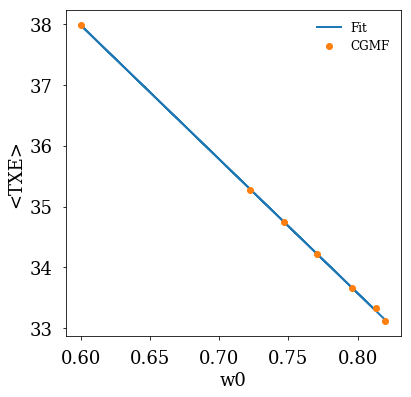

ACCEPTABLE LINEAR FIT between w0 and <TXE>1sig. 
chi^2/dof = 1.4E-03


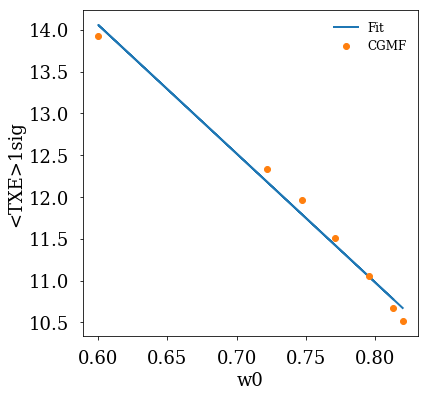

ACCEPTABLE LINEAR FIT between w0 and <TKE>. 
chi^2/dof = 8.1E-06


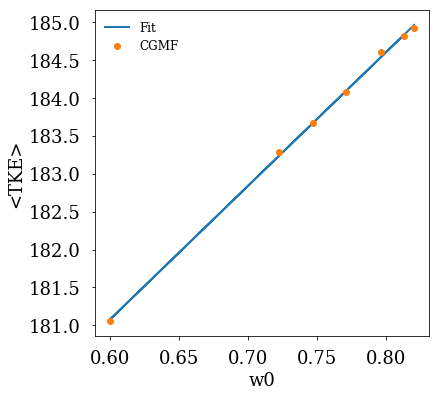

ACCEPTABLE LINEAR FIT between w0 and <TKE>1sig. 
chi^2/dof = 6.2E-04


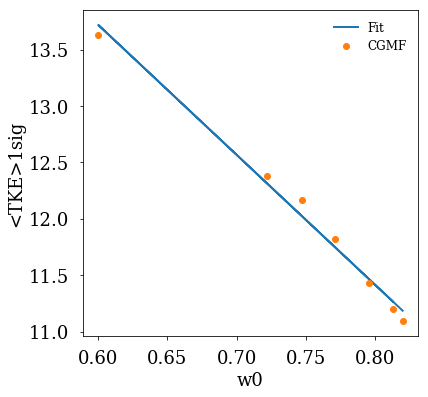

ACCEPTABLE LINEAR FIT between w0 and <J>. 
chi^2/dof = 5.3E-06


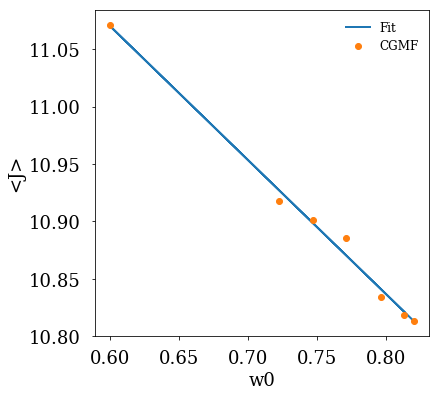

ACCEPTABLE LINEAR FIT between w0 and <J>1sig. 
chi^2/dof = 7.1E-06


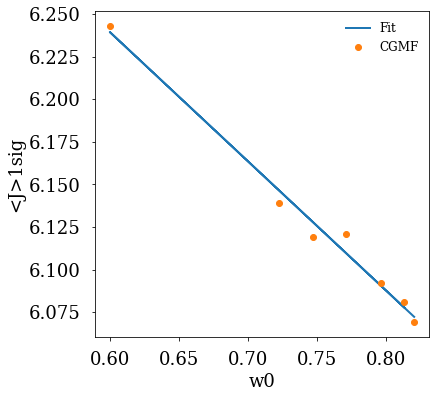

ACCEPTABLE LINEAR FIT between w0 and <nn>. 
chi^2/dof = 3.9E-07


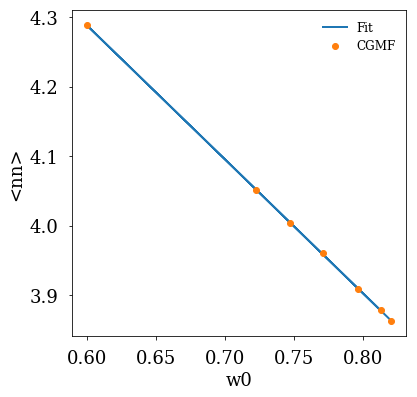

ACCEPTABLE LINEAR FIT between w0 and n-mom2. 
chi^2/dof = 7.2E-06


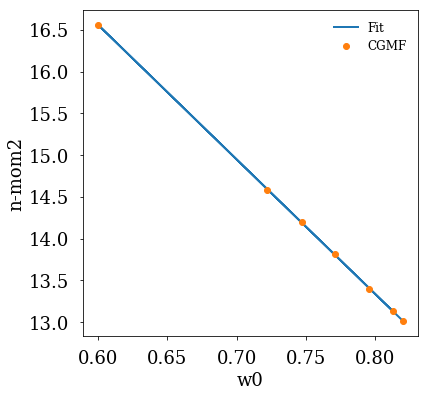

ACCEPTABLE LINEAR FIT between w0 and n-mom3. 
chi^2/dof = 7.5E-05


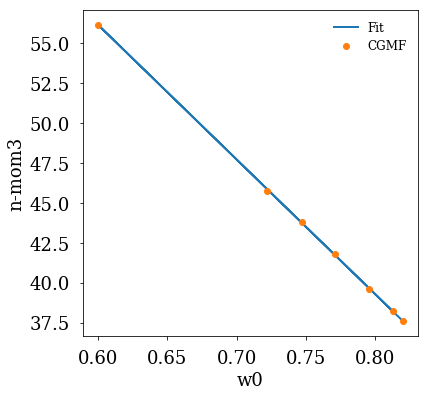

ACCEPTABLE LINEAR FIT between w0 and <ng>. 
chi^2/dof = 4.1E-05


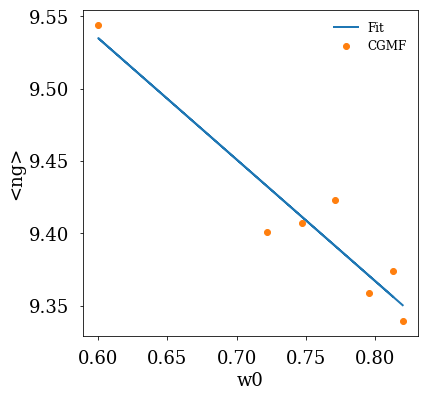

ACCEPTABLE LINEAR FIT between w0 and g-mom2. 
chi^2/dof = 1.8E-03


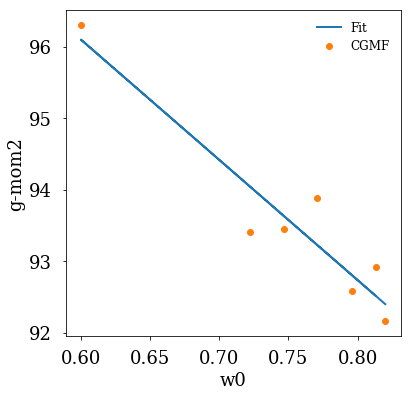

ACCEPTABLE LINEAR FIT between w0 and g-mom3. 
chi^2/dof = 5.2E-02


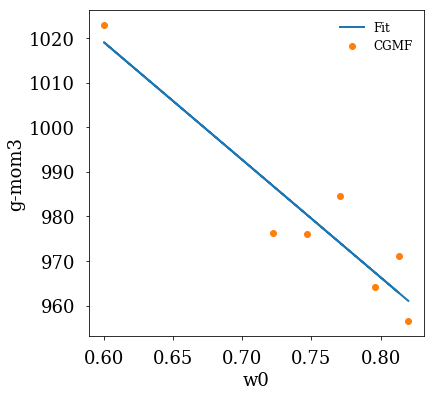

ACCEPTABLE LINEAR FIT between w0 and <En>CM. 
chi^2/dof = 1.1E-05


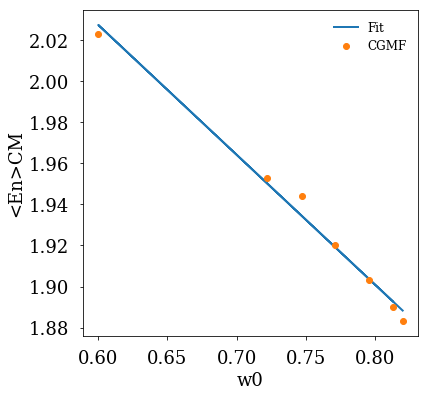

ACCEPTABLE LINEAR FIT between w0 and <En>CM1sig. 
chi^2/dof = 2.5E-05


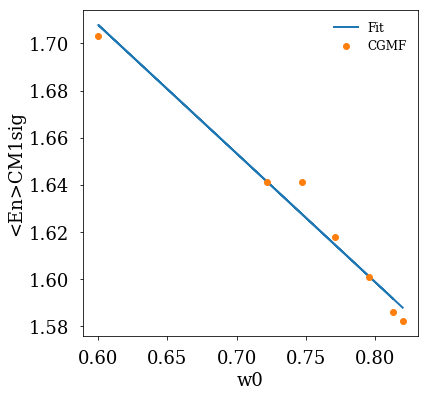

ACCEPTABLE LINEAR FIT between w0 and <Eg>CM. 
chi^2/dof = 2.4E-06


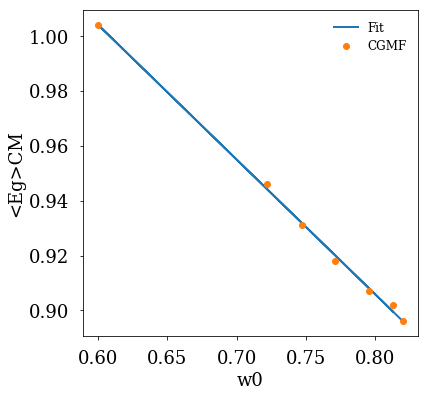

ACCEPTABLE LINEAR FIT between w0 and <Eg>CM1sig. 
chi^2/dof = 3.3E-06


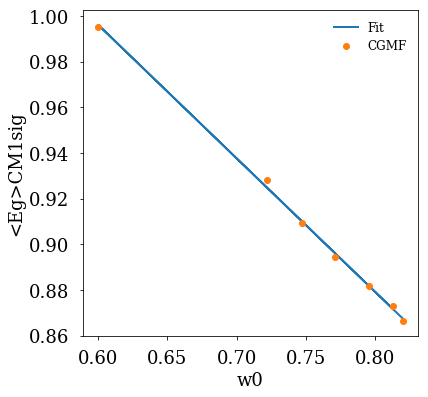

ACCEPTABLE LINEAR FIT between w0 and <En>Lab. 
chi^2/dof = 6.2E-06


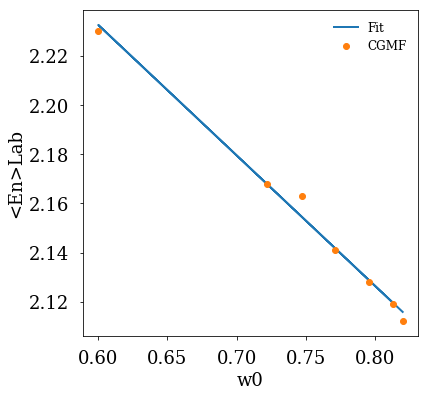

ACCEPTABLE LINEAR FIT between w0 and <En>Lab1sig. 
chi^2/dof = 2.0E-05


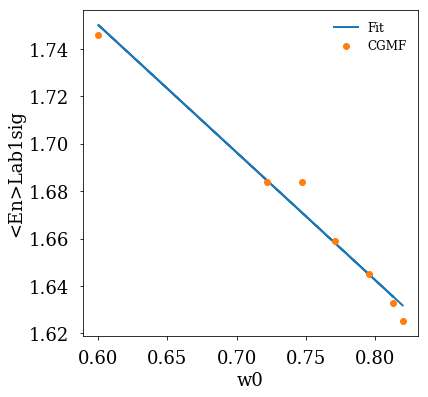

ACCEPTABLE LINEAR FIT between w0 and <Eg>Lab. 
chi^2/dof = 2.0E-06


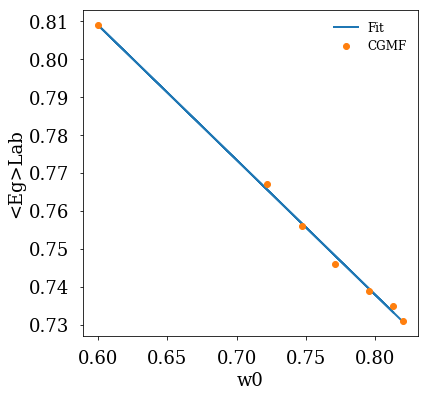

ACCEPTABLE LINEAR FIT between w0 and <Eg>Lab1sig. 
chi^2/dof = 3.4E-06


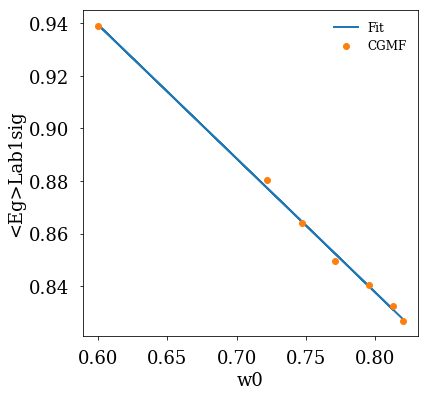

ACCEPTABLE LINEAR FIT between w1 and <TXE>. 
chi^2/dof = 3.1E-05


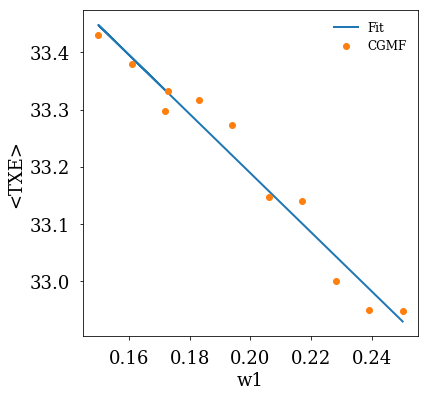

ACCEPTABLE LINEAR FIT between w1 and <TXE>1sig. 
chi^2/dof = 1.1E-04


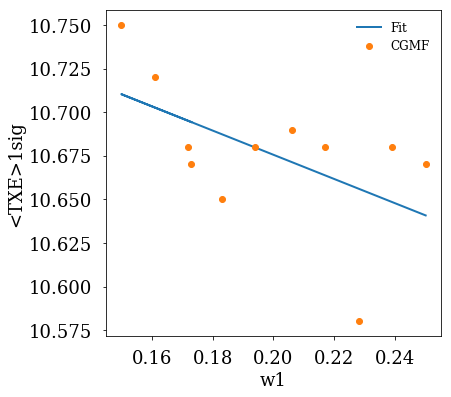

ACCEPTABLE LINEAR FIT between w1 and <TKE>. 
chi^2/dof = 4.5E-06


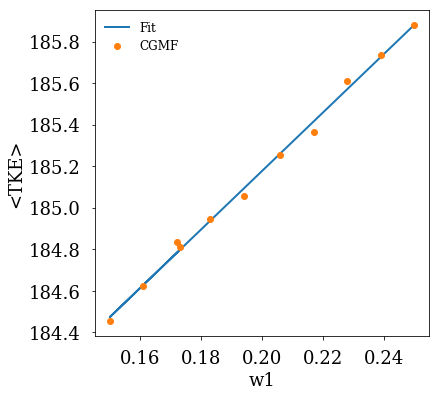

ACCEPTABLE LINEAR FIT between w1 and <TKE>1sig. 
chi^2/dof = 1.2E-04


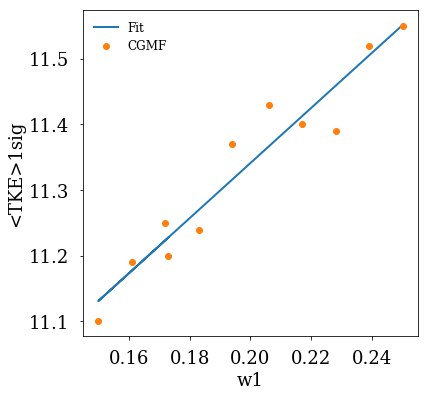

ACCEPTABLE LINEAR FIT between w1 and <J>. 
chi^2/dof = 1.5E-05


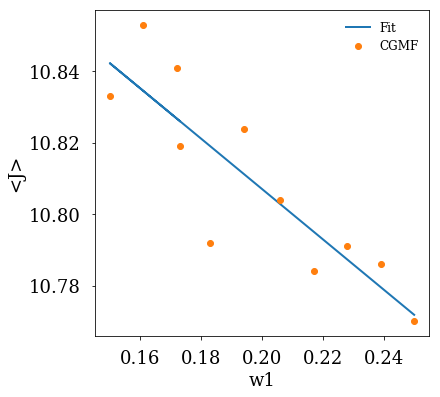

ACCEPTABLE LINEAR FIT between w1 and <J>1sig. 
chi^2/dof = 3.4E-05


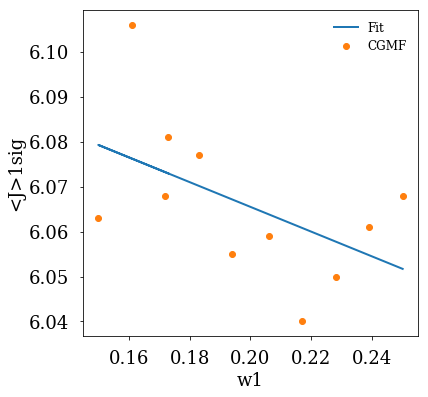

ACCEPTABLE LINEAR FIT between w1 and <nn>. 
chi^2/dof = 3.9E-06


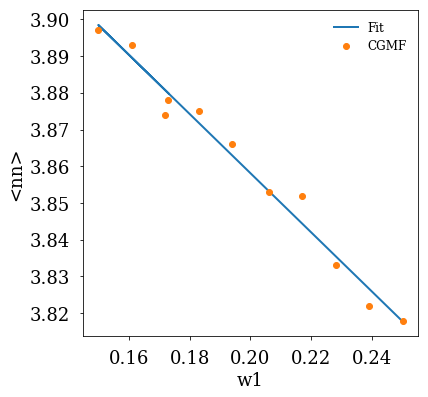

ACCEPTABLE LINEAR FIT between w1 and n-mom2. 
chi^2/dof = 5.5E-05


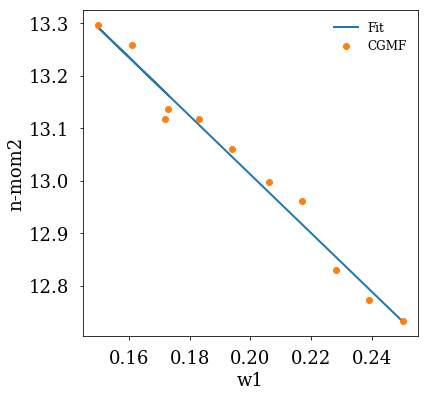

ACCEPTABLE LINEAR FIT between w1 and n-mom3. 
chi^2/dof = 4.7E-04


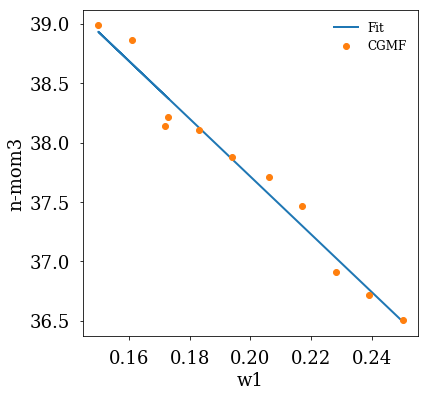

ACCEPTABLE LINEAR FIT between w1 and <ng>. 
chi^2/dof = 1.0E-05


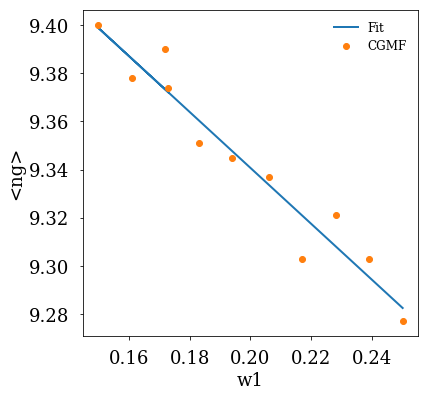

ACCEPTABLE LINEAR FIT between w1 and g-mom2. 
chi^2/dof = 4.5E-04


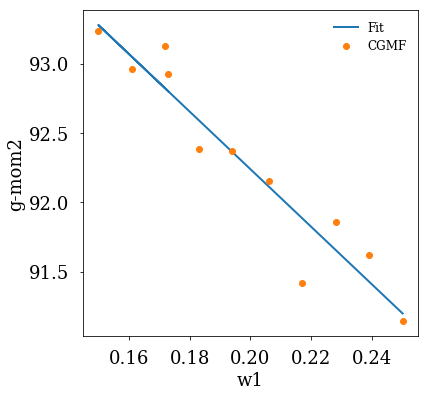

ACCEPTABLE LINEAR FIT between w1 and g-mom3. 
chi^2/dof = 1.4E-02


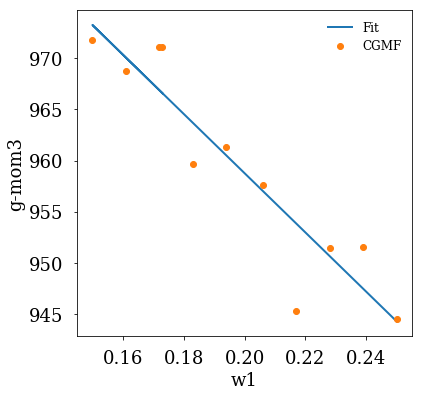

ACCEPTABLE LINEAR FIT between w1 and <En>CM. 
chi^2/dof = 2.9E-06


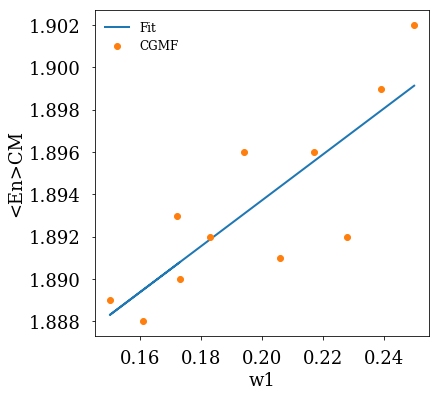

ACCEPTABLE LINEAR FIT between w1 and <En>CM1sig. 
chi^2/dof = 3.7E-06


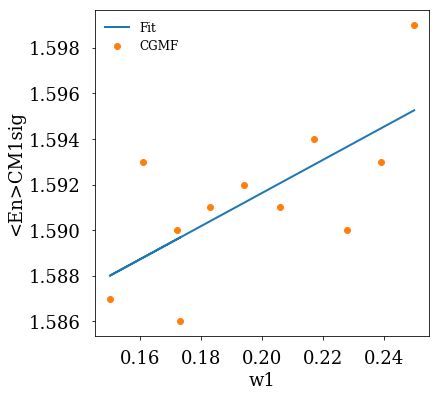

ACCEPTABLE LINEAR FIT between w1 and <Eg>CM. 
chi^2/dof = 1.3E-06


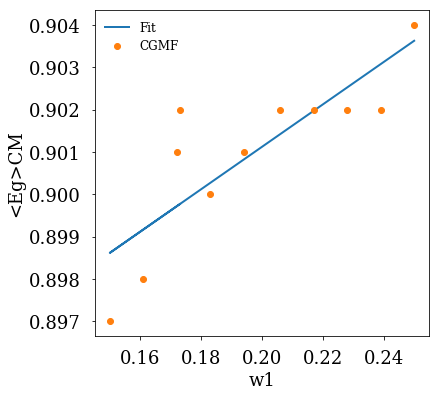

ACCEPTABLE LINEAR FIT between w1 and <Eg>CM1sig. 
chi^2/dof = 1.8E-06


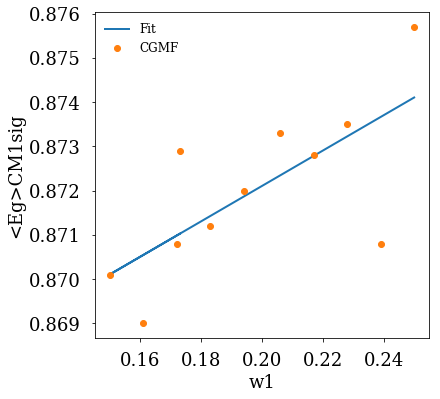

ACCEPTABLE LINEAR FIT between w1 and <En>Lab. 
chi^2/dof = 5.0E-06


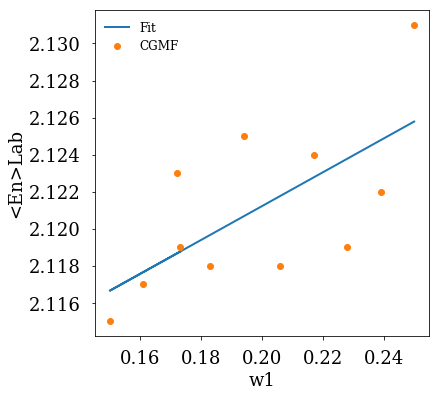

ACCEPTABLE LINEAR FIT between w1 and <En>Lab1sig. 
chi^2/dof = 4.1E-06


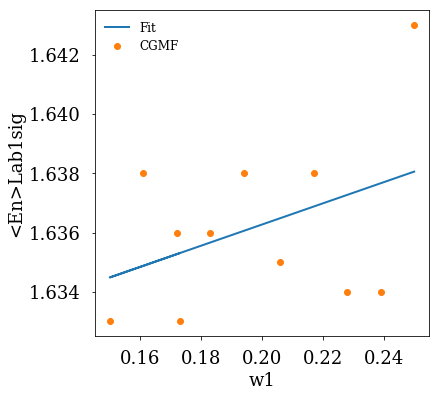

ACCEPTABLE LINEAR FIT between w1 and <Eg>Lab. 
chi^2/dof = 1.4E-06


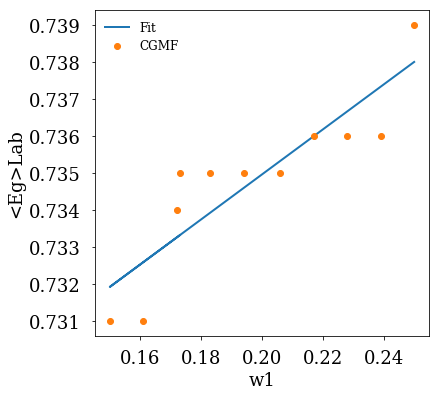

ACCEPTABLE LINEAR FIT between w1 and <Eg>Lab1sig. 
chi^2/dof = 1.8E-06


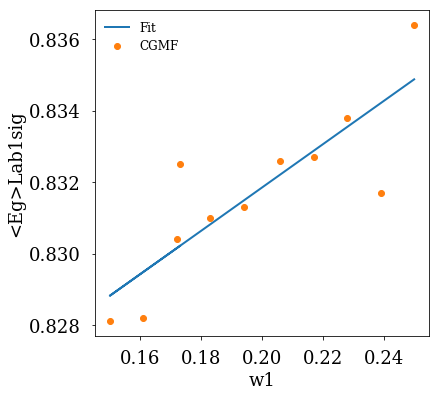

ACCEPTABLE LINEAR FIT between w2 and <TXE>. 
chi^2/dof = 7.7E-05


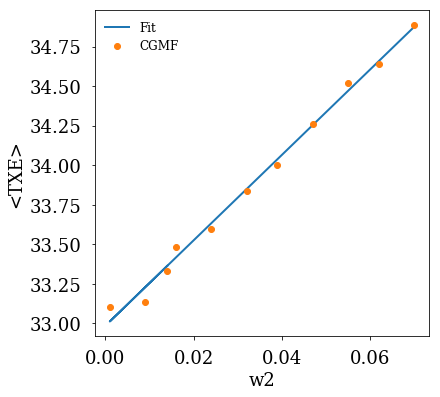

ACCEPTABLE LINEAR FIT between w2 and <TXE>1sig. 
chi^2/dof = 6.9E-05


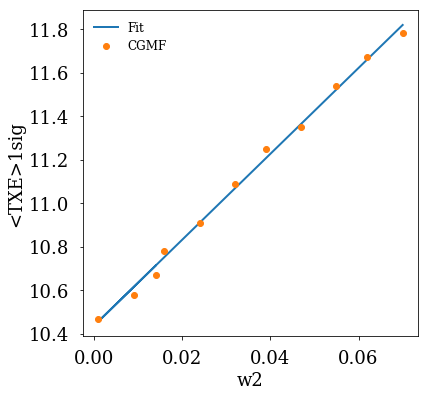

ACCEPTABLE LINEAR FIT between w2 and <TKE>. 
chi^2/dof = 1.8E-05


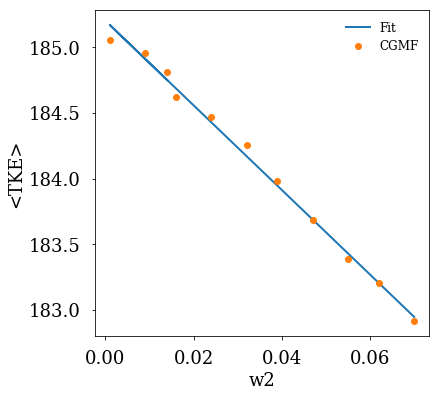

ACCEPTABLE LINEAR FIT between w2 and <TKE>1sig. 
chi^2/dof = 6.1E-05


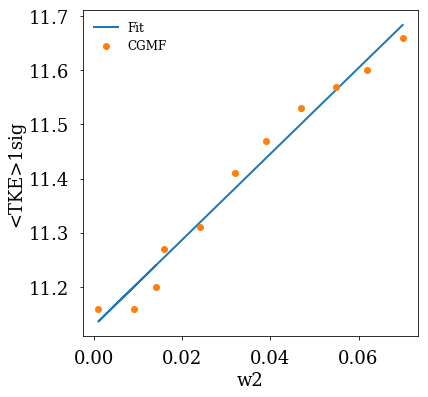

ACCEPTABLE LINEAR FIT between w2 and <J>. 
chi^2/dof = 3.7E-05


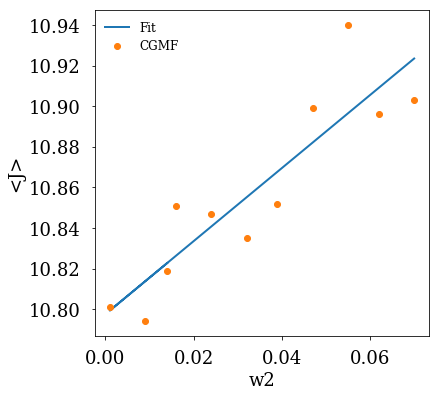

ACCEPTABLE LINEAR FIT between w2 and <J>1sig. 
chi^2/dof = 1.8E-05


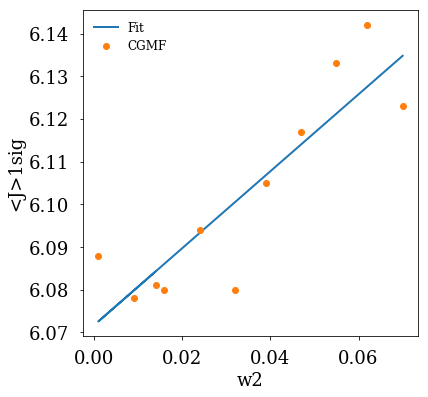

ACCEPTABLE LINEAR FIT between w2 and <nn>. 
chi^2/dof = 1.2E-05


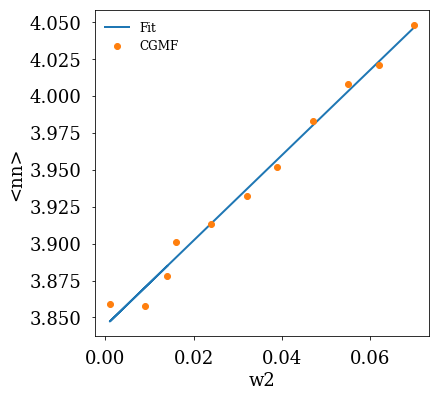

ACCEPTABLE LINEAR FIT between w2 and n-mom2. 
chi^2/dof = 2.1E-04


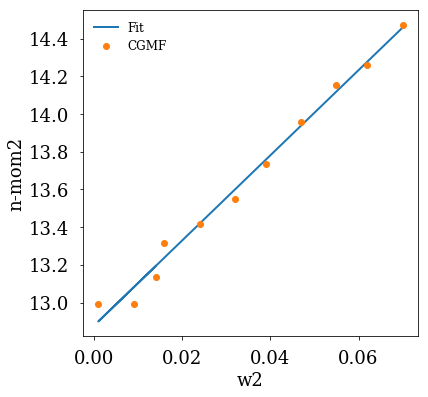

ACCEPTABLE LINEAR FIT between w2 and n-mom3. 
chi^2/dof = 1.7E-03


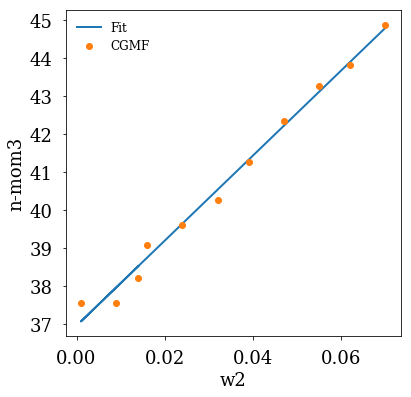

ACCEPTABLE LINEAR FIT between w2 and <ng>. 
chi^2/dof = 1.7E-05


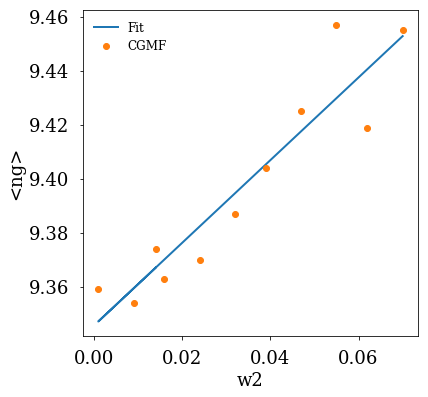

ACCEPTABLE LINEAR FIT between w2 and g-mom2. 
chi^2/dof = 8.9E-04


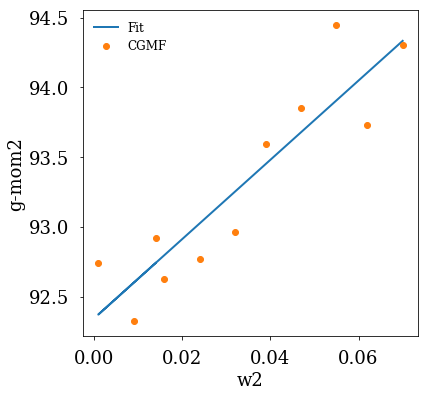

ACCEPTABLE LINEAR FIT between w2 and g-mom3. 
chi^2/dof = 2.8E-02


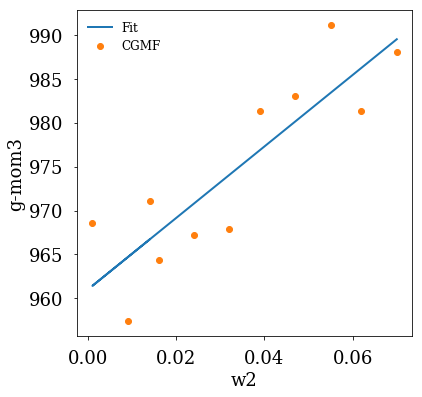

ACCEPTABLE LINEAR FIT between w2 and <En>CM. 
chi^2/dof = 4.3E-06


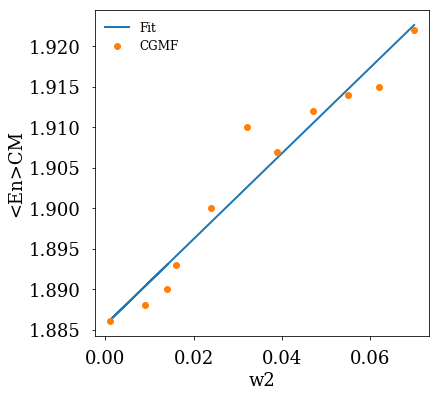

ACCEPTABLE LINEAR FIT between w2 and <En>CM1sig. 
chi^2/dof = 7.8E-06


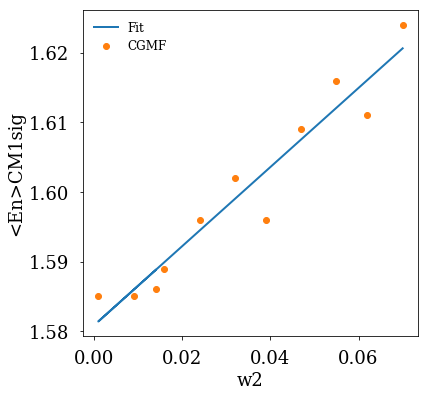

ACCEPTABLE LINEAR FIT between w2 and <Eg>CM. 
chi^2/dof = 5.6E-06


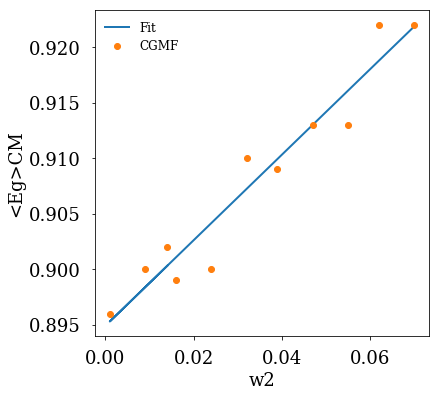

ACCEPTABLE LINEAR FIT between w2 and <Eg>CM1sig. 
chi^2/dof = 8.0E-06


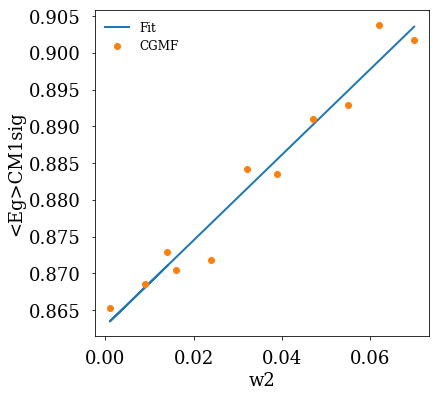

ACCEPTABLE LINEAR FIT between w2 and <En>Lab. 
chi^2/dof = 3.1E-06


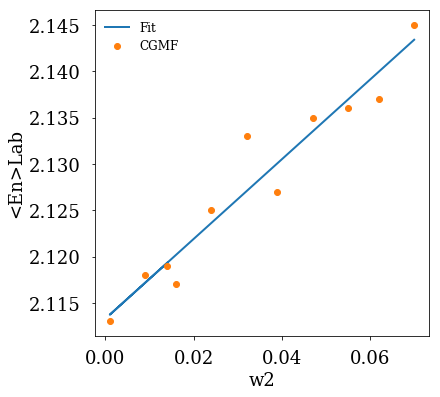

ACCEPTABLE LINEAR FIT between w2 and <En>Lab1sig. 
chi^2/dof = 8.7E-06


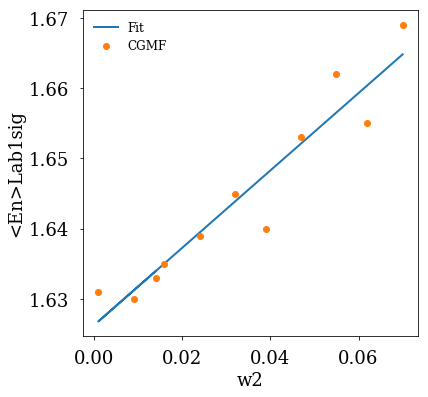

ACCEPTABLE LINEAR FIT between w2 and <Eg>Lab. 
chi^2/dof = 3.2E-06


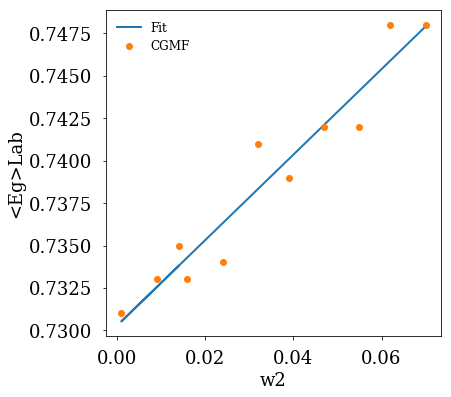

ACCEPTABLE LINEAR FIT between w2 and <Eg>Lab1sig. 
chi^2/dof = 7.2E-06


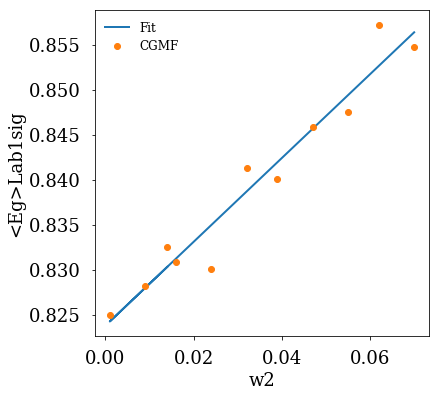

ACCEPTABLE LINEAR FIT between dmin0 and <TXE>. 
chi^2/dof = 4.4E-04


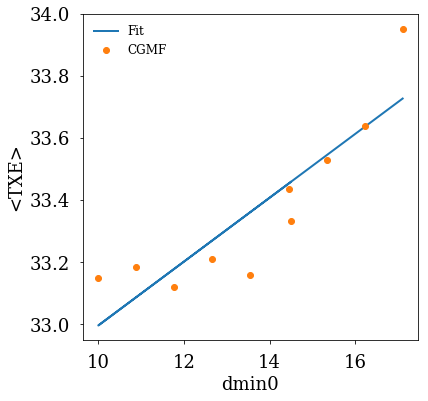

ACCEPTABLE LINEAR FIT between dmin0 and <TXE>1sig. 
chi^2/dof = 1.3E-02


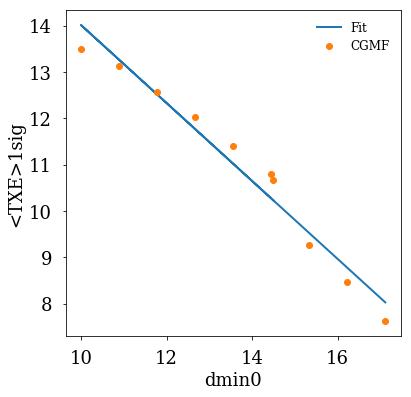

ACCEPTABLE LINEAR FIT between dmin0 and <TKE>. 
chi^2/dof = 6.8E-05


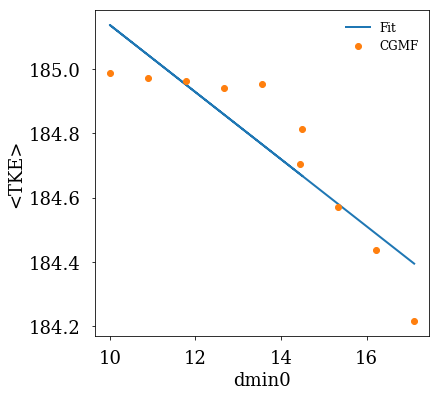

ACCEPTABLE LINEAR FIT between dmin0 and <TKE>1sig. 
chi^2/dof = 7.5E-03


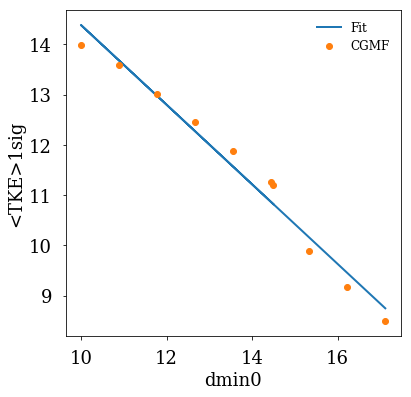

ACCEPTABLE LINEAR FIT between dmin0 and <J>. 
chi^2/dof = 5.7E-05


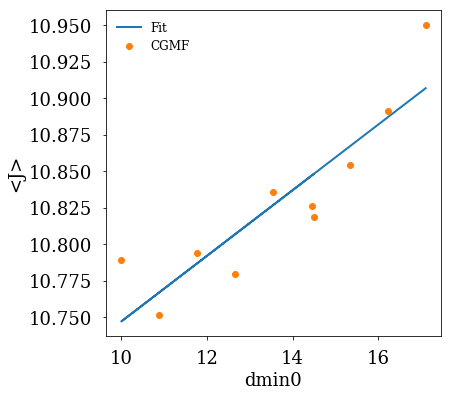

ACCEPTABLE LINEAR FIT between dmin0 and <J>1sig. 
chi^2/dof = 1.5E-05


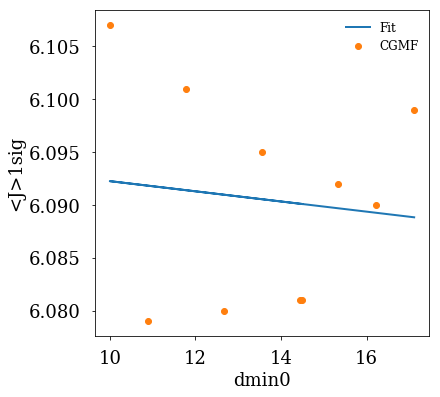

ACCEPTABLE LINEAR FIT between dmin0 and <nn>. 
chi^2/dof = 1.0E-04


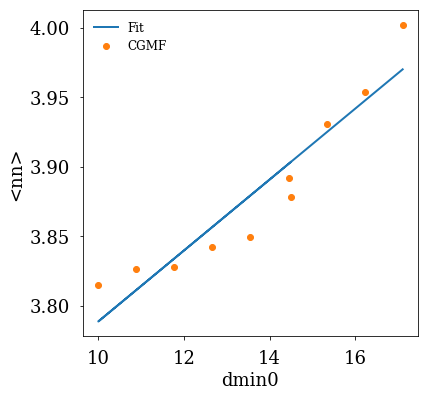

ACCEPTABLE LINEAR FIT between dmin0 and n-mom2. 
chi^2/dof = 5.7E-04


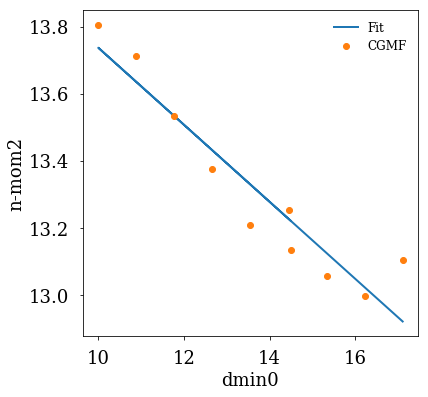

ACCEPTABLE LINEAR FIT between dmin0 and n-mom3. 
chi^2/dof = 4.1E-03


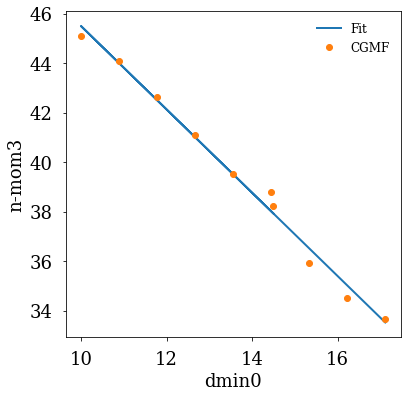

ACCEPTABLE LINEAR FIT between dmin0 and <ng>. 
chi^2/dof = 1.3E-05


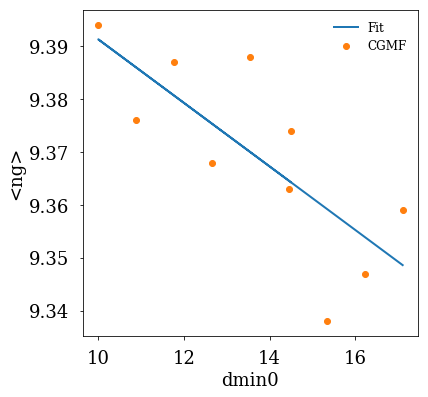

ACCEPTABLE LINEAR FIT between dmin0 and g-mom2. 
chi^2/dof = 5.6E-04


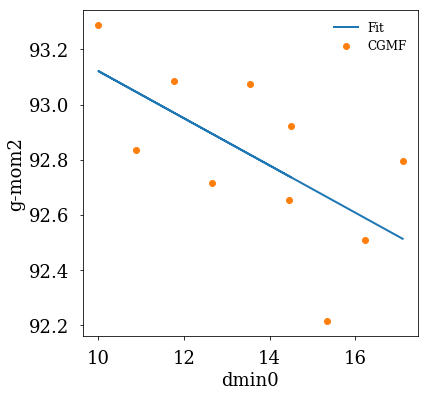

ACCEPTABLE LINEAR FIT between dmin0 and g-mom3. 
chi^2/dof = 1.8E-02


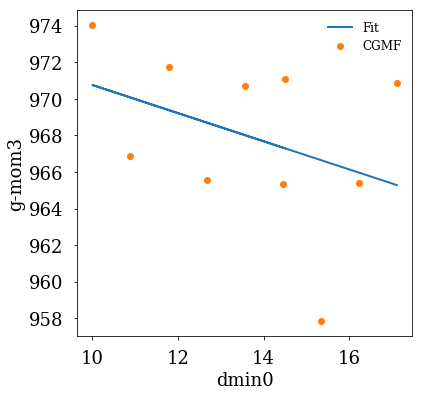

ACCEPTABLE LINEAR FIT between dmin0 and <En>CM. 
chi^2/dof = 2.4E-05


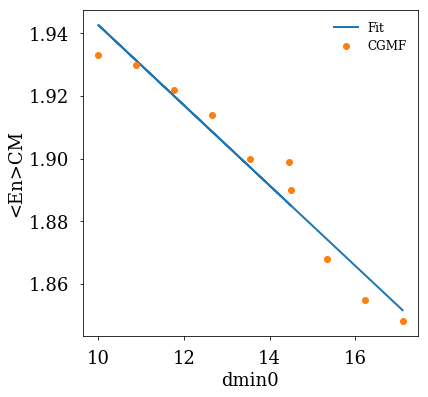

ACCEPTABLE LINEAR FIT between dmin0 and <En>CM1sig. 
chi^2/dof = 1.9E-05


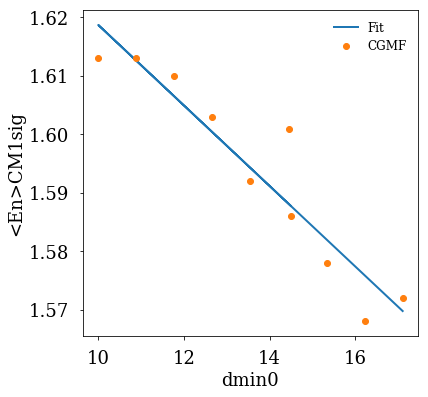

ACCEPTABLE LINEAR FIT between dmin0 and <Eg>CM. 
chi^2/dof = 6.4E-06


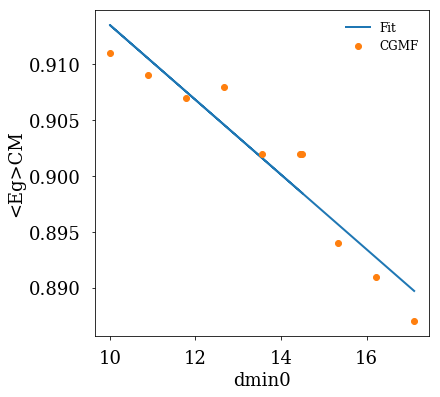

ACCEPTABLE LINEAR FIT between dmin0 and <Eg>CM1sig. 
chi^2/dof = 3.0E-06


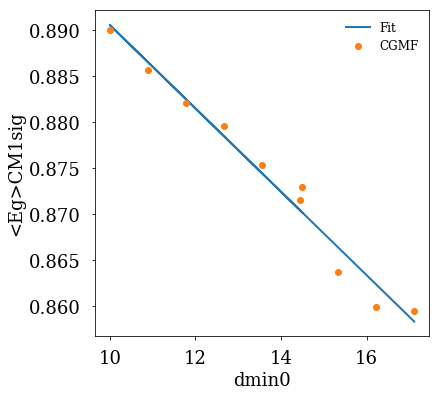

ACCEPTABLE LINEAR FIT between dmin0 and <En>Lab. 
chi^2/dof = 4.4E-06


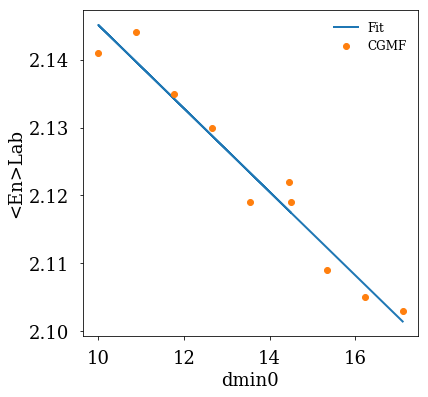

ACCEPTABLE LINEAR FIT between dmin0 and <En>Lab1sig. 
chi^2/dof = 1.5E-05


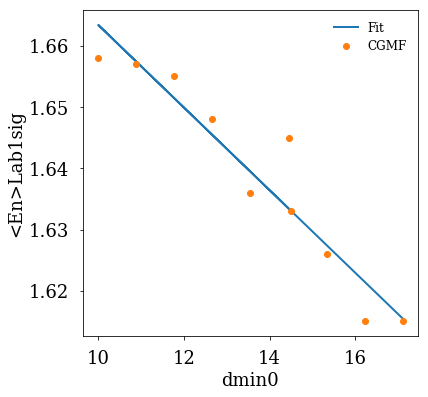

ACCEPTABLE LINEAR FIT between dmin0 and <Eg>Lab. 
chi^2/dof = 4.1E-06


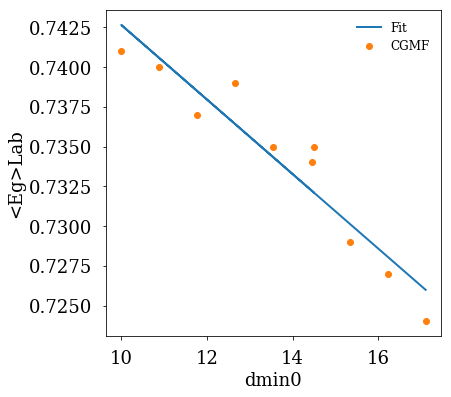

ACCEPTABLE LINEAR FIT between dmin0 and <Eg>Lab1sig. 
chi^2/dof = 2.4E-06


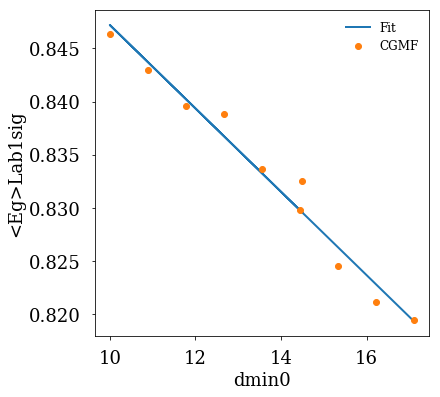

ACCEPTABLE LINEAR FIT between dmin1 and <TXE>. 
chi^2/dof = 2.9E-05


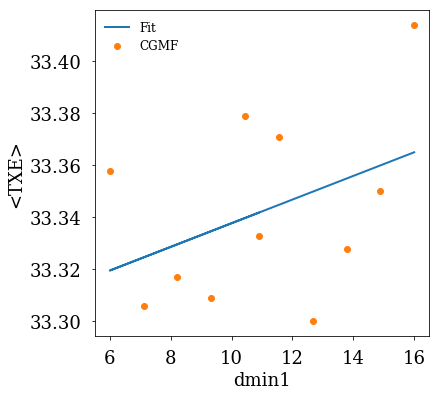

ACCEPTABLE LINEAR FIT between dmin1 and <TXE>1sig. 
chi^2/dof = 1.1E-04


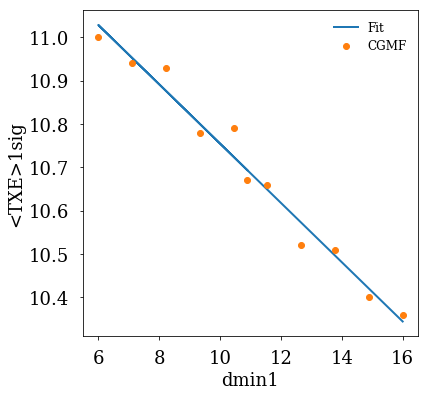

ACCEPTABLE LINEAR FIT between dmin1 and <TKE>. 
chi^2/dof = 3.2E-06


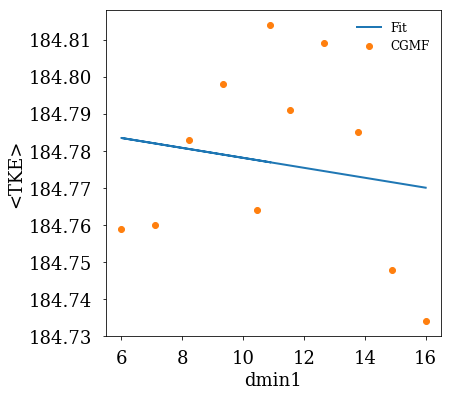

ACCEPTABLE LINEAR FIT between dmin1 and <TKE>1sig. 
chi^2/dof = 1.3E-04


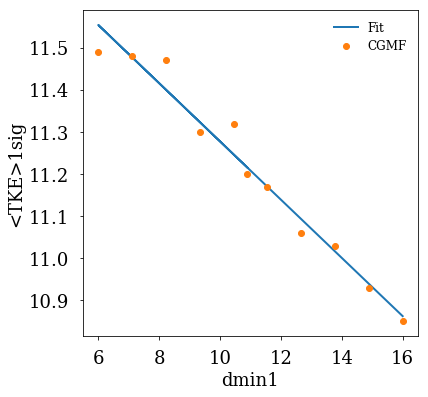

ACCEPTABLE LINEAR FIT between dmin1 and <J>. 
chi^2/dof = 1.3E-05


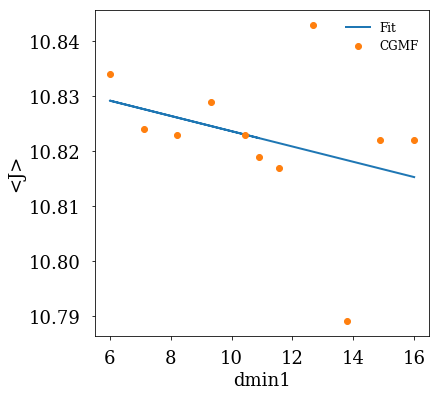

ACCEPTABLE LINEAR FIT between dmin1 and <J>1sig. 
chi^2/dof = 3.0E-05


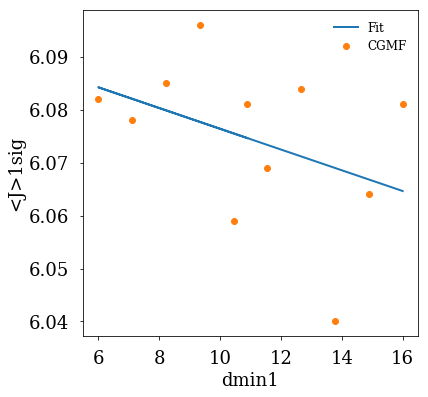

ACCEPTABLE LINEAR FIT between dmin1 and <nn>. 
chi^2/dof = 3.3E-06


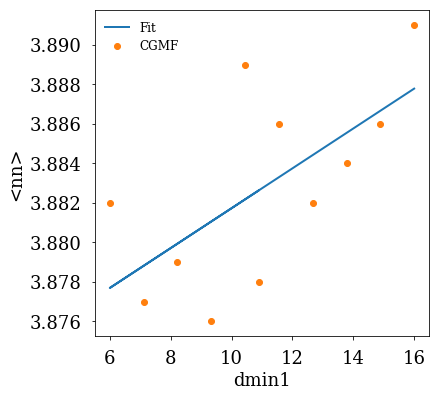

ACCEPTABLE LINEAR FIT between dmin1 and n-mom2. 
chi^2/dof = 5.8E-05


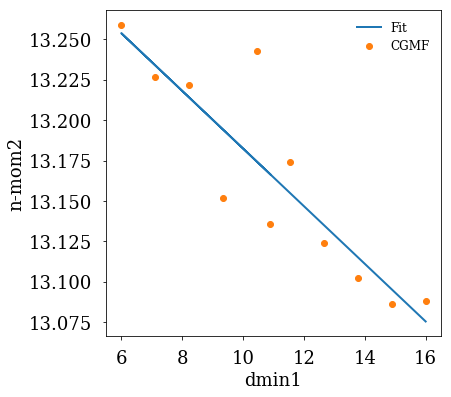

ACCEPTABLE LINEAR FIT between dmin1 and n-mom3. 
chi^2/dof = 7.1E-04


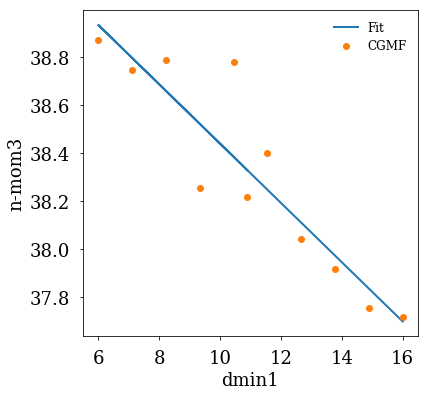

ACCEPTABLE LINEAR FIT between dmin1 and <ng>. 
chi^2/dof = 7.7E-06


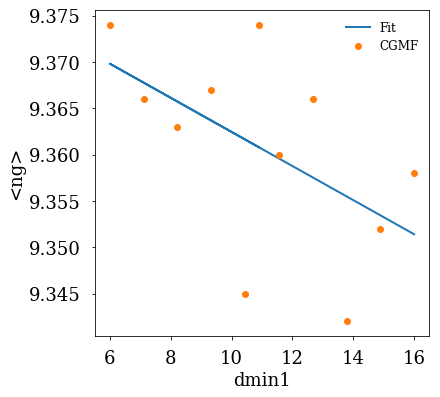

ACCEPTABLE LINEAR FIT between dmin1 and g-mom2. 
chi^2/dof = 4.1E-04


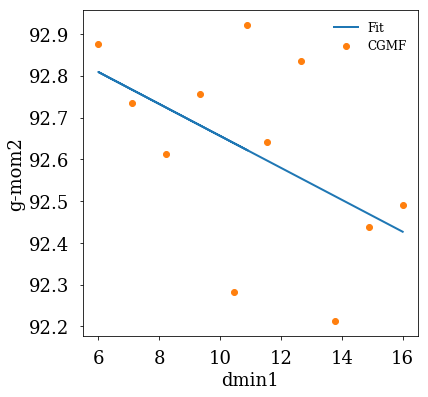

ACCEPTABLE LINEAR FIT between dmin1 and g-mom3. 
chi^2/dof = 1.4E-02


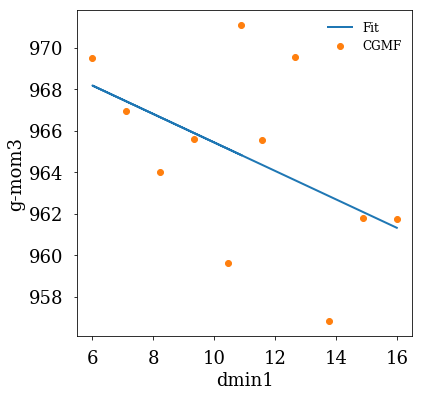

ACCEPTABLE LINEAR FIT between dmin1 and <En>CM. 
chi^2/dof = 2.8E-06


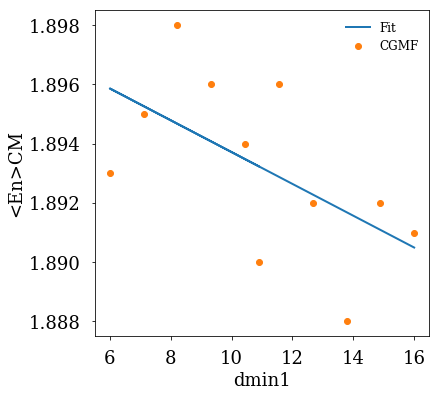

ACCEPTABLE LINEAR FIT between dmin1 and <En>CM1sig. 
chi^2/dof = 7.2E-06


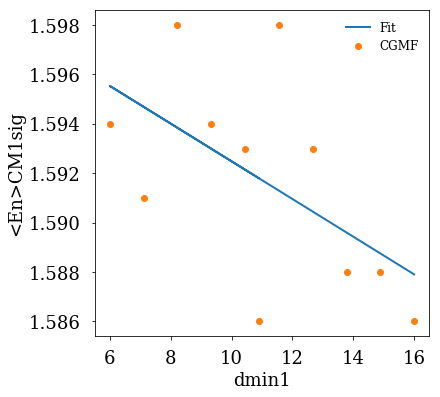

ACCEPTABLE LINEAR FIT between dmin1 and <Eg>CM. 
chi^2/dof = 1.3E-06


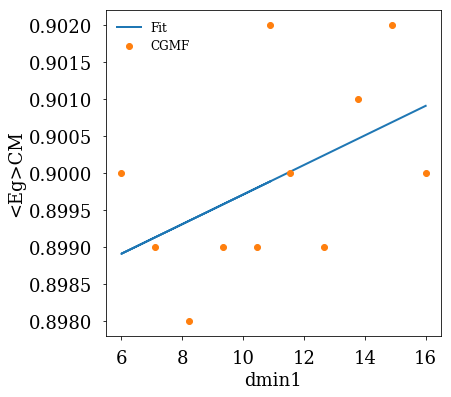

ACCEPTABLE LINEAR FIT between dmin1 and <Eg>CM1sig. 
chi^2/dof = 4.5E-06


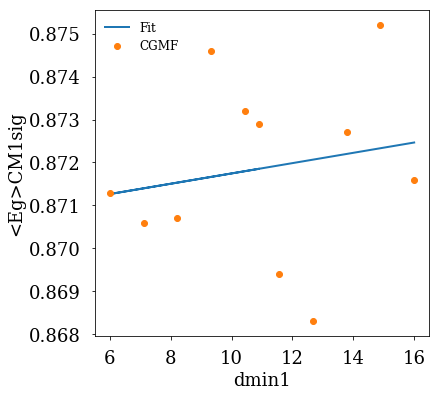

ACCEPTABLE LINEAR FIT between dmin1 and <En>Lab. 
chi^2/dof = 1.7E-06


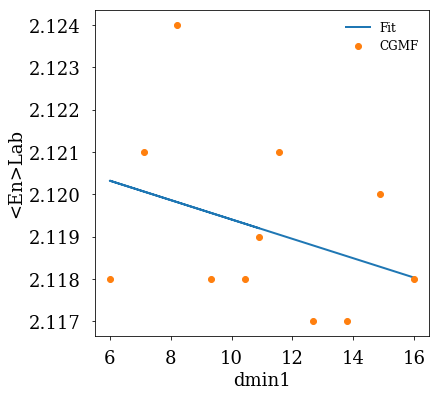

ACCEPTABLE LINEAR FIT between dmin1 and <En>Lab1sig. 
chi^2/dof = 5.0E-06


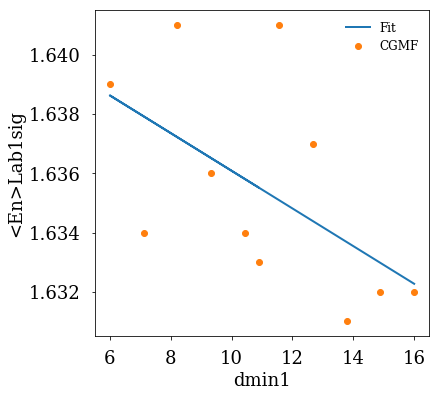

ACCEPTABLE LINEAR FIT between dmin1 and <Eg>Lab. 
chi^2/dof = 1.1E-06


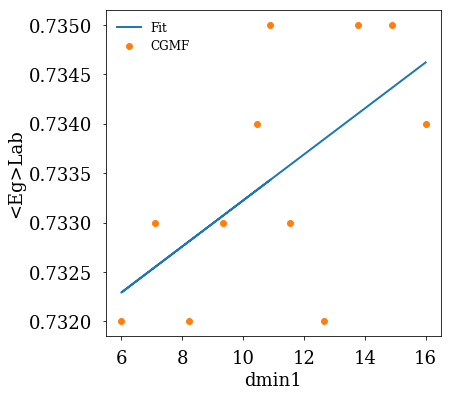

ACCEPTABLE LINEAR FIT between dmin1 and <Eg>Lab1sig. 
chi^2/dof = 4.5E-06


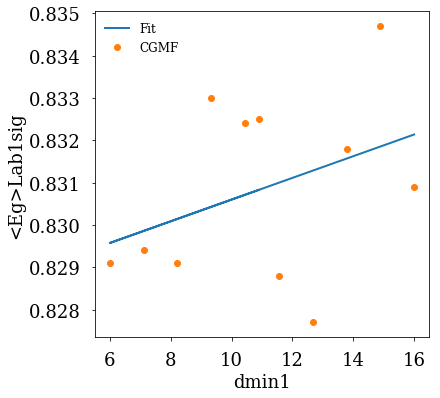

ACCEPTABLE LINEAR FIT between dmin2 and <TXE>. 
chi^2/dof = 5.2E-05


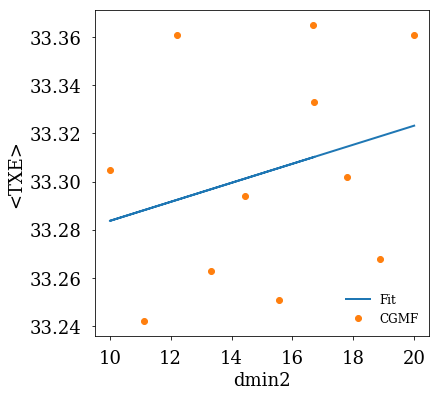

ACCEPTABLE LINEAR FIT between dmin2 and <TXE>1sig. 
chi^2/dof = 1.3E-04


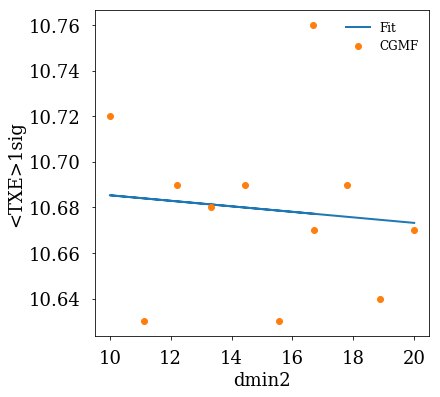

ACCEPTABLE LINEAR FIT between dmin2 and <TKE>. 
chi^2/dof = 6.7E-06


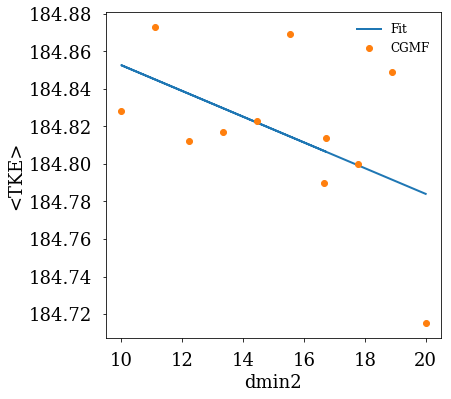

ACCEPTABLE LINEAR FIT between dmin2 and <TKE>1sig. 
chi^2/dof = 6.5E-05


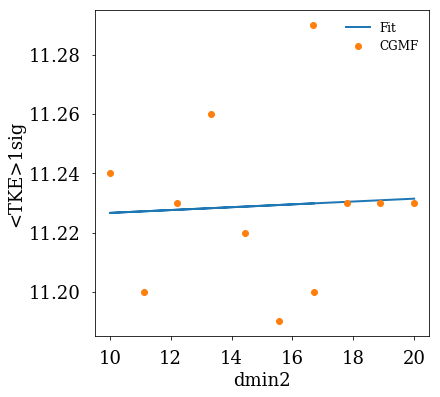

ACCEPTABLE LINEAR FIT between dmin2 and <J>. 
chi^2/dof = 1.6E-05


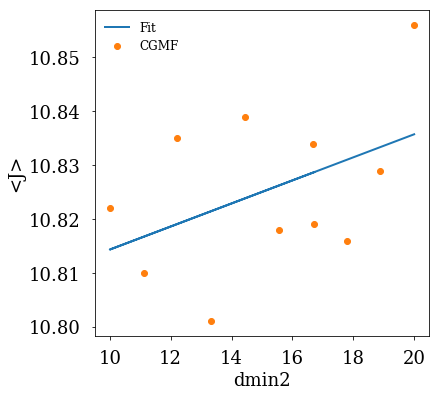

ACCEPTABLE LINEAR FIT between dmin2 and <J>1sig. 
chi^2/dof = 1.6E-05


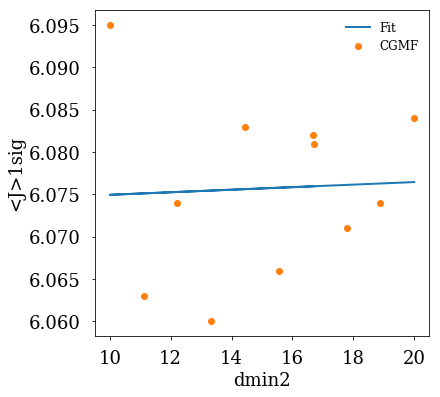

ACCEPTABLE LINEAR FIT between dmin2 and <nn>. 
chi^2/dof = 6.0E-06


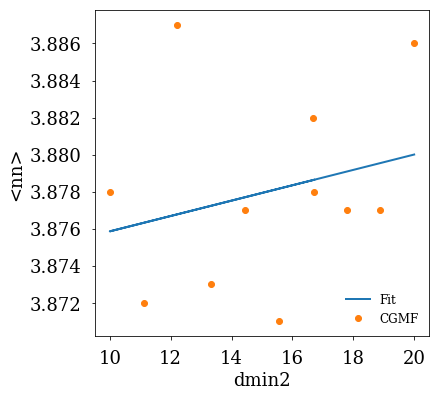

ACCEPTABLE LINEAR FIT between dmin2 and n-mom2. 
chi^2/dof = 1.1E-04


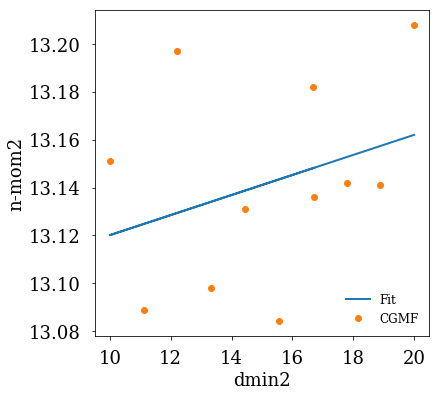

ACCEPTABLE LINEAR FIT between dmin2 and n-mom3. 
chi^2/dof = 8.2E-04


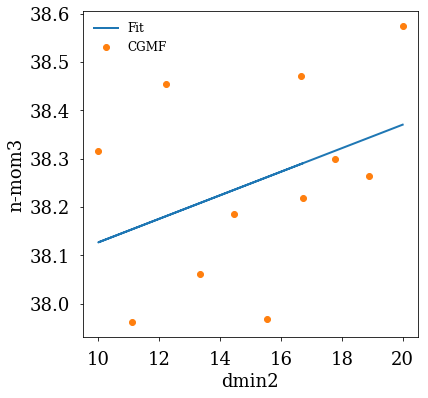

ACCEPTABLE LINEAR FIT between dmin2 and <ng>. 
chi^2/dof = 1.8E-05


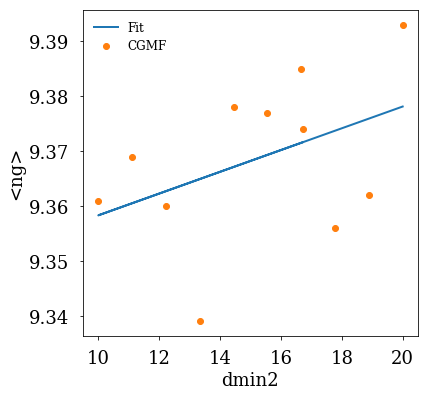

ACCEPTABLE LINEAR FIT between dmin2 and g-mom2. 
chi^2/dof = 9.0E-04


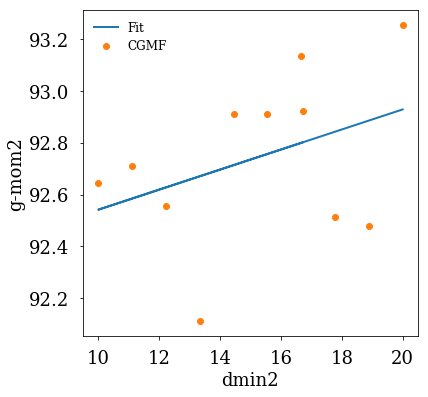

ACCEPTABLE LINEAR FIT between dmin2 and g-mom3. 
chi^2/dof = 2.7E-02


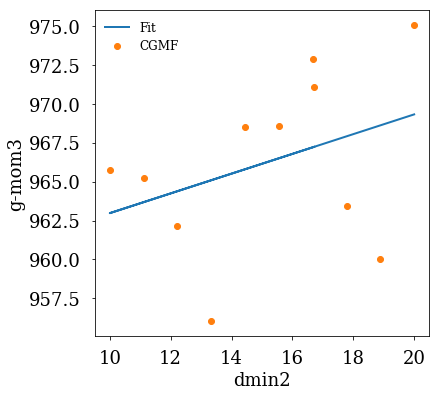

ACCEPTABLE LINEAR FIT between dmin2 and <En>CM. 
chi^2/dof = 3.1E-06


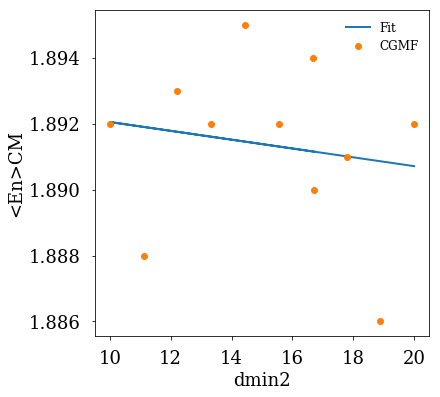

ACCEPTABLE LINEAR FIT between dmin2 and <En>CM1sig. 
chi^2/dof = 9.8E-06


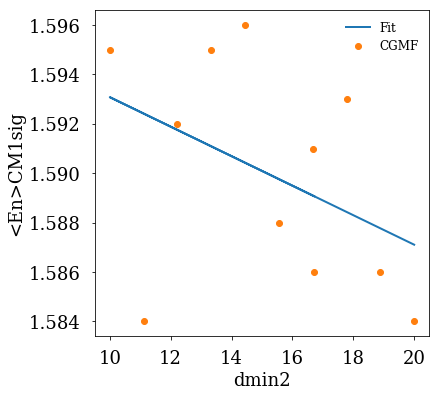

ACCEPTABLE LINEAR FIT between dmin2 and <Eg>CM. 
chi^2/dof = 4.1E-06


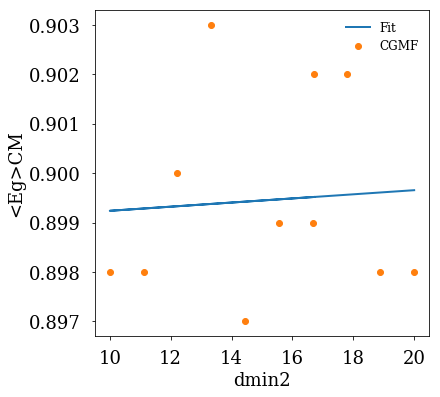

ACCEPTABLE LINEAR FIT between dmin2 and <Eg>CM1sig. 
chi^2/dof = 4.9E-06


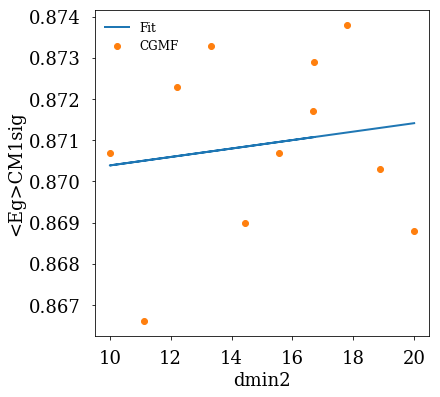

ACCEPTABLE LINEAR FIT between dmin2 and <En>Lab. 
chi^2/dof = 3.0E-06


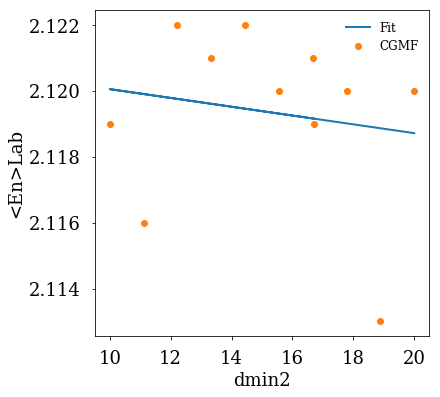

ACCEPTABLE LINEAR FIT between dmin2 and <En>Lab1sig. 
chi^2/dof = 9.2E-06


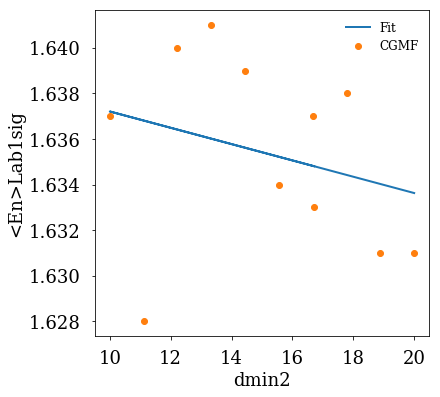

ACCEPTABLE LINEAR FIT between dmin2 and <Eg>Lab. 
chi^2/dof = 1.7E-06


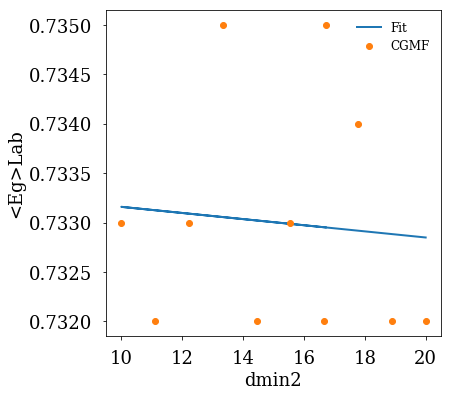

ACCEPTABLE LINEAR FIT between dmin2 and <Eg>Lab1sig. 
chi^2/dof = 3.5E-06


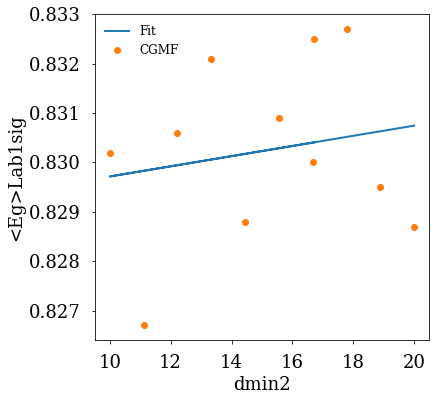

ACCEPTABLE LINEAR FIT between dmax0 and <TXE>. 
chi^2/dof = 7.9E-02


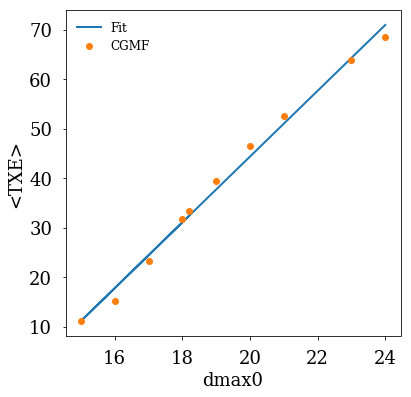

BAD LINEAR FIT between dmax0 and <TXE>1sig. 
chi^2/dof = 0.2


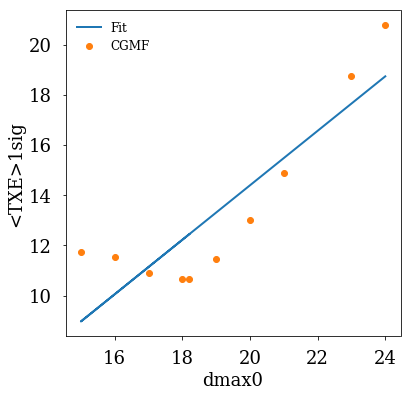

ACCEPTABLE LINEAR FIT between dmax0 and <TKE>. 
chi^2/dof = 1.5E-02


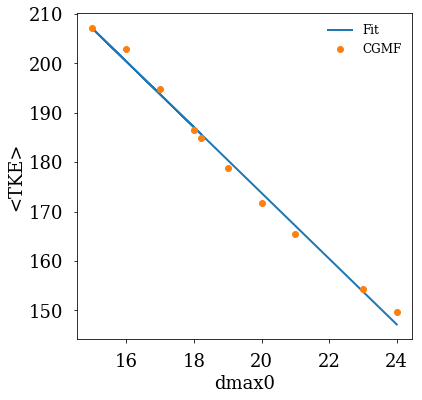

BAD LINEAR FIT between dmax0 and <TKE>1sig. 
chi^2/dof = 0.2


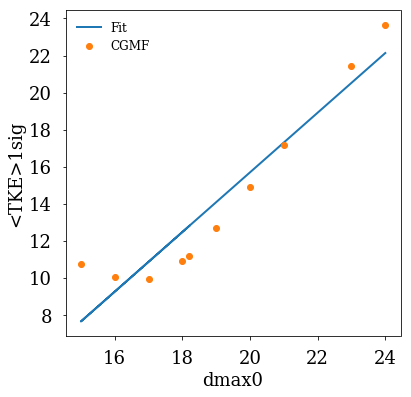

ACCEPTABLE LINEAR FIT between dmax0 and <J>. 
chi^2/dof = 1.2E-02


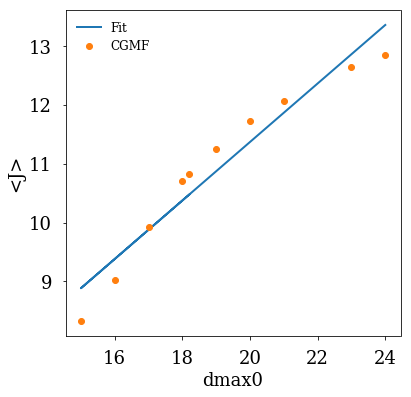

ACCEPTABLE LINEAR FIT between dmax0 and <J>1sig. 
chi^2/dof = 1.9E-03


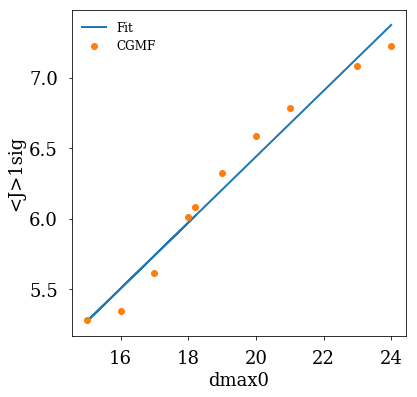

ACCEPTABLE LINEAR FIT between dmax0 and <nn>. 
chi^2/dof = 6.4E-02


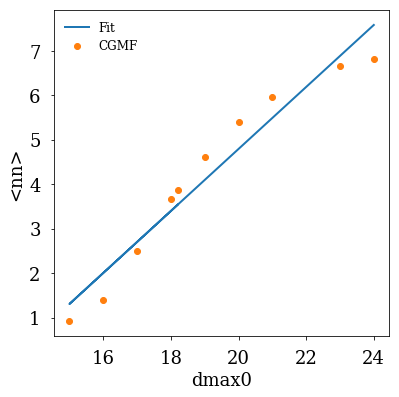

BAD LINEAR FIT between dmax0 and n-mom2. 
chi^2/dof = -0.6


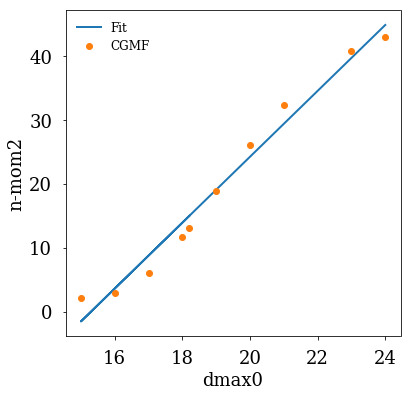

BAD LINEAR FIT between dmax0 and n-mom3. 
chi^2/dof = -3.7


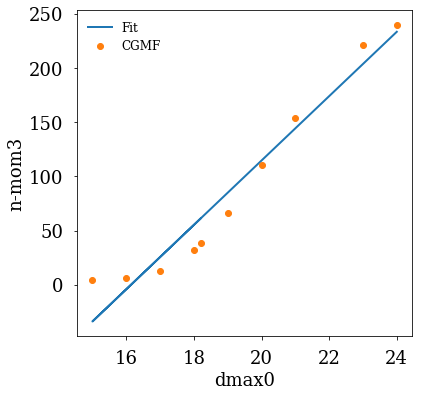

ACCEPTABLE LINEAR FIT between dmax0 and <ng>. 
chi^2/dof = 8.1E-03


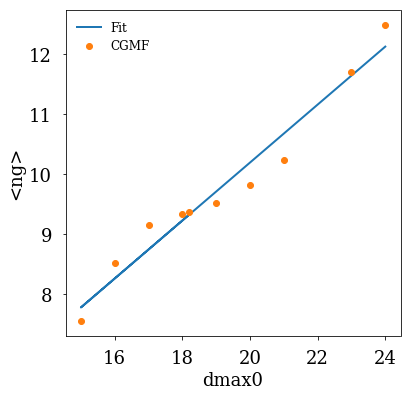

BAD LINEAR FIT between dmax0 and g-mom2. 
chi^2/dof = 0.4


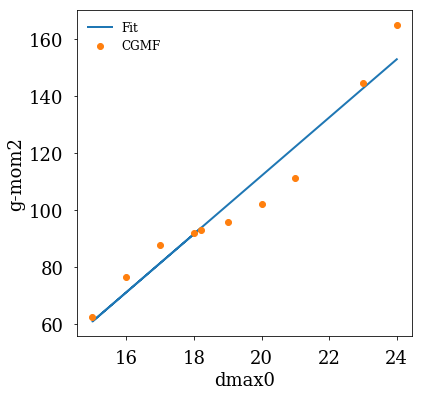

BAD LINEAR FIT between dmax0 and g-mom3. 
chi^2/dof = 16.2


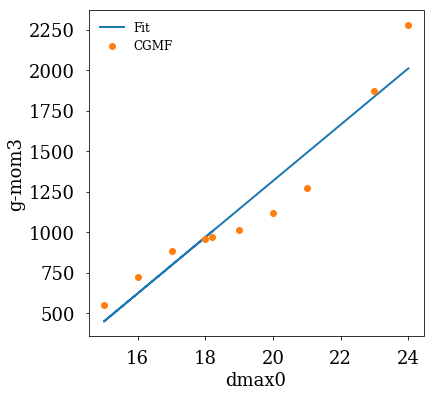

ACCEPTABLE LINEAR FIT between dmax0 and <En>CM. 
chi^2/dof = 3.5E-03


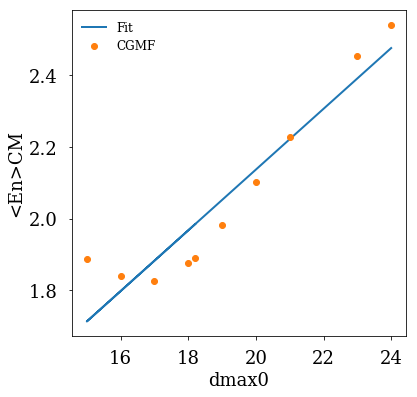

ACCEPTABLE LINEAR FIT between dmax0 and <En>CM1sig. 
chi^2/dof = 1.5E-03


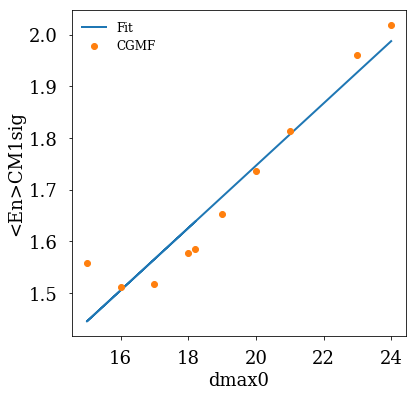

ACCEPTABLE LINEAR FIT between dmax0 and <Eg>CM. 
chi^2/dof = 1.0E-02


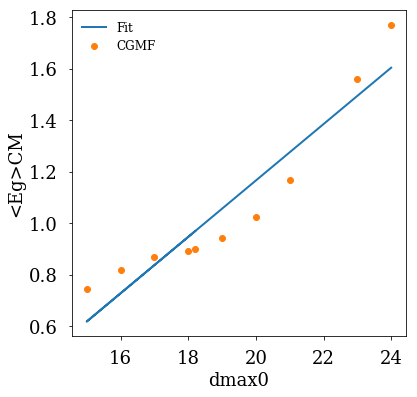

ACCEPTABLE LINEAR FIT between dmax0 and <Eg>CM1sig. 
chi^2/dof = 9.3E-03


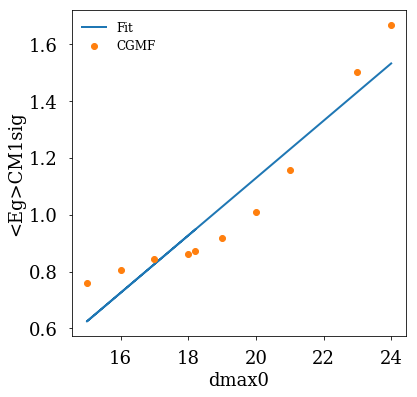

ACCEPTABLE LINEAR FIT between dmax0 and <En>Lab. 
chi^2/dof = 1.4E-03


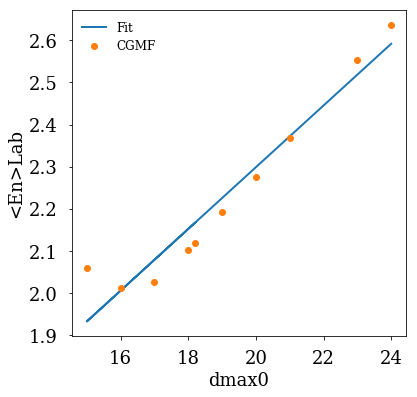

ACCEPTABLE LINEAR FIT between dmax0 and <En>Lab1sig. 
chi^2/dof = 1.4E-03


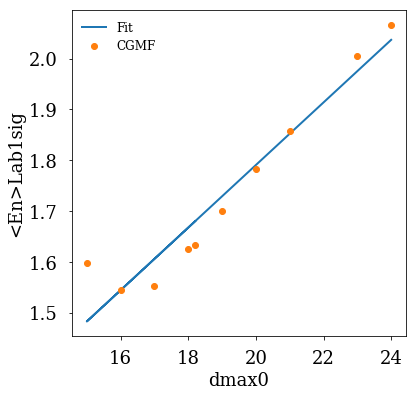

ACCEPTABLE LINEAR FIT between dmax0 and <Eg>Lab. 
chi^2/dof = 5.1E-03


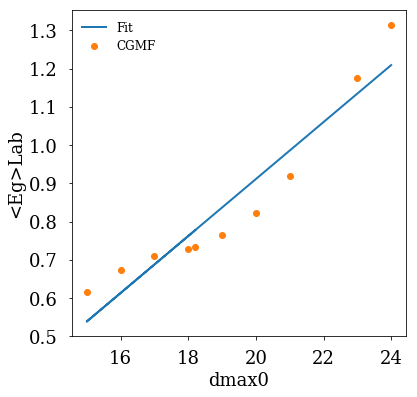

ACCEPTABLE LINEAR FIT between dmax0 and <Eg>Lab1sig. 
chi^2/dof = 8.8E-03


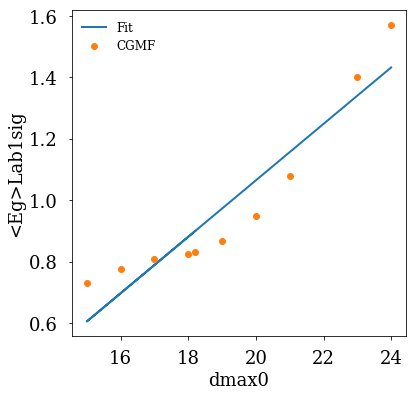

ACCEPTABLE LINEAR FIT between dmax1 and <TXE>. 
chi^2/dof = 1.5E-02


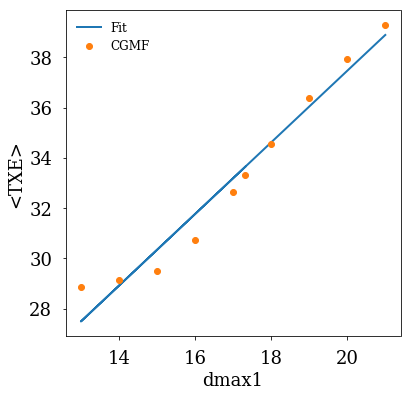

BAD LINEAR FIT between dmax1 and <TXE>1sig. 
chi^2/dof = 0.2


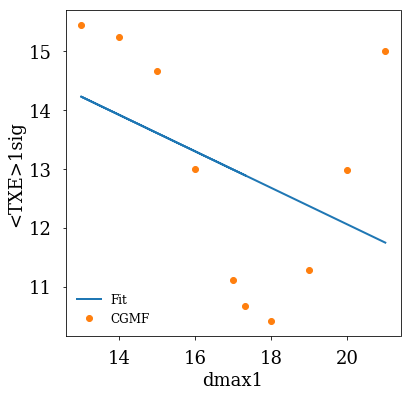

ACCEPTABLE LINEAR FIT between dmax1 and <TKE>. 
chi^2/dof = 2.3E-03


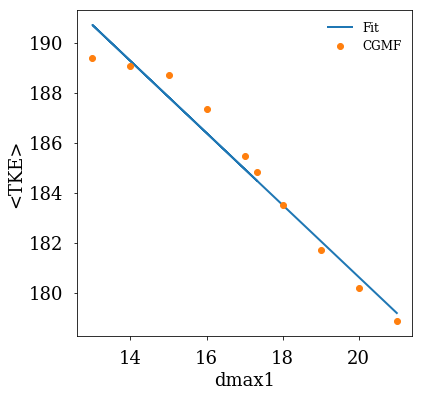

BAD LINEAR FIT between dmax1 and <TKE>1sig. 
chi^2/dof = 0.2


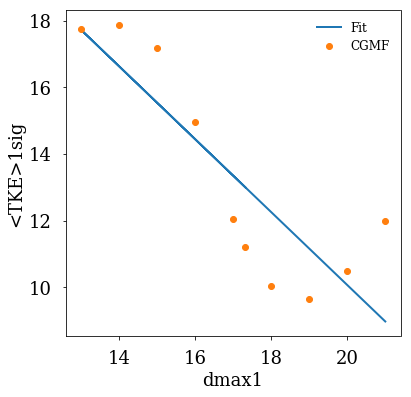

ACCEPTABLE LINEAR FIT between dmax1 and <J>. 
chi^2/dof = 3.6E-04


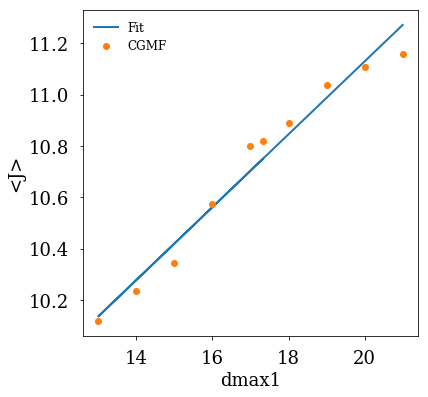

ACCEPTABLE LINEAR FIT between dmax1 and <J>1sig. 
chi^2/dof = 3.6E-04


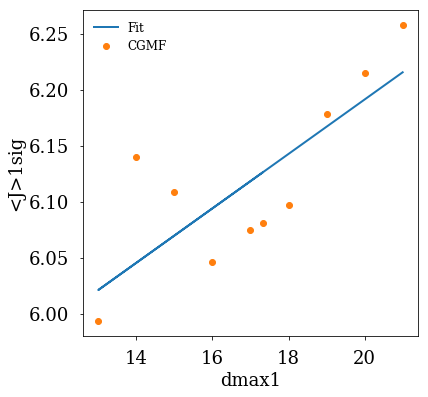

ACCEPTABLE LINEAR FIT between dmax1 and <nn>. 
chi^2/dof = 1.8E-03


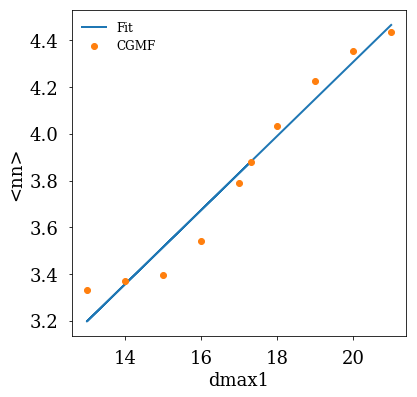

ACCEPTABLE LINEAR FIT between dmax1 and n-mom2. 
chi^2/dof = 4.3E-02


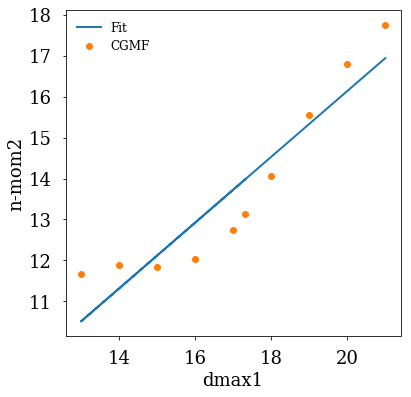

BAD LINEAR FIT between dmax1 and n-mom3. 
chi^2/dof = 0.5


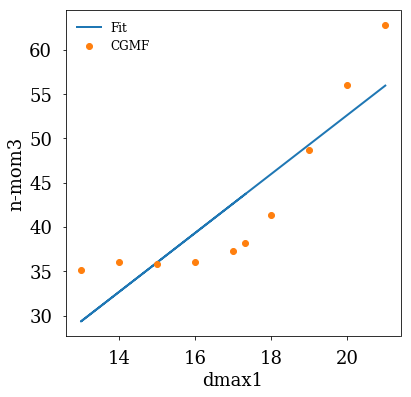

ACCEPTABLE LINEAR FIT between dmax1 and <ng>. 
chi^2/dof = 5.8E-04


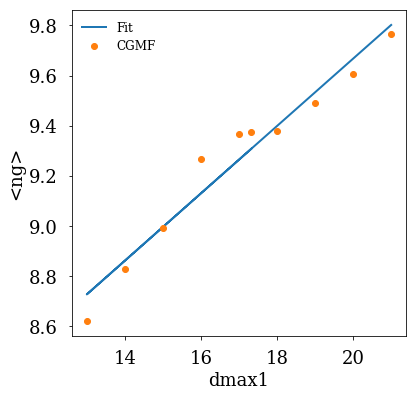

ACCEPTABLE LINEAR FIT between dmax1 and g-mom2. 
chi^2/dof = 8.5E-03


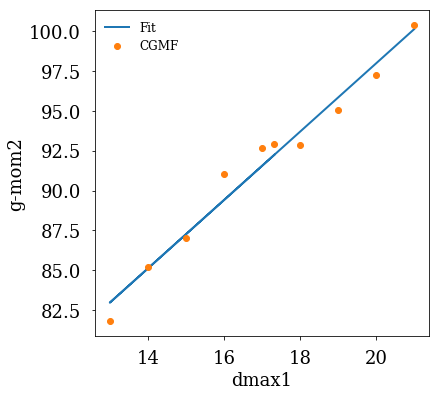

BAD LINEAR FIT between dmax1 and g-mom3. 
chi^2/dof = 0.1


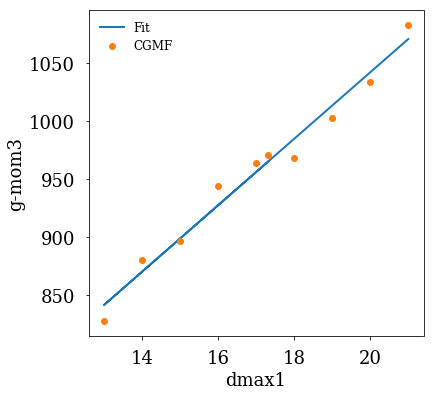

ACCEPTABLE LINEAR FIT between dmax1 and <En>CM. 
chi^2/dof = 6.8E-04


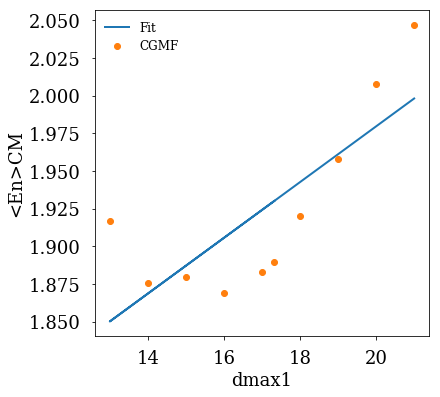

ACCEPTABLE LINEAR FIT between dmax1 and <En>CM1sig. 
chi^2/dof = 9.1E-04


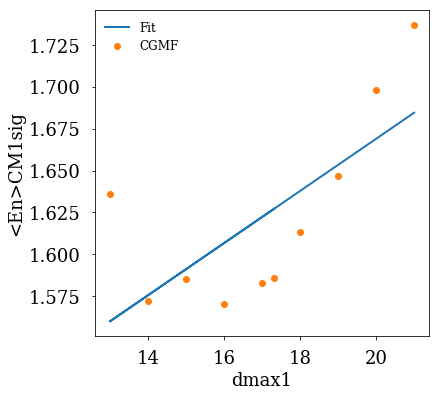

ACCEPTABLE LINEAR FIT between dmax1 and <Eg>CM. 
chi^2/dof = 4.3E-04


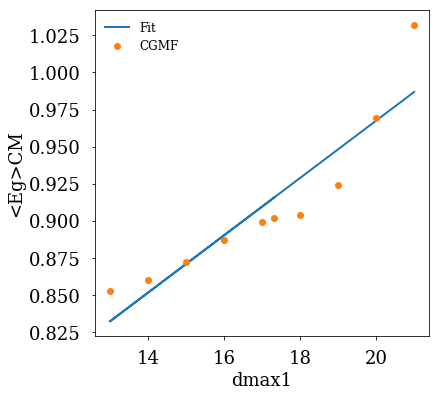

ACCEPTABLE LINEAR FIT between dmax1 and <Eg>CM1sig. 
chi^2/dof = 1.4E-03


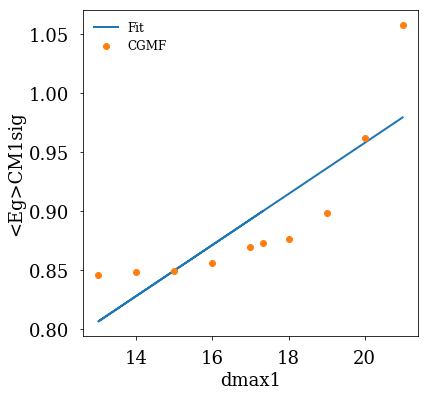

ACCEPTABLE LINEAR FIT between dmax1 and <En>Lab. 
chi^2/dof = 4.5E-04


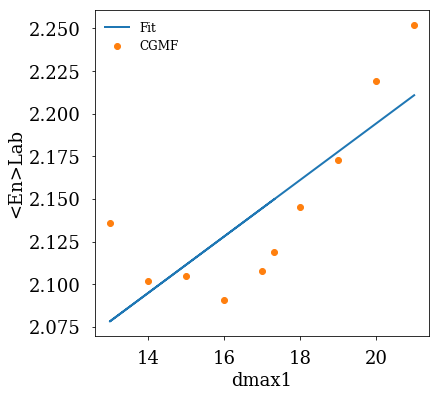

ACCEPTABLE LINEAR FIT between dmax1 and <En>Lab1sig. 
chi^2/dof = 8.2E-04


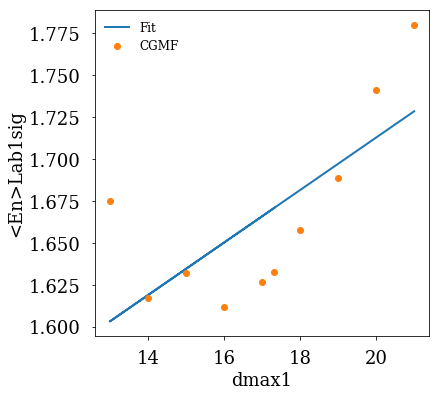

ACCEPTABLE LINEAR FIT between dmax1 and <Eg>Lab. 
chi^2/dof = 1.9E-04


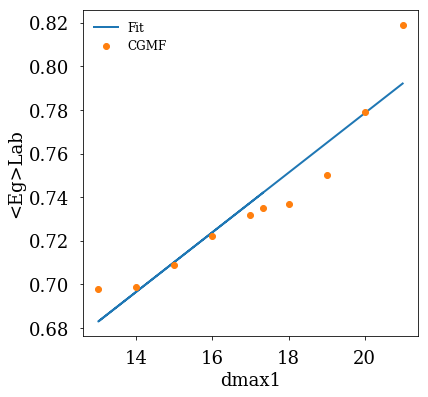

ACCEPTABLE LINEAR FIT between dmax1 and <Eg>Lab1sig. 
chi^2/dof = 9.2E-04


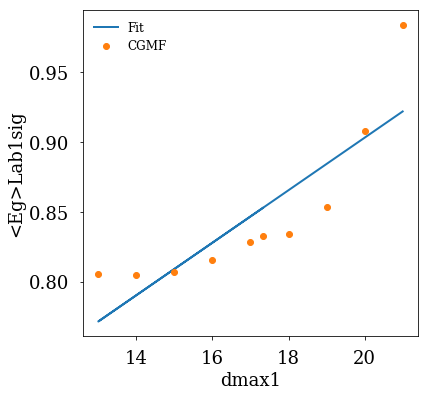

ACCEPTABLE LINEAR FIT between dmax2 and <TXE>. 
chi^2/dof = 5.7E-04


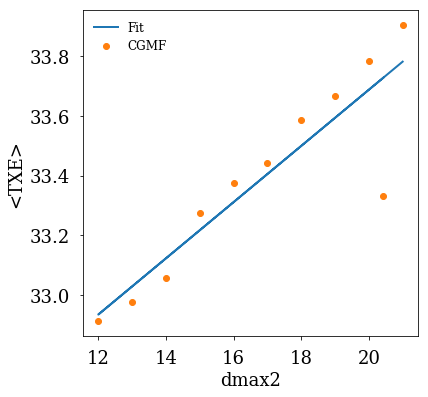

ACCEPTABLE LINEAR FIT between dmax2 and <TXE>1sig. 
chi^2/dof = 1.4E-02


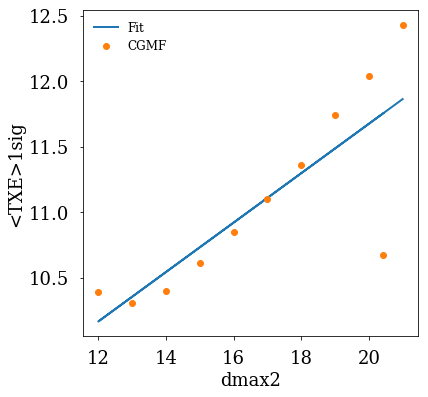

ACCEPTABLE LINEAR FIT between dmax2 and <TKE>. 
chi^2/dof = 1.3E-04


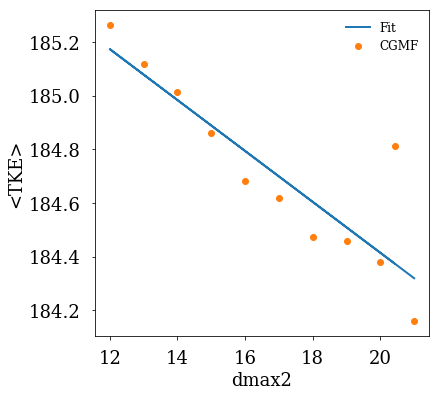

ACCEPTABLE LINEAR FIT between dmax2 and <TKE>1sig. 
chi^2/dof = 1.2E-02


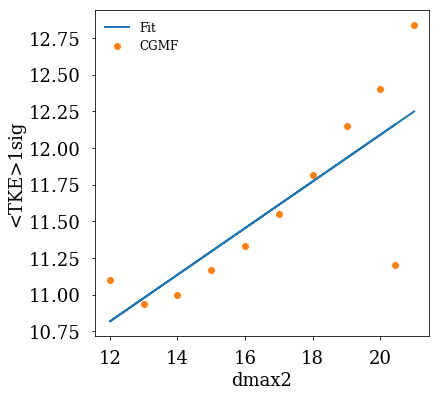

ACCEPTABLE LINEAR FIT between dmax2 and <J>. 
chi^2/dof = 2.5E-05


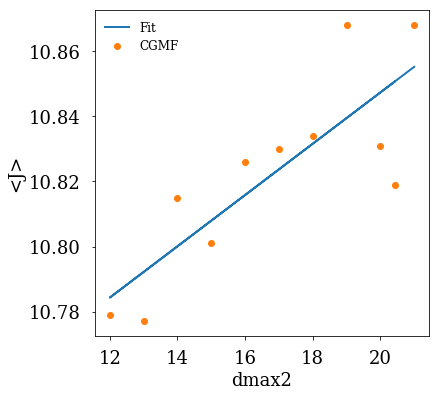

ACCEPTABLE LINEAR FIT between dmax2 and <J>1sig. 
chi^2/dof = 4.2E-05


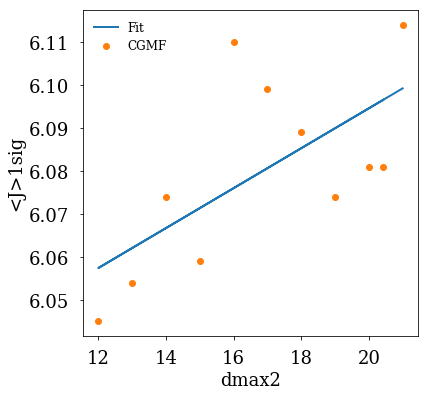

ACCEPTABLE LINEAR FIT between dmax2 and <nn>. 
chi^2/dof = 3.3E-05


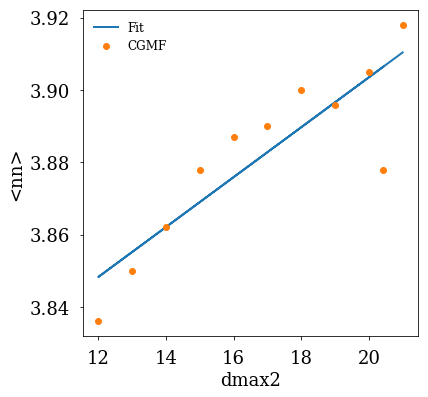

ACCEPTABLE LINEAR FIT between dmax2 and n-mom2. 
chi^2/dof = 8.9E-04


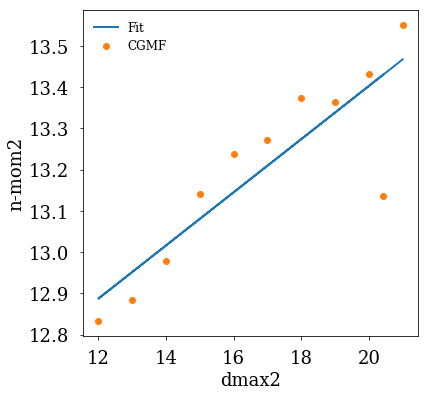

ACCEPTABLE LINEAR FIT between dmax2 and n-mom3. 
chi^2/dof = 1.3E-02


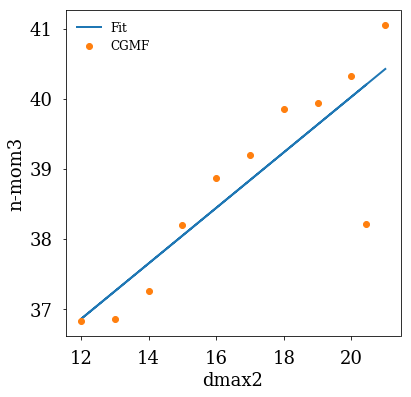

ACCEPTABLE LINEAR FIT between dmax2 and <ng>. 
chi^2/dof = 4.0E-05


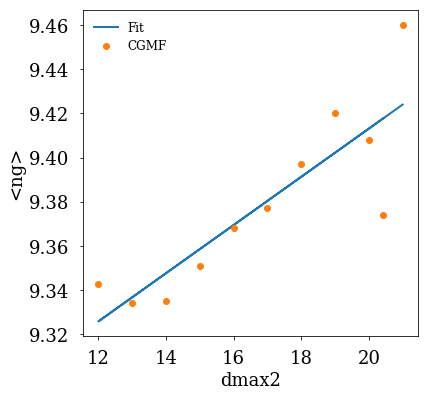

ACCEPTABLE LINEAR FIT between dmax2 and g-mom2. 
chi^2/dof = 2.1E-03


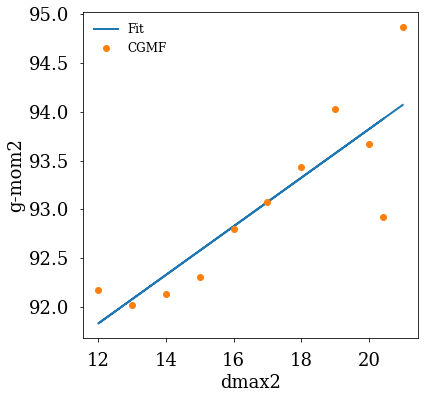

ACCEPTABLE LINEAR FIT between dmax2 and g-mom3. 
chi^2/dof = 6.3E-02


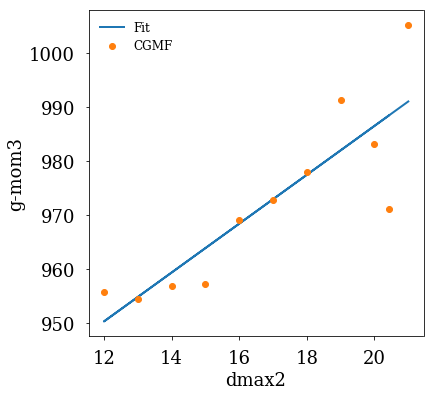

ACCEPTABLE LINEAR FIT between dmax2 and <En>CM. 
chi^2/dof = 1.7E-05


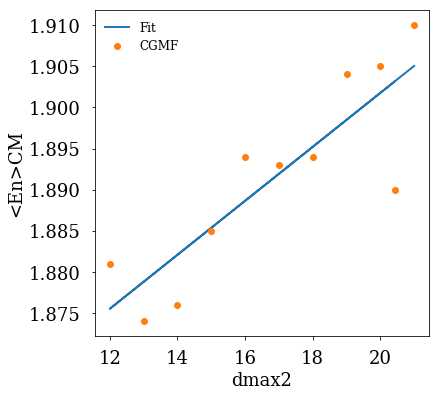

ACCEPTABLE LINEAR FIT between dmax2 and <En>CM1sig. 
chi^2/dof = 3.3E-05


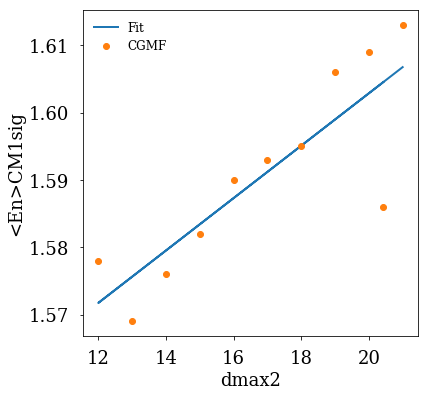

ACCEPTABLE LINEAR FIT between dmax2 and <Eg>CM. 
chi^2/dof = 4.7E-05


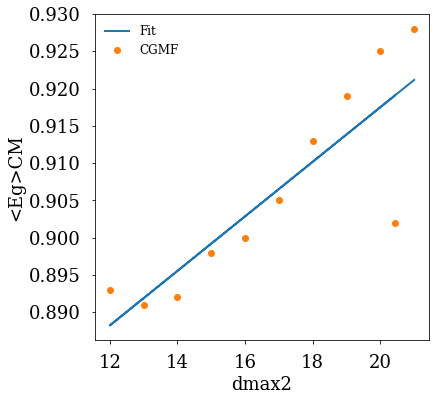

ACCEPTABLE LINEAR FIT between dmax2 and <Eg>CM1sig. 
chi^2/dof = 4.2E-04


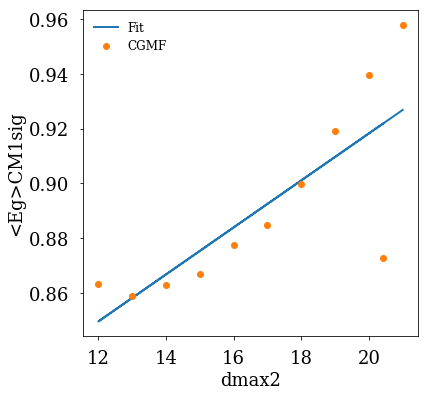

ACCEPTABLE LINEAR FIT between dmax2 and <En>Lab. 
chi^2/dof = 8.0E-06


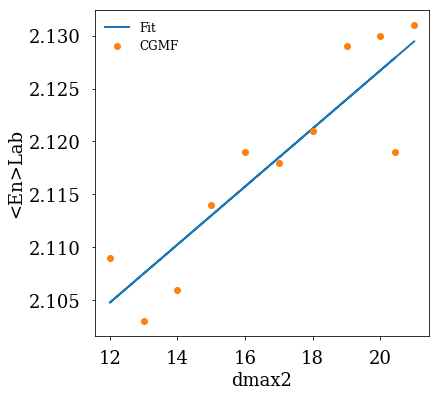

ACCEPTABLE LINEAR FIT between dmax2 and <En>Lab1sig. 
chi^2/dof = 2.3E-05


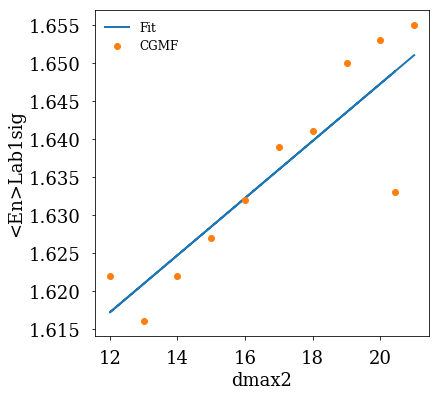

ACCEPTABLE LINEAR FIT between dmax2 and <Eg>Lab. 
chi^2/dof = 2.6E-05


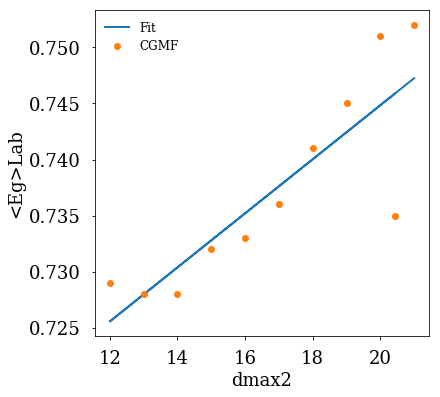

ACCEPTABLE LINEAR FIT between dmax2 and <Eg>Lab1sig. 
chi^2/dof = 2.6E-04


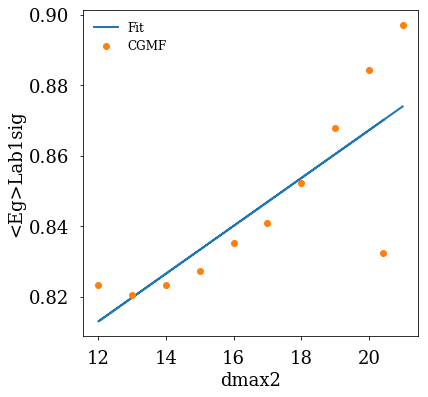

ACCEPTABLE LINEAR FIT between ddec0 and <TXE>. 
chi^2/dof = 2.1E-05


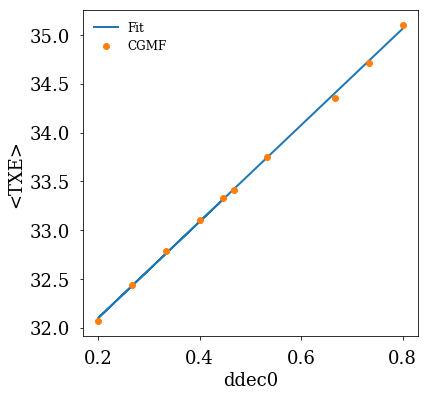

ACCEPTABLE LINEAR FIT between ddec0 and <TXE>1sig. 
chi^2/dof = 7.3E-04


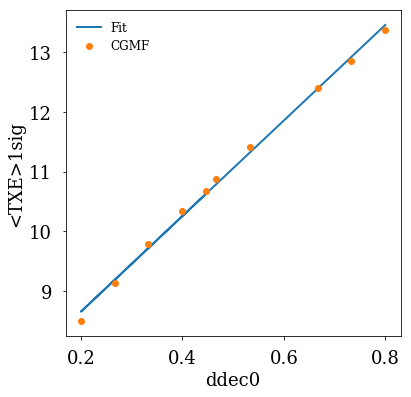

ACCEPTABLE LINEAR FIT between ddec0 and <TKE>. 
chi^2/dof = 8.2E-06


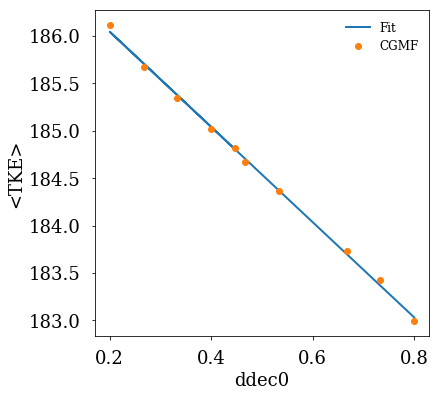

ACCEPTABLE LINEAR FIT between ddec0 and <TKE>1sig. 
chi^2/dof = 5.9E-04


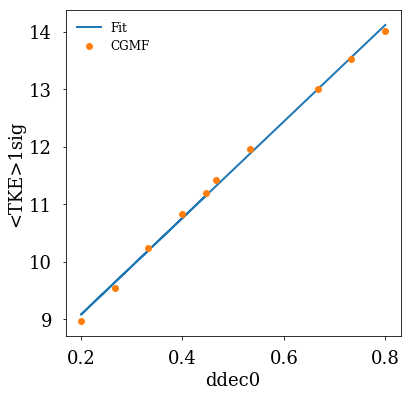

ACCEPTABLE LINEAR FIT between ddec0 and <J>. 
chi^2/dof = 1.5E-05


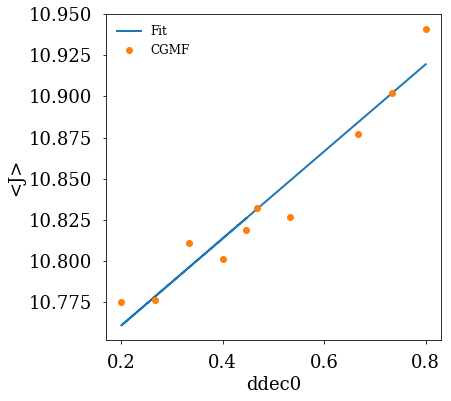

ACCEPTABLE LINEAR FIT between ddec0 and <J>1sig. 
chi^2/dof = 1.9E-05


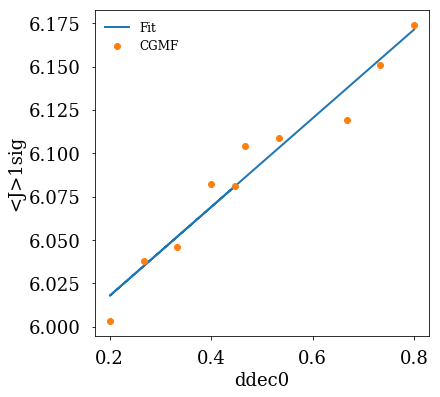

ACCEPTABLE LINEAR FIT between ddec0 and <nn>. 
chi^2/dof = 5.7E-06


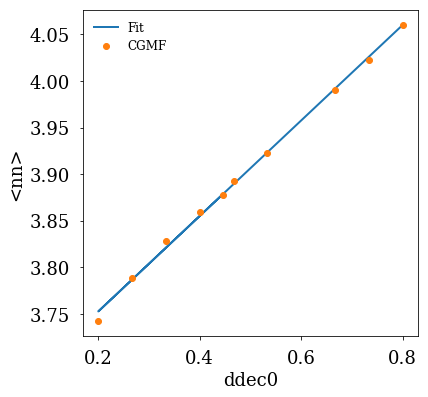

ACCEPTABLE LINEAR FIT between ddec0 and n-mom2. 
chi^2/dof = 1.4E-04


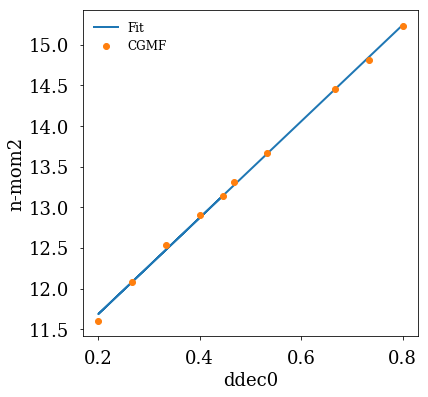

ACCEPTABLE LINEAR FIT between ddec0 and n-mom3. 
chi^2/dof = 7.7E-04


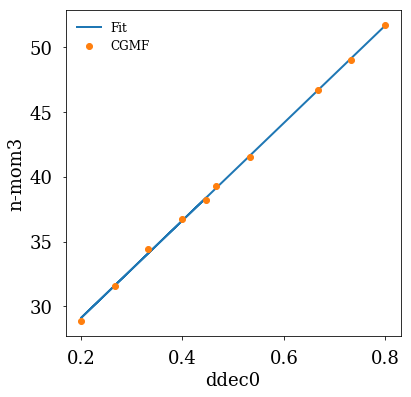

ACCEPTABLE LINEAR FIT between ddec0 and <ng>. 
chi^2/dof = 1.2E-05


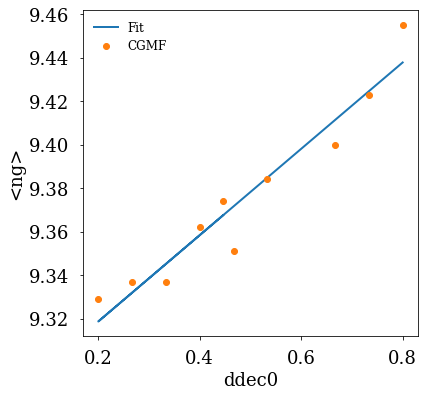

ACCEPTABLE LINEAR FIT between ddec0 and g-mom2. 
chi^2/dof = 4.1E-04


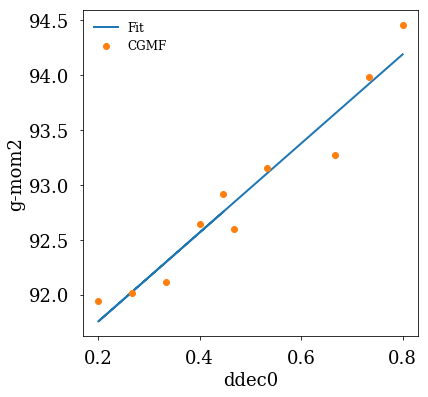

ACCEPTABLE LINEAR FIT between ddec0 and g-mom3. 
chi^2/dof = 1.5E-02


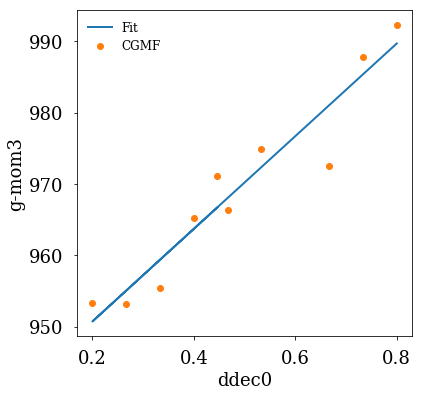

ACCEPTABLE LINEAR FIT between ddec0 and <En>CM. 
chi^2/dof = 4.9E-06


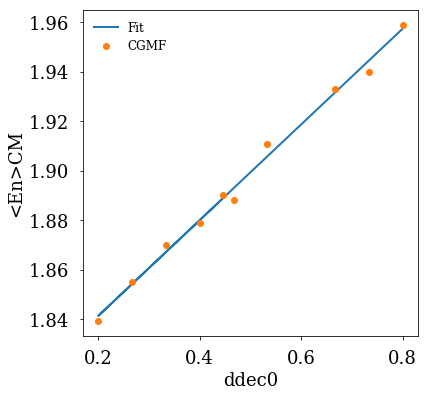

ACCEPTABLE LINEAR FIT between ddec0 and <En>CM1sig. 
chi^2/dof = 3.5E-06


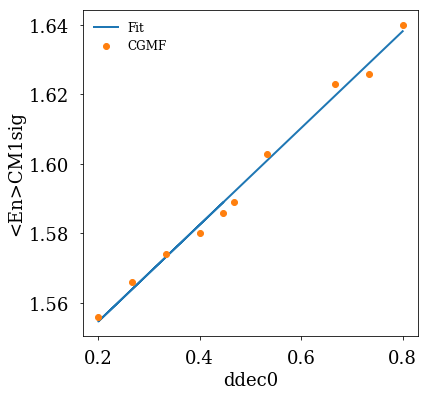

ACCEPTABLE LINEAR FIT between ddec0 and <Eg>CM. 
chi^2/dof = 7.1E-06


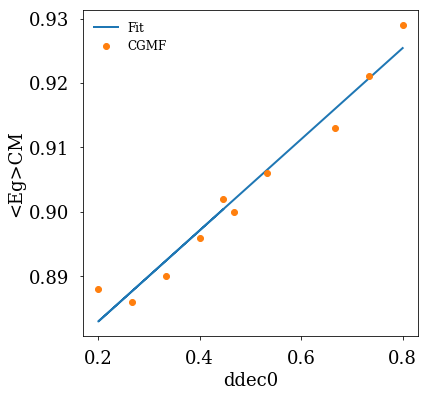

ACCEPTABLE LINEAR FIT between ddec0 and <Eg>CM1sig. 
chi^2/dof = 1.4E-05


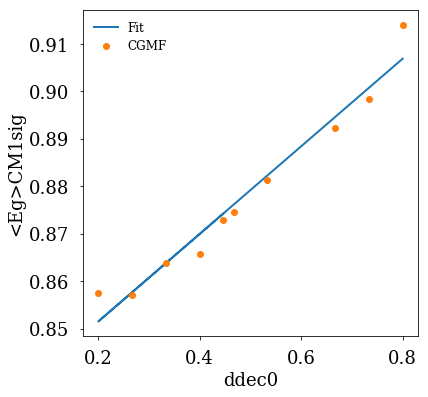

ACCEPTABLE LINEAR FIT between ddec0 and <En>Lab. 
chi^2/dof = 3.8E-06


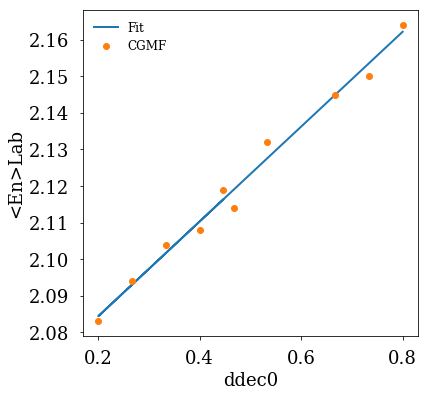

ACCEPTABLE LINEAR FIT between ddec0 and <En>Lab1sig. 
chi^2/dof = 4.4E-06


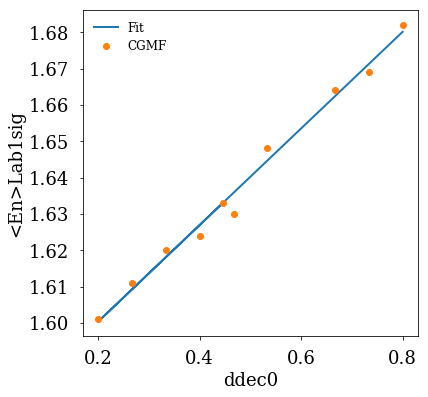

ACCEPTABLE LINEAR FIT between ddec0 and <Eg>Lab. 
chi^2/dof = 3.7E-06


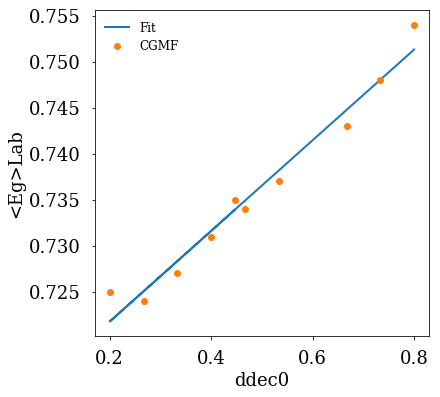

ACCEPTABLE LINEAR FIT between ddec0 and <Eg>Lab1sig. 
chi^2/dof = 1.1E-05


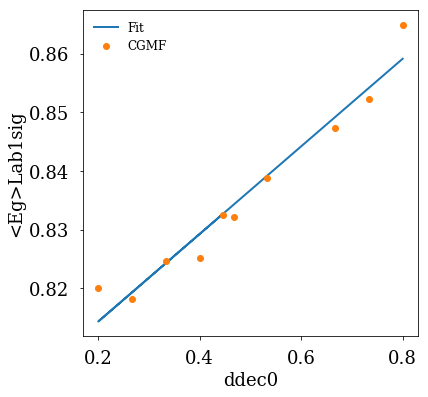

ACCEPTABLE LINEAR FIT between ddec1 and <TXE>. 
chi^2/dof = 5.1E-05


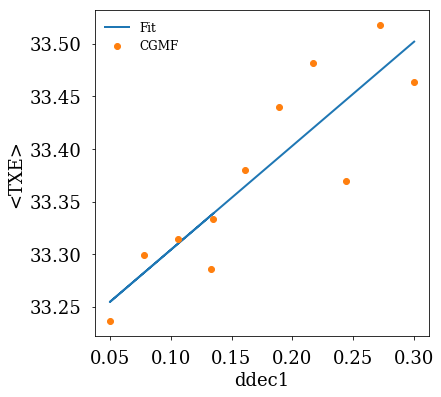

ACCEPTABLE LINEAR FIT between ddec1 and <TXE>1sig. 
chi^2/dof = 3.4E-05


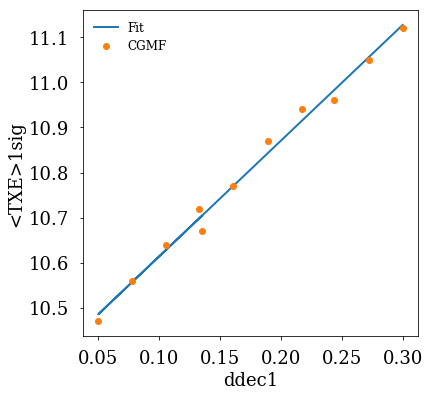

ACCEPTABLE LINEAR FIT between ddec1 and <TKE>. 
chi^2/dof = 1.3E-05


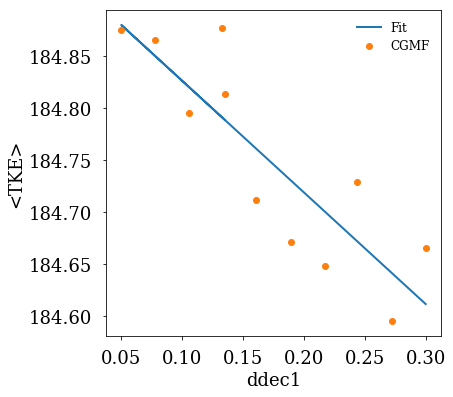

ACCEPTABLE LINEAR FIT between ddec1 and <TKE>1sig. 
chi^2/dof = 8.0E-05


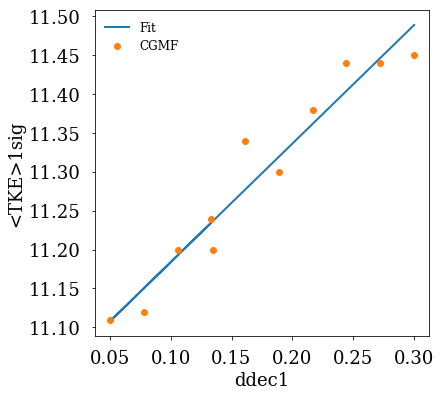

ACCEPTABLE LINEAR FIT between ddec1 and <J>. 
chi^2/dof = 6.7E-06


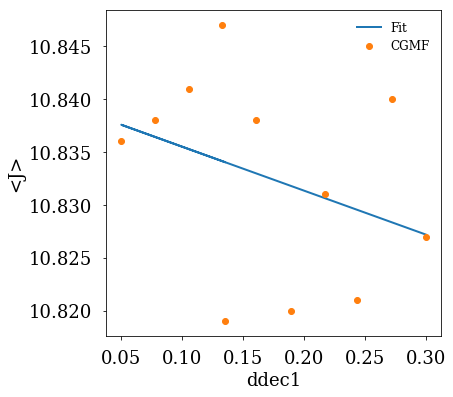

ACCEPTABLE LINEAR FIT between ddec1 and <J>1sig. 
chi^2/dof = 1.6E-05


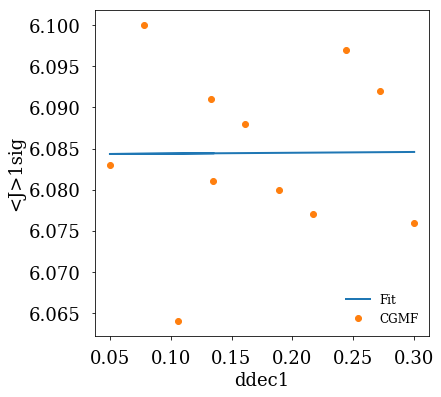

ACCEPTABLE LINEAR FIT between ddec1 and <nn>. 
chi^2/dof = 7.0E-06


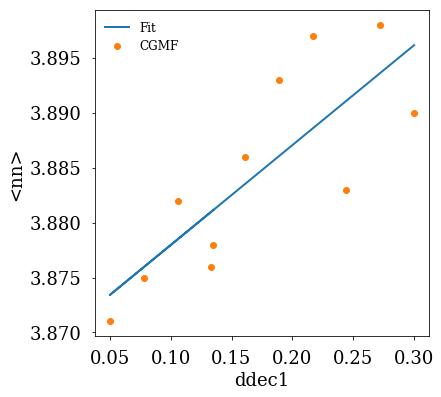

ACCEPTABLE LINEAR FIT between ddec1 and n-mom2. 
chi^2/dof = 1.1E-04


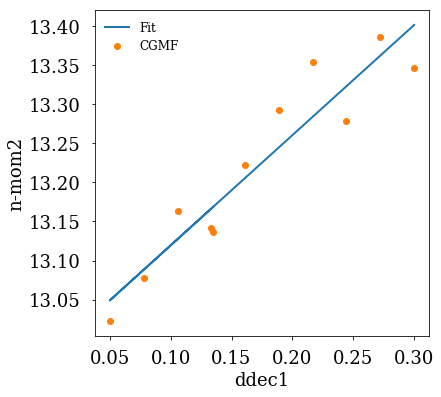

ACCEPTABLE LINEAR FIT between ddec1 and n-mom3. 
chi^2/dof = 7.9E-04


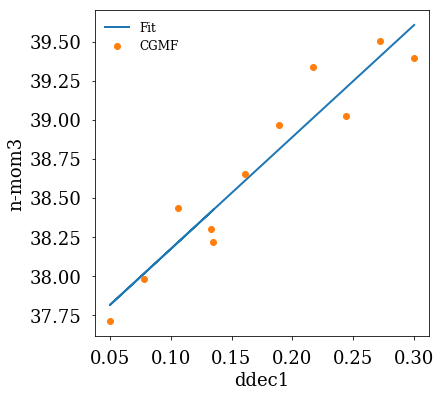

ACCEPTABLE LINEAR FIT between ddec1 and <ng>. 
chi^2/dof = 1.9E-06


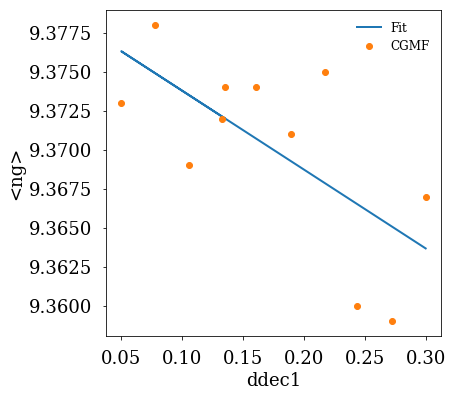

ACCEPTABLE LINEAR FIT between ddec1 and g-mom2. 
chi^2/dof = 1.8E-04


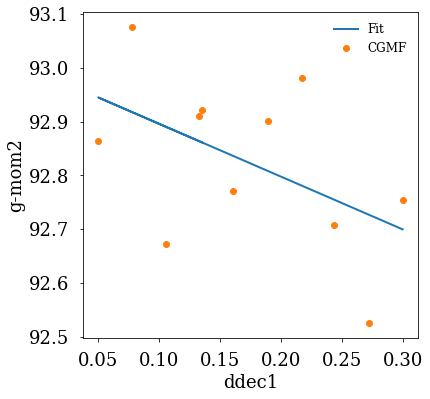

ACCEPTABLE LINEAR FIT between ddec1 and g-mom3. 
chi^2/dof = 1.0E-02


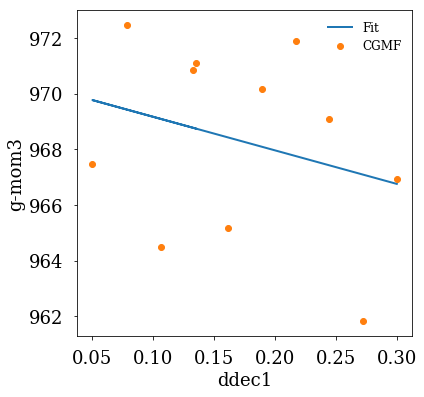

ACCEPTABLE LINEAR FIT between ddec1 and <En>CM. 
chi^2/dof = 2.3E-06


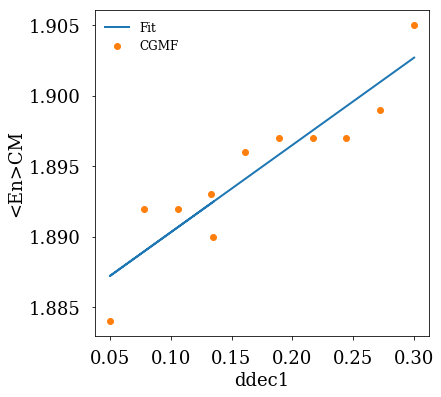

ACCEPTABLE LINEAR FIT between ddec1 and <En>CM1sig. 
chi^2/dof = 8.3E-06


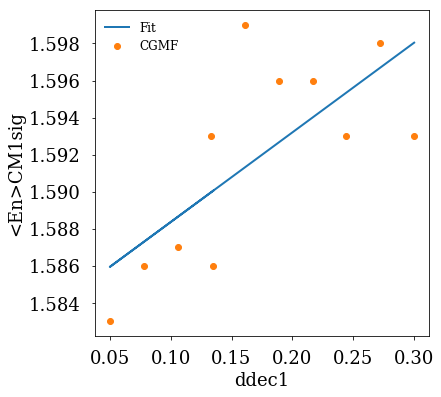

ACCEPTABLE LINEAR FIT between ddec1 and <Eg>CM. 
chi^2/dof = 2.9E-06


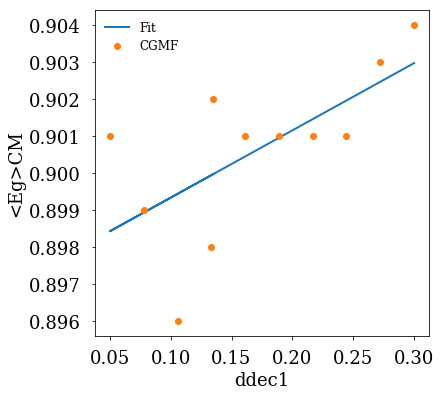

ACCEPTABLE LINEAR FIT between ddec1 and <Eg>CM1sig. 
chi^2/dof = 5.8E-06


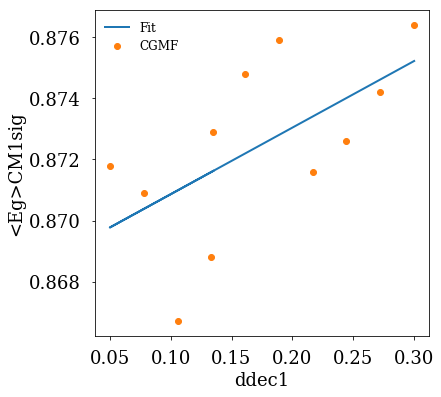

ACCEPTABLE LINEAR FIT between ddec1 and <En>Lab. 
chi^2/dof = 9.8E-07


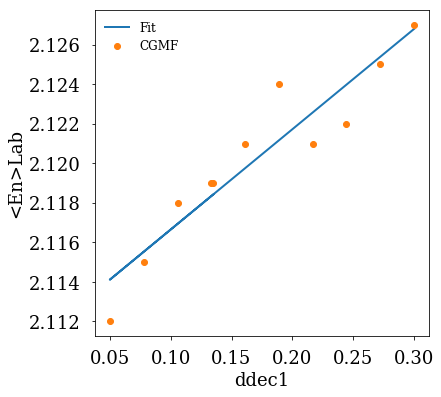

ACCEPTABLE LINEAR FIT between ddec1 and <En>Lab1sig. 
chi^2/dof = 3.0E-06


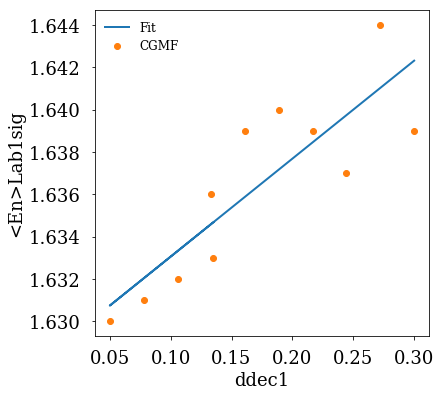

ACCEPTABLE LINEAR FIT between ddec1 and <Eg>Lab. 
chi^2/dof = 1.6E-06


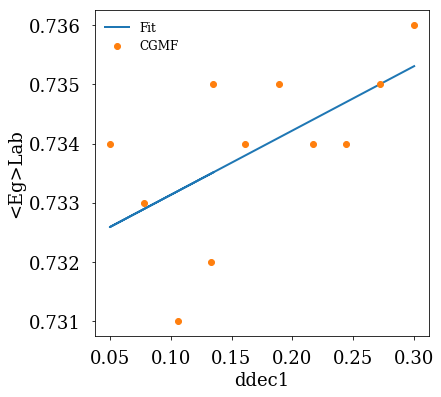

ACCEPTABLE LINEAR FIT between ddec1 and <Eg>Lab1sig. 
chi^2/dof = 4.2E-06


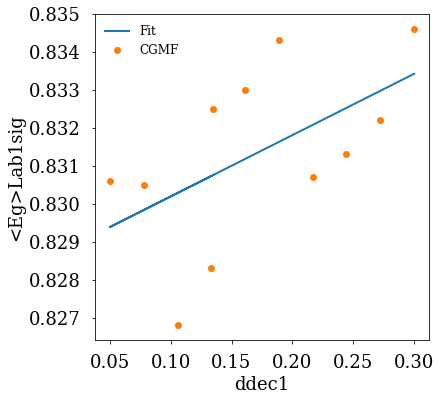

ACCEPTABLE LINEAR FIT between ddec2 and <TXE>. 
chi^2/dof = 2.6E-05


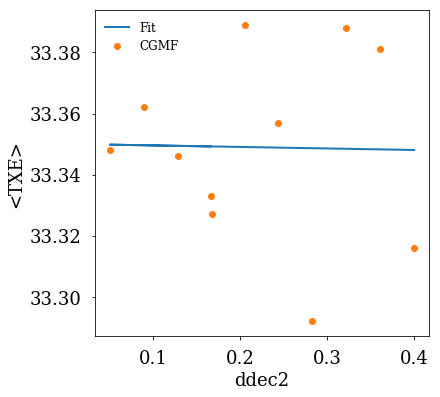

ACCEPTABLE LINEAR FIT between ddec2 and <TXE>1sig. 
chi^2/dof = 4.2E-05


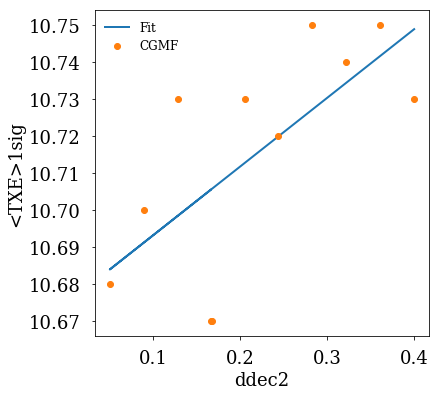

ACCEPTABLE LINEAR FIT between ddec2 and <TKE>. 
chi^2/dof = 9.2E-06


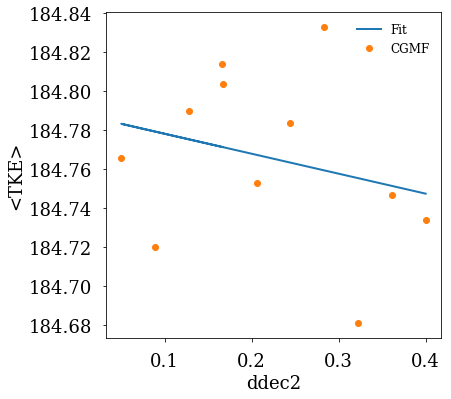

ACCEPTABLE LINEAR FIT between ddec2 and <TKE>1sig. 
chi^2/dof = 3.3E-05


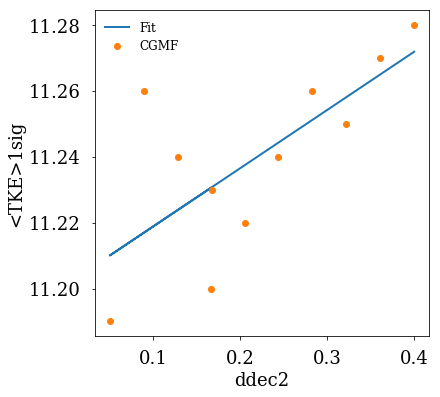

ACCEPTABLE LINEAR FIT between ddec2 and <J>. 
chi^2/dof = 9.8E-06


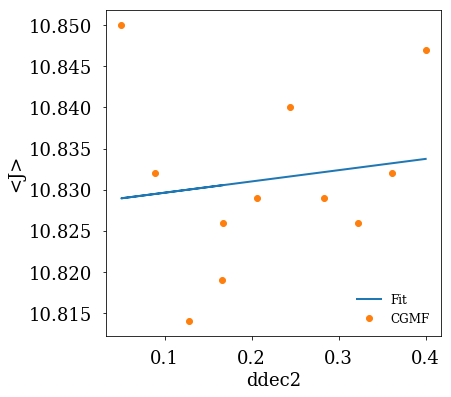

ACCEPTABLE LINEAR FIT between ddec2 and <J>1sig. 
chi^2/dof = 2.0E-05


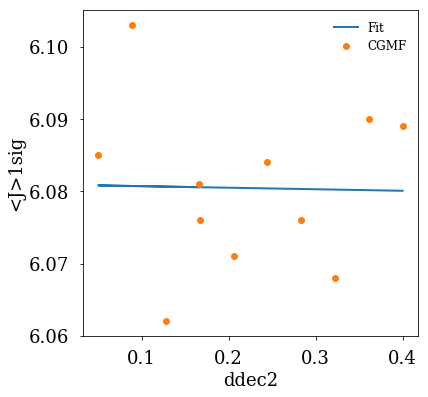

ACCEPTABLE LINEAR FIT between ddec2 and <nn>. 
chi^2/dof = 5.6E-06


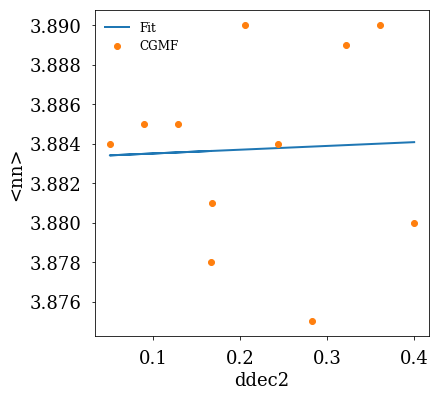

ACCEPTABLE LINEAR FIT between ddec2 and n-mom2. 
chi^2/dof = 7.9E-05


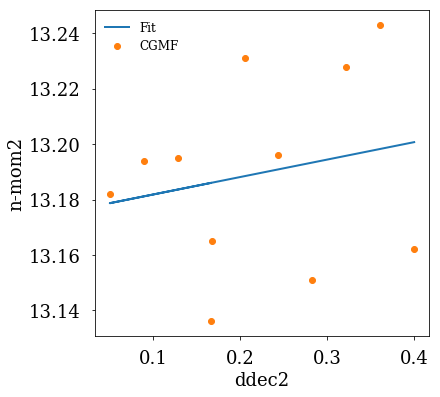

ACCEPTABLE LINEAR FIT between ddec2 and n-mom3. 
chi^2/dof = 5.1E-04


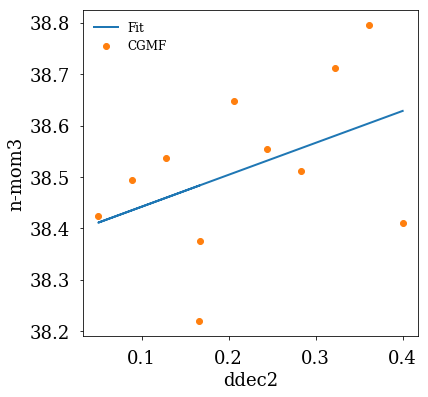

ACCEPTABLE LINEAR FIT between ddec2 and <ng>. 
chi^2/dof = 1.5E-05


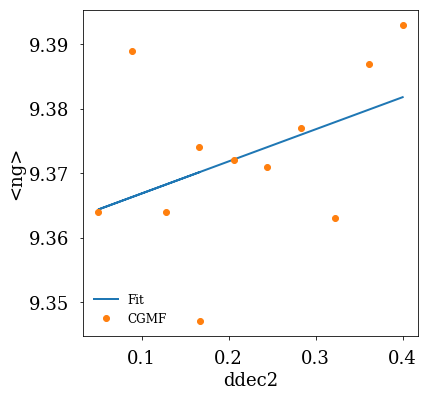

ACCEPTABLE LINEAR FIT between ddec2 and g-mom2. 
chi^2/dof = 8.5E-04


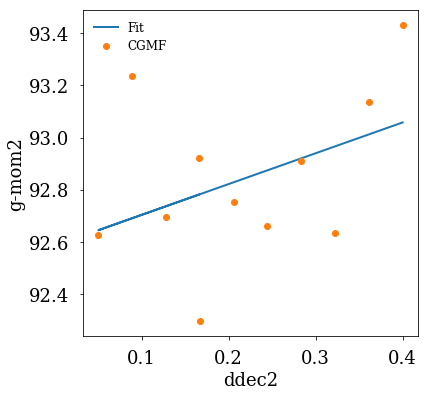

ACCEPTABLE LINEAR FIT between ddec2 and g-mom3. 
chi^2/dof = 3.2E-02


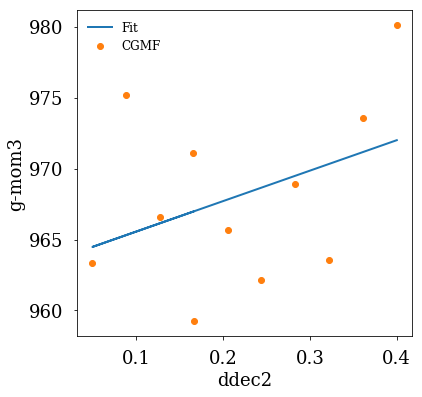

ACCEPTABLE LINEAR FIT between ddec2 and <En>CM. 
chi^2/dof = 4.0E-06


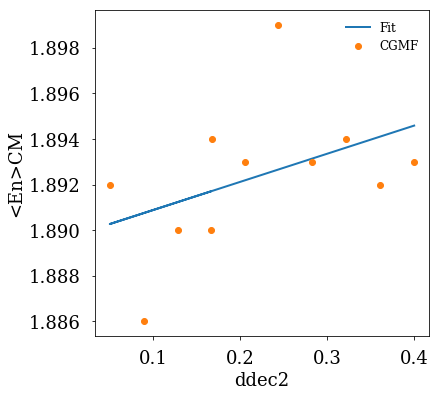

ACCEPTABLE LINEAR FIT between ddec2 and <En>CM1sig. 
chi^2/dof = 4.8E-06


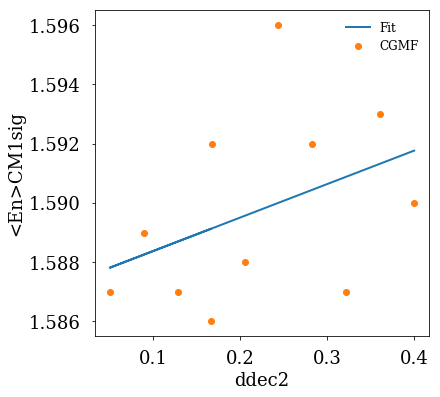

ACCEPTABLE LINEAR FIT between ddec2 and <Eg>CM. 
chi^2/dof = 1.6E-06


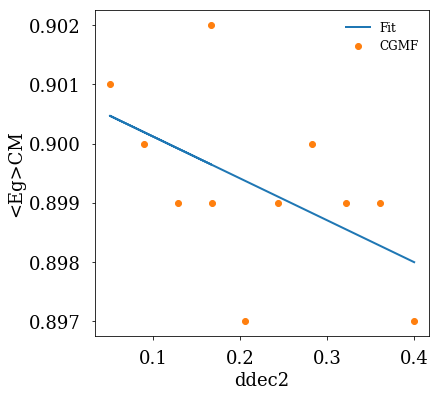

ACCEPTABLE LINEAR FIT between ddec2 and <Eg>CM1sig. 
chi^2/dof = 4.6E-06


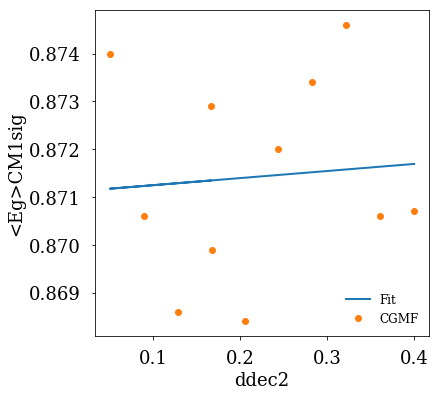

ACCEPTABLE LINEAR FIT between ddec2 and <En>Lab. 
chi^2/dof = 6.3E-06


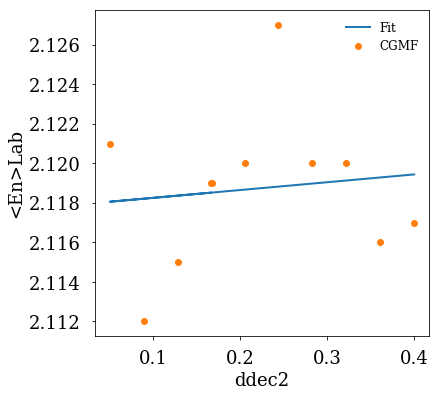

ACCEPTABLE LINEAR FIT between ddec2 and <En>Lab1sig. 
chi^2/dof = 3.3E-06


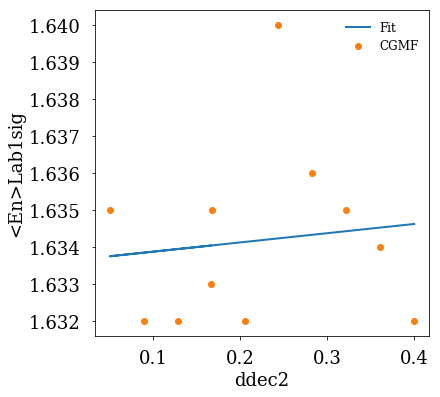

ACCEPTABLE LINEAR FIT between ddec2 and <Eg>Lab. 
chi^2/dof = 1.4E-06


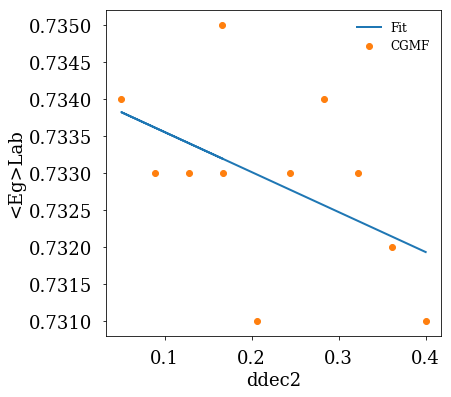

ACCEPTABLE LINEAR FIT between ddec2 and <Eg>Lab1sig. 
chi^2/dof = 4.0E-06


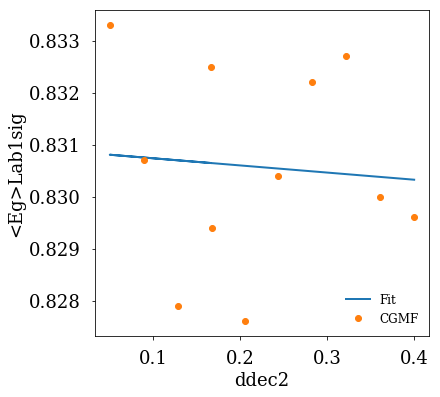

ACCEPTABLE LINEAR FIT between Abar0 and <TXE>. 
chi^2/dof = 9.3E-04


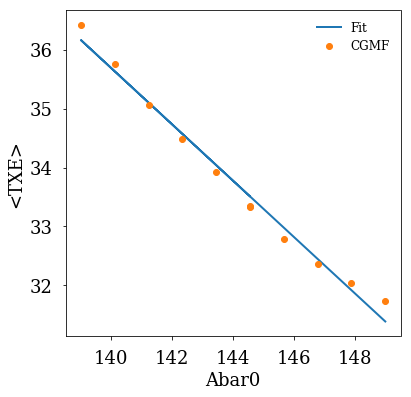

ACCEPTABLE LINEAR FIT between Abar0 and <TXE>1sig. 
chi^2/dof = 7.6E-05


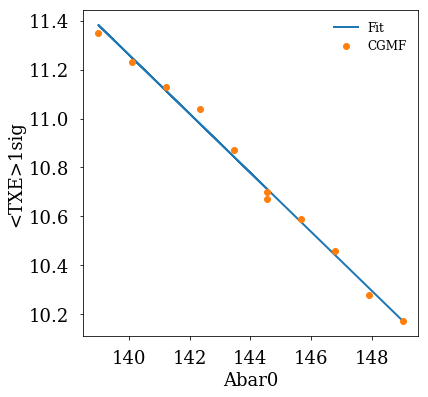

ACCEPTABLE LINEAR FIT between Abar0 and <TKE>. 
chi^2/dof = 5.2E-05


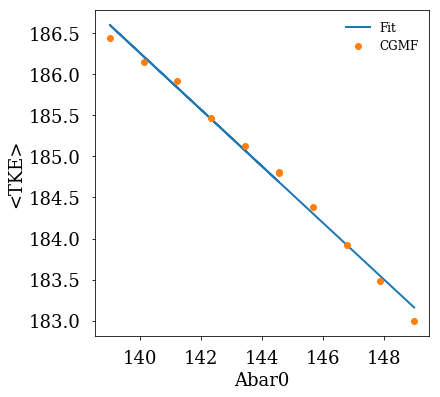

ACCEPTABLE LINEAR FIT between Abar0 and <TKE>1sig. 
chi^2/dof = 1.3E-04


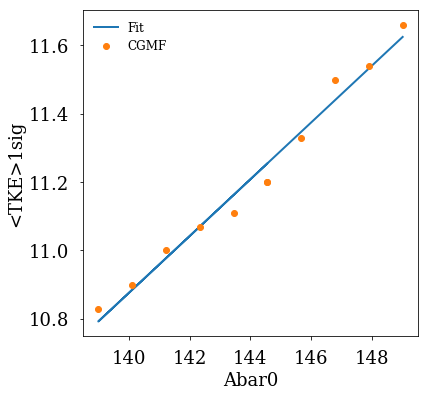

ACCEPTABLE LINEAR FIT between Abar0 and <J>. 
chi^2/dof = 2.3E-05


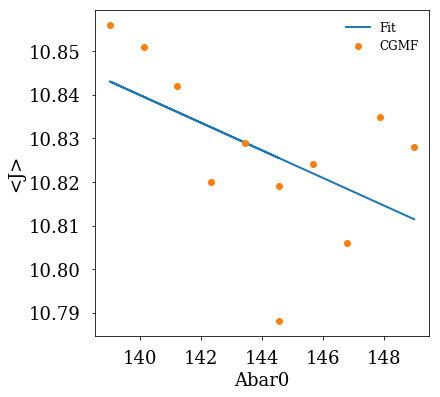

ACCEPTABLE LINEAR FIT between Abar0 and <J>1sig. 
chi^2/dof = 5.0E-05


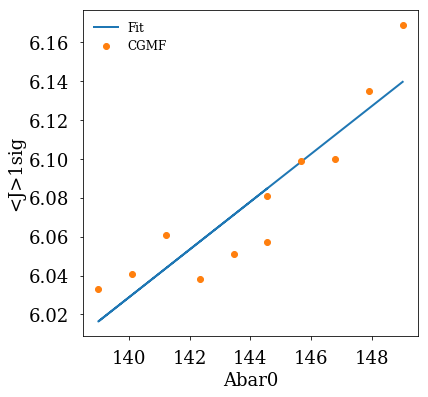

ACCEPTABLE LINEAR FIT between Abar0 and <nn>. 
chi^2/dof = 7.5E-06


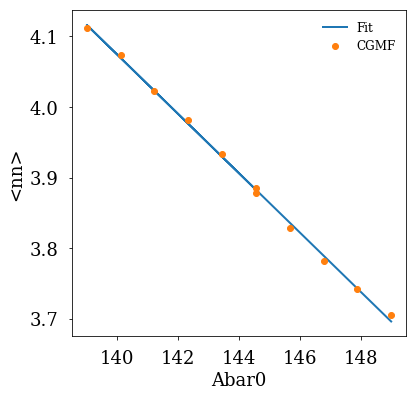

ACCEPTABLE LINEAR FIT between Abar0 and n-mom2. 
chi^2/dof = 1.1E-04


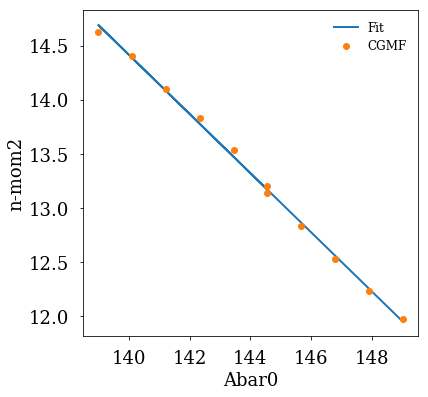

ACCEPTABLE LINEAR FIT between Abar0 and n-mom3. 
chi^2/dof = 1.6E-03


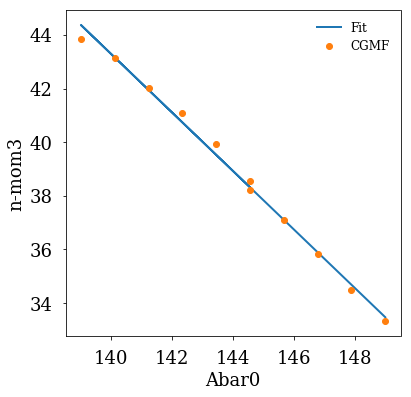

ACCEPTABLE LINEAR FIT between Abar0 and <ng>. 
chi^2/dof = 7.0E-05


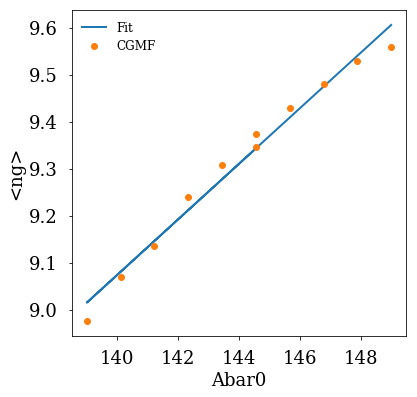

ACCEPTABLE LINEAR FIT between Abar0 and g-mom2. 
chi^2/dof = 2.4E-03


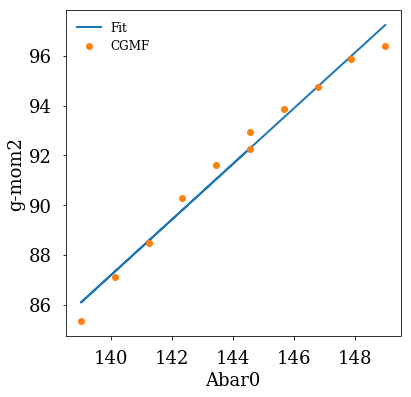

ACCEPTABLE LINEAR FIT between Abar0 and g-mom3. 
chi^2/dof = 5.8E-02


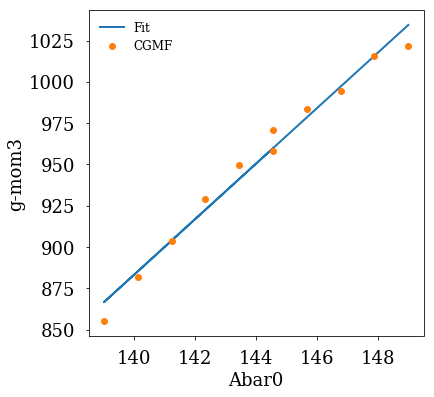

ACCEPTABLE LINEAR FIT between Abar0 and <En>CM. 
chi^2/dof = 4.2E-05


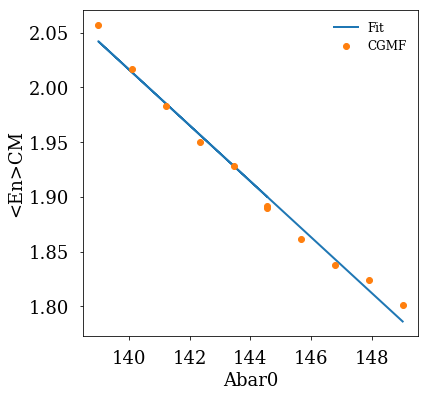

ACCEPTABLE LINEAR FIT between Abar0 and <En>CM1sig. 
chi^2/dof = 2.0E-05


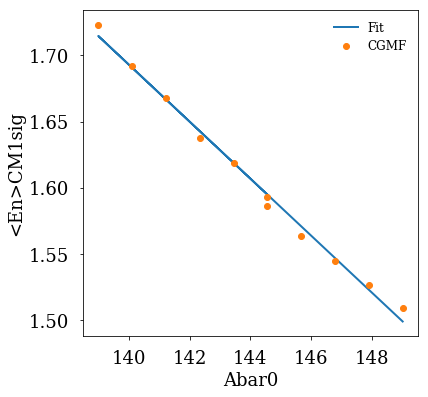

ACCEPTABLE LINEAR FIT between Abar0 and <Eg>CM. 
chi^2/dof = 9.8E-05


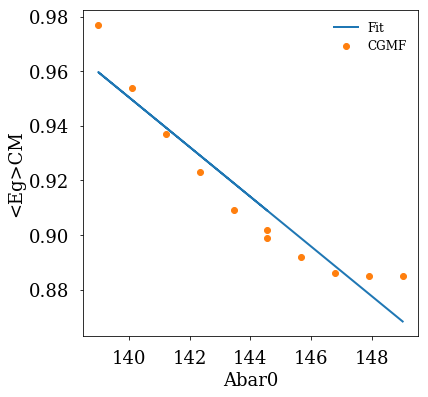

ACCEPTABLE LINEAR FIT between Abar0 and <Eg>CM1sig. 
chi^2/dof = 3.7E-05


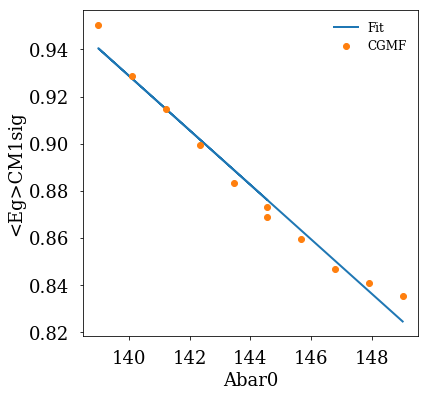

ACCEPTABLE LINEAR FIT between Abar0 and <En>Lab. 
chi^2/dof = 1.1E-05


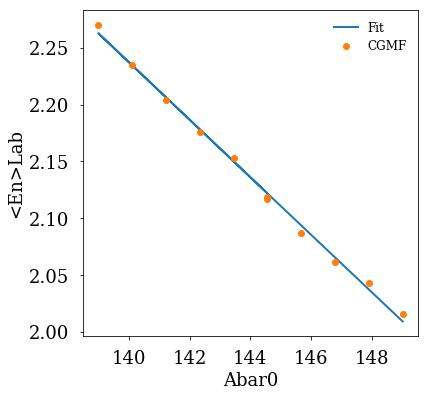

ACCEPTABLE LINEAR FIT between Abar0 and <En>Lab1sig. 
chi^2/dof = 1.2E-05


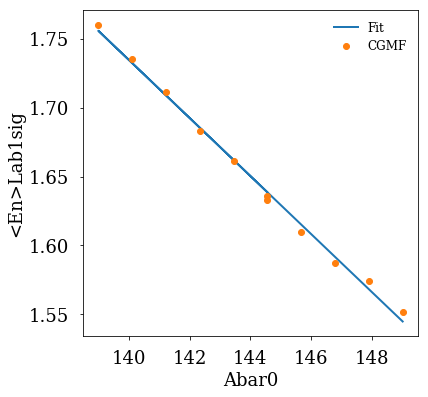

ACCEPTABLE LINEAR FIT between Abar0 and <Eg>Lab. 
chi^2/dof = 8.6E-05


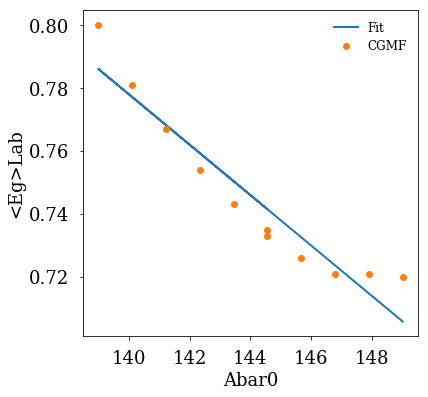

ACCEPTABLE LINEAR FIT between Abar0 and <Eg>Lab1sig. 
chi^2/dof = 4.4E-05


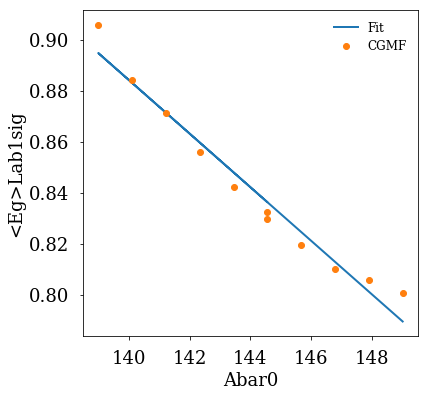

ACCEPTABLE LINEAR FIT between Abar1 and <TXE>. 
chi^2/dof = 3.4E-04


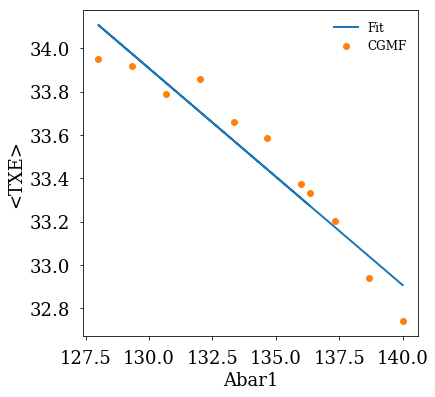

ACCEPTABLE LINEAR FIT between Abar1 and <TXE>1sig. 
chi^2/dof = 4.3E-04


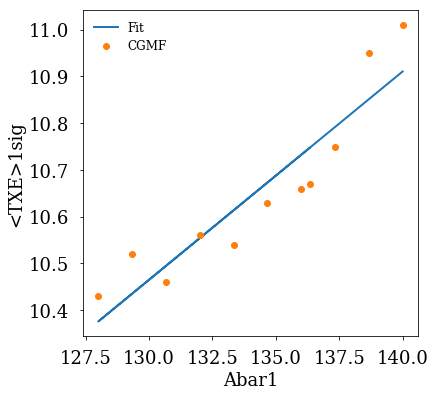

ACCEPTABLE LINEAR FIT between Abar1 and <TKE>. 
chi^2/dof = 1.3E-05


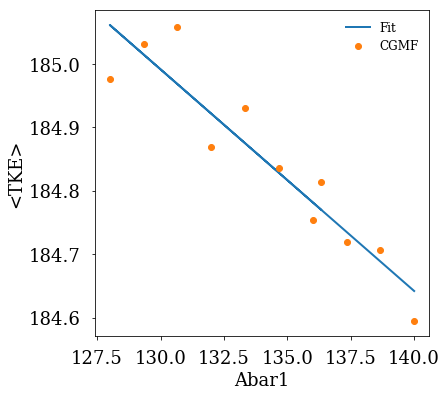

ACCEPTABLE LINEAR FIT between Abar1 and <TKE>1sig. 
chi^2/dof = 7.3E-05


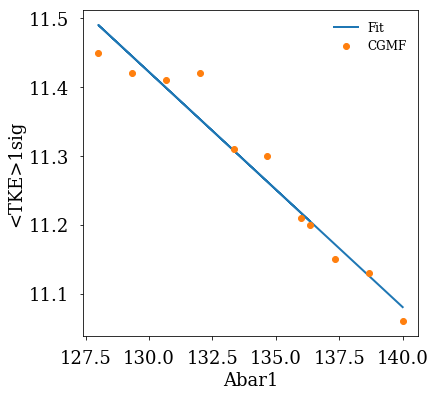

ACCEPTABLE LINEAR FIT between Abar1 and <J>. 
chi^2/dof = 3.8E-05


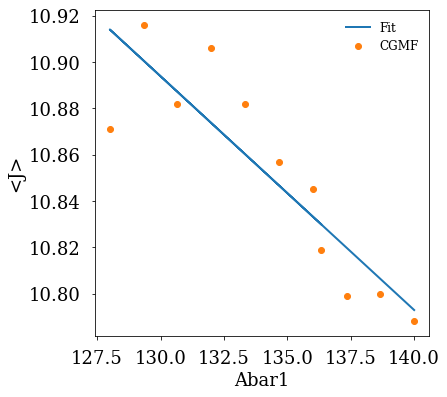

ACCEPTABLE LINEAR FIT between Abar1 and <J>1sig. 
chi^2/dof = 3.4E-05


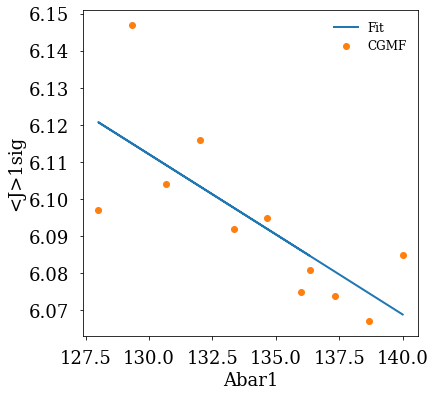

ACCEPTABLE LINEAR FIT between Abar1 and <nn>. 
chi^2/dof = 3.9E-05


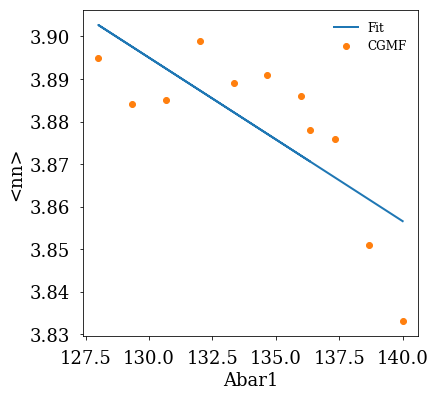

ACCEPTABLE LINEAR FIT between Abar1 and n-mom2. 
chi^2/dof = 2.8E-04


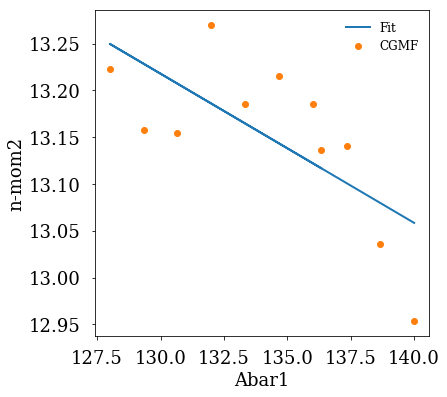

ACCEPTABLE LINEAR FIT between Abar1 and n-mom3. 
chi^2/dof = 1.1E-03


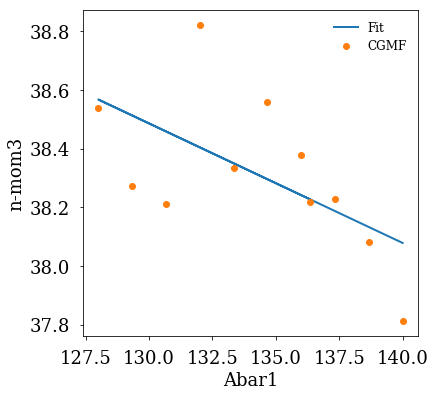

ACCEPTABLE LINEAR FIT between Abar1 and <ng>. 
chi^2/dof = 6.2E-05


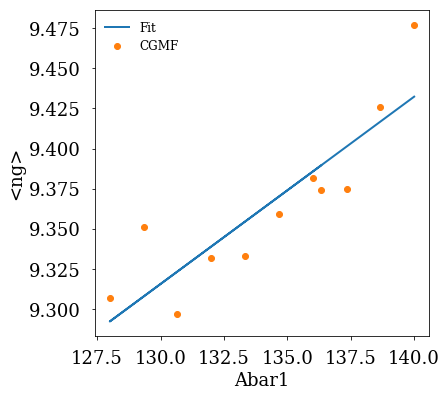

ACCEPTABLE LINEAR FIT between Abar1 and g-mom2. 
chi^2/dof = 2.6E-03


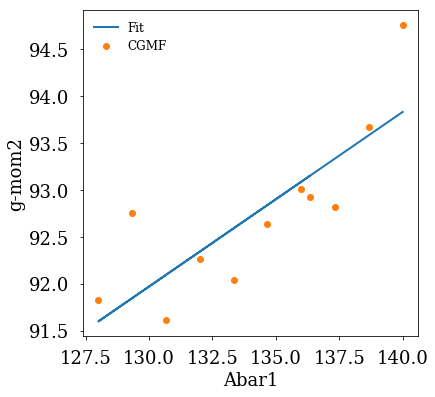

ACCEPTABLE LINEAR FIT between Abar1 and g-mom3. 
chi^2/dof = 6.2E-02


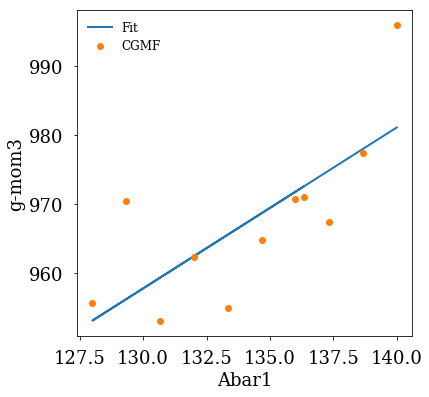

ACCEPTABLE LINEAR FIT between Abar1 and <En>CM. 
chi^2/dof = 1.9E-05


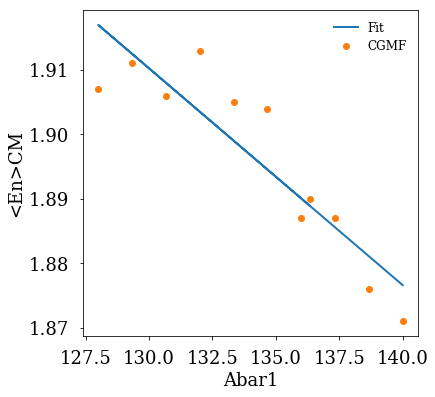

ACCEPTABLE LINEAR FIT between Abar1 and <En>CM1sig. 
chi^2/dof = 1.3E-05


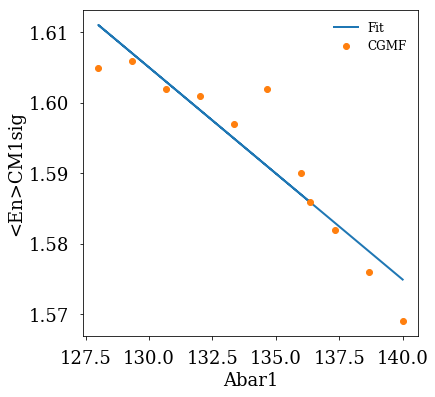

ACCEPTABLE LINEAR FIT between Abar1 and <Eg>CM. 
chi^2/dof = 9.0E-06


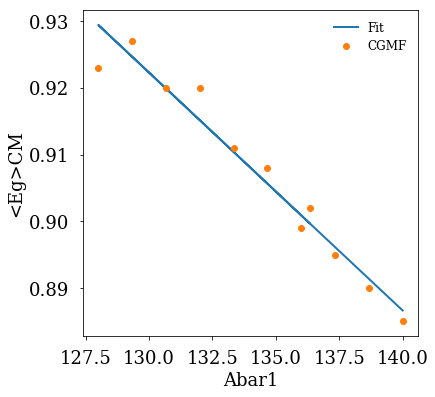

ACCEPTABLE LINEAR FIT between Abar1 and <Eg>CM1sig. 
chi^2/dof = 8.1E-06


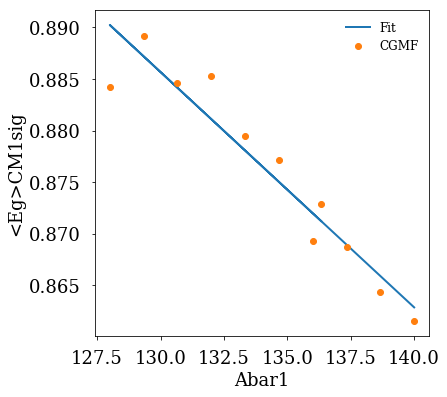

ACCEPTABLE LINEAR FIT between Abar1 and <En>Lab. 
chi^2/dof = 2.0E-05


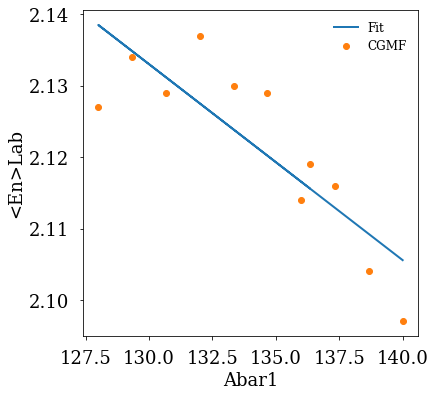

ACCEPTABLE LINEAR FIT between Abar1 and <En>Lab1sig. 
chi^2/dof = 1.2E-05


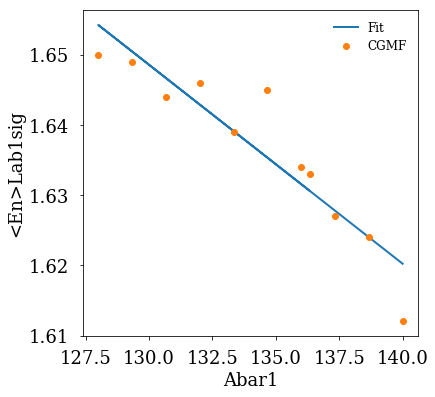

ACCEPTABLE LINEAR FIT between Abar1 and <Eg>Lab. 
chi^2/dof = 6.6E-06


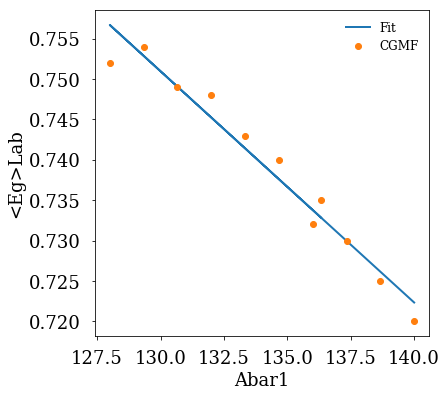

ACCEPTABLE LINEAR FIT between Abar1 and <Eg>Lab1sig. 
chi^2/dof = 1.2E-05


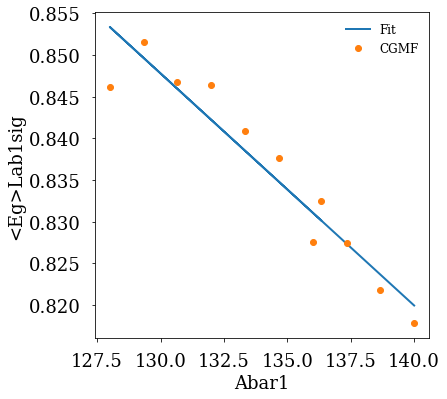

ACCEPTABLE LINEAR FIT between sigA0 and <TXE>. 
chi^2/dof = 2.9E-05


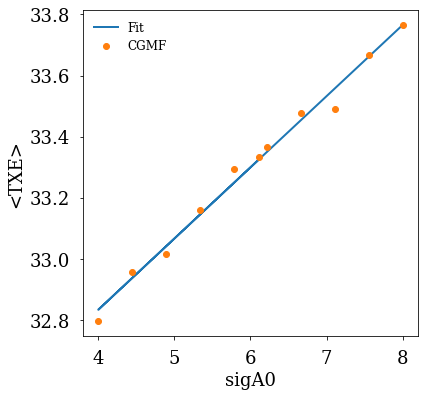

ACCEPTABLE LINEAR FIT between sigA0 and <TXE>1sig. 
chi^2/dof = 9.5E-05


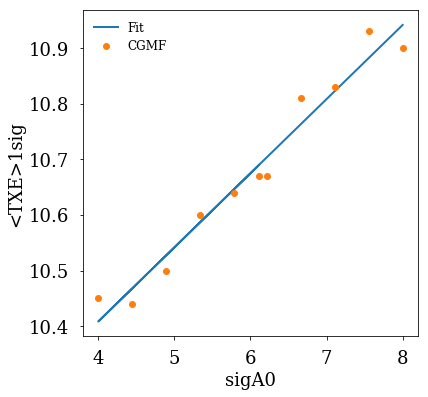

ACCEPTABLE LINEAR FIT between sigA0 and <TKE>. 
chi^2/dof = 3.5E-06


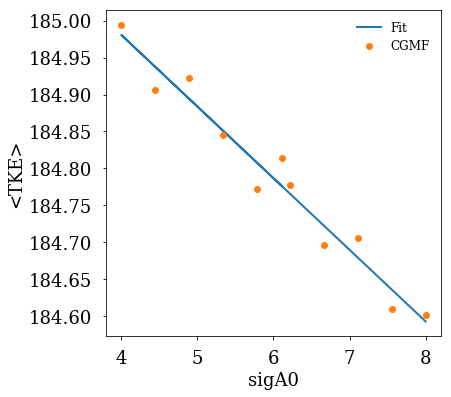

ACCEPTABLE LINEAR FIT between sigA0 and <TKE>1sig. 
chi^2/dof = 1.1E-04


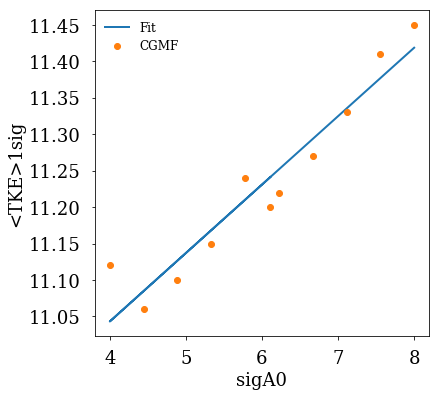

ACCEPTABLE LINEAR FIT between sigA0 and <J>. 
chi^2/dof = 2.4E-05


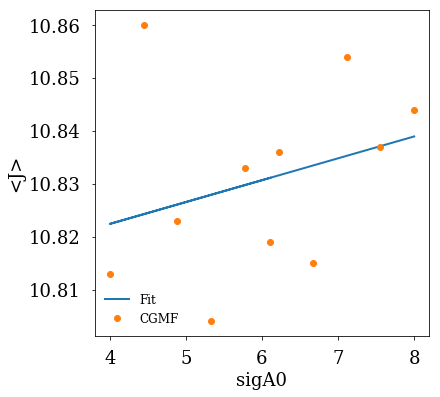

ACCEPTABLE LINEAR FIT between sigA0 and <J>1sig. 
chi^2/dof = 2.2E-05


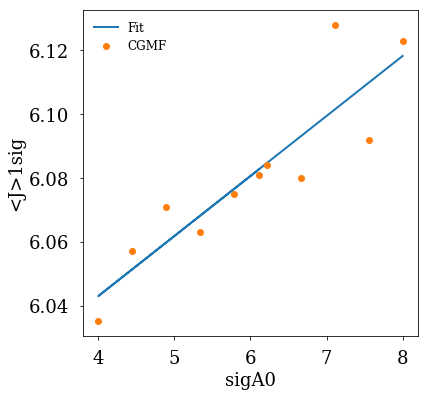

ACCEPTABLE LINEAR FIT between sigA0 and <nn>. 
chi^2/dof = 7.1E-06


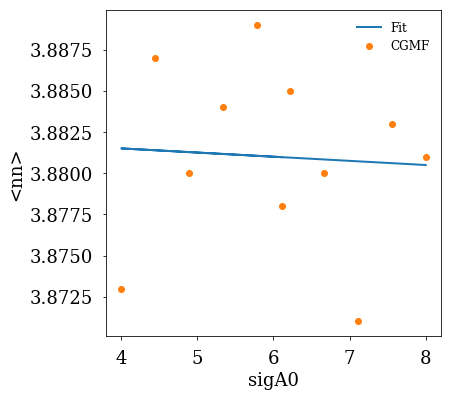

ACCEPTABLE LINEAR FIT between sigA0 and n-mom2. 
chi^2/dof = 9.8E-05


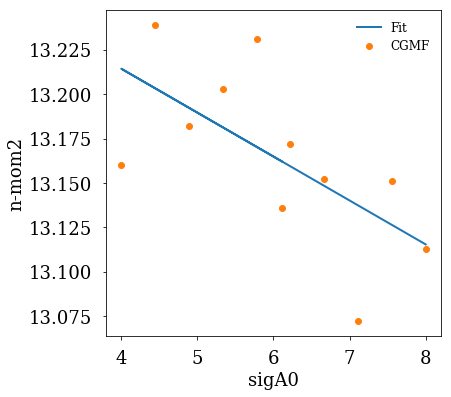

ACCEPTABLE LINEAR FIT between sigA0 and n-mom3. 
chi^2/dof = 6.6E-04


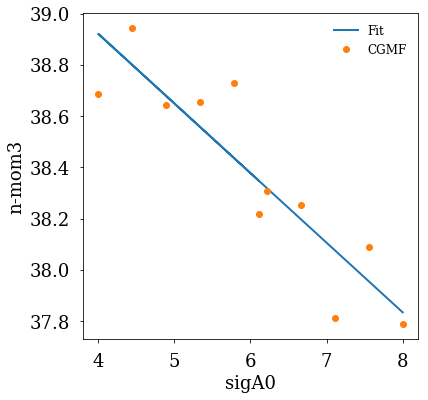

ACCEPTABLE LINEAR FIT between sigA0 and <ng>. 
chi^2/dof = 5.8E-06


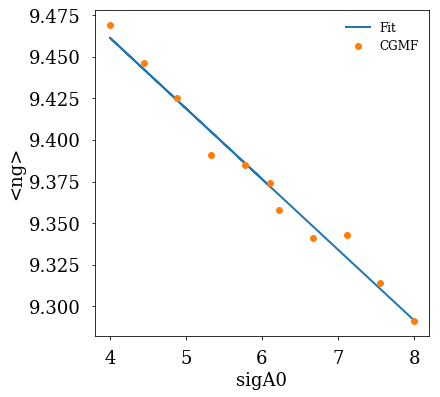

ACCEPTABLE LINEAR FIT between sigA0 and g-mom2. 
chi^2/dof = 3.4E-04


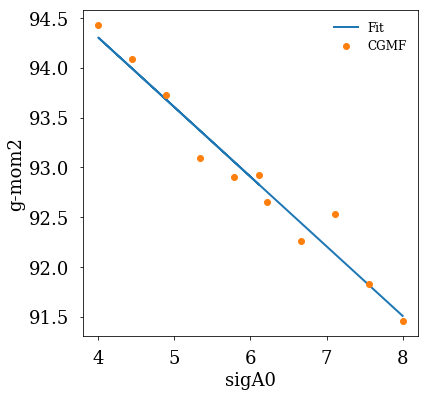

ACCEPTABLE LINEAR FIT between sigA0 and g-mom3. 
chi^2/dof = 1.3E-02


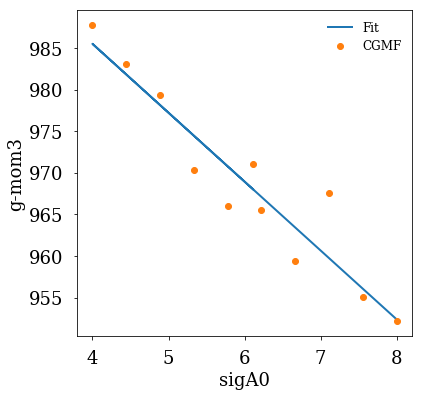

ACCEPTABLE LINEAR FIT between sigA0 and <En>CM. 
chi^2/dof = 3.0E-06


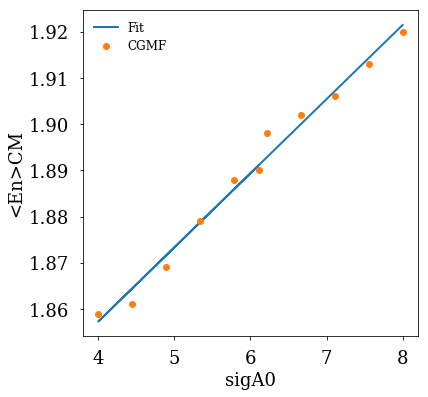

ACCEPTABLE LINEAR FIT between sigA0 and <En>CM1sig. 
chi^2/dof = 5.4E-06


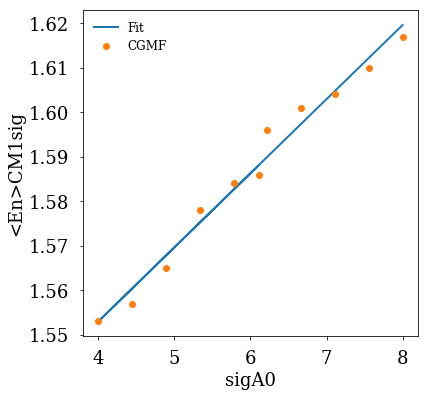

ACCEPTABLE LINEAR FIT between sigA0 and <Eg>CM. 
chi^2/dof = 4.1E-06


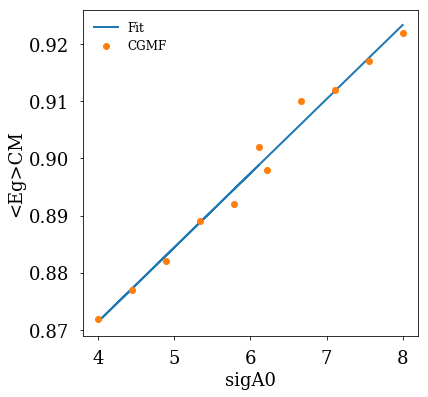

ACCEPTABLE LINEAR FIT between sigA0 and <Eg>CM1sig. 
chi^2/dof = 3.5E-06


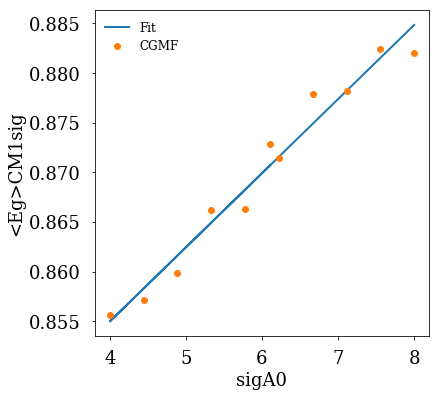

ACCEPTABLE LINEAR FIT between sigA0 and <En>Lab. 
chi^2/dof = 2.6E-06


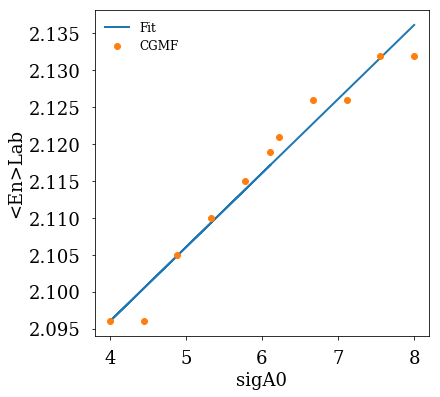

ACCEPTABLE LINEAR FIT between sigA0 and <En>Lab1sig. 
chi^2/dof = 3.2E-06


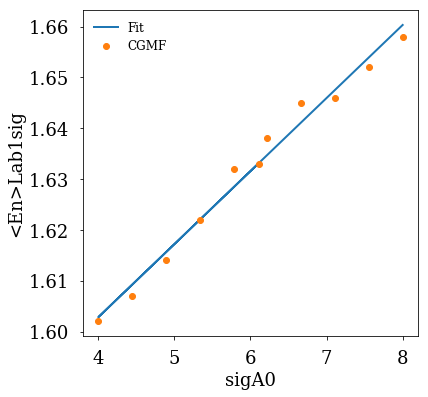

ACCEPTABLE LINEAR FIT between sigA0 and <Eg>Lab. 
chi^2/dof = 2.8E-06


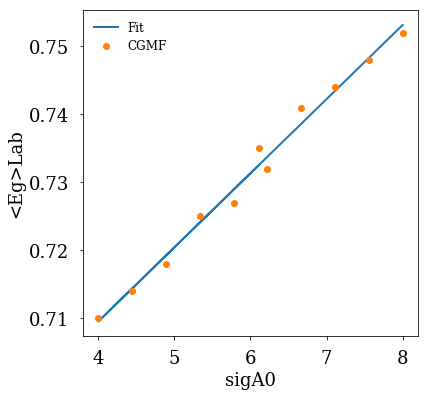

ACCEPTABLE LINEAR FIT between sigA0 and <Eg>Lab1sig. 
chi^2/dof = 3.9E-06


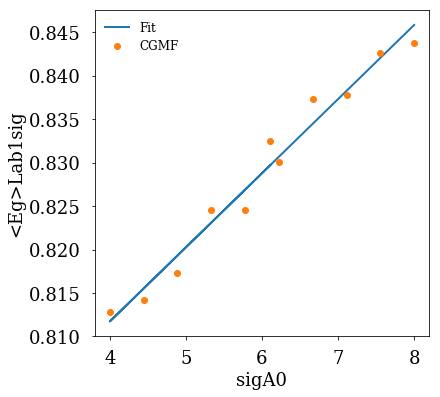

ACCEPTABLE LINEAR FIT between sigA1 and <TXE>. 
chi^2/dof = 2.5E-05


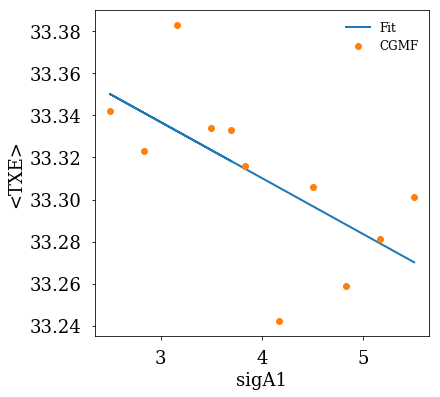

ACCEPTABLE LINEAR FIT between sigA1 and <TXE>1sig. 
chi^2/dof = 7.2E-05


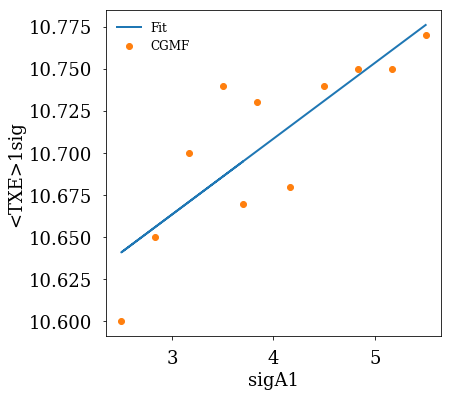

ACCEPTABLE LINEAR FIT between sigA1 and <TKE>. 
chi^2/dof = 4.0E-06


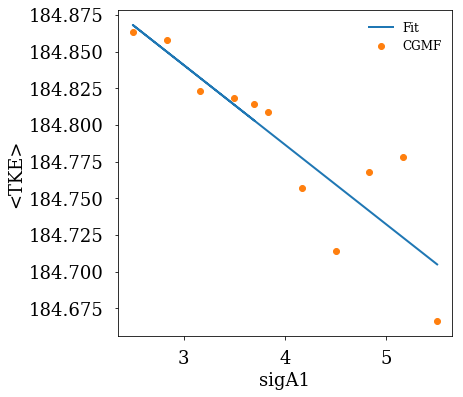

ACCEPTABLE LINEAR FIT between sigA1 and <TKE>1sig. 
chi^2/dof = 5.4E-05


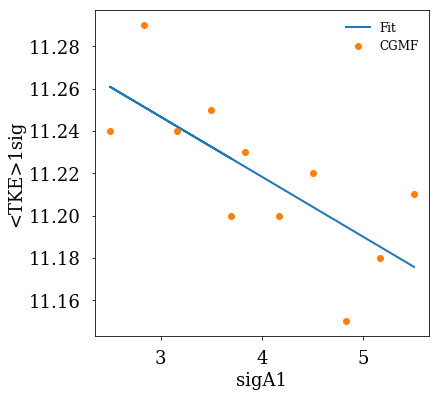

ACCEPTABLE LINEAR FIT between sigA1 and <J>. 
chi^2/dof = 3.9E-05


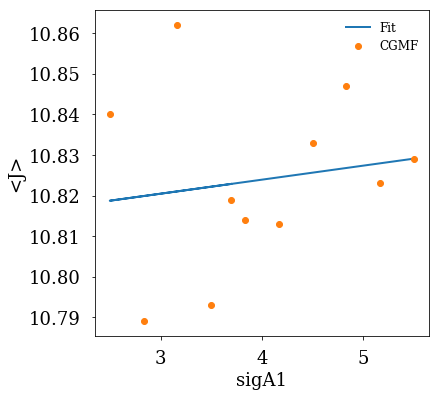

ACCEPTABLE LINEAR FIT between sigA1 and <J>1sig. 
chi^2/dof = 2.9E-05


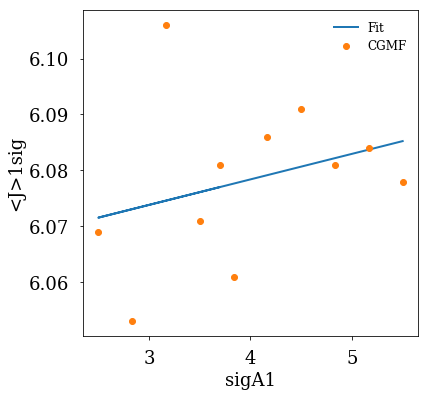

ACCEPTABLE LINEAR FIT between sigA1 and <nn>. 
chi^2/dof = 4.9E-06


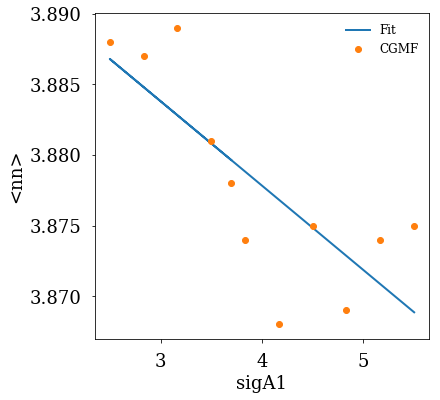

ACCEPTABLE LINEAR FIT between sigA1 and n-mom2. 
chi^2/dof = 8.0E-05


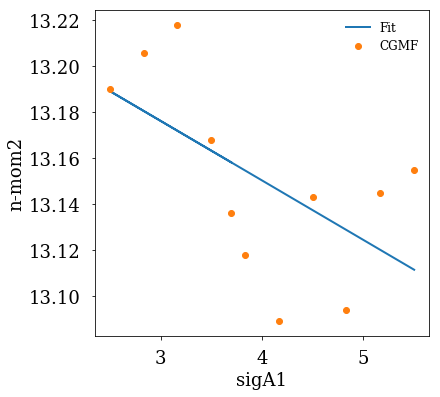

ACCEPTABLE LINEAR FIT between sigA1 and n-mom3. 
chi^2/dof = 6.1E-04


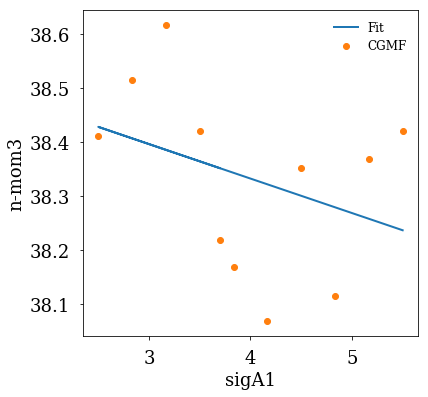

ACCEPTABLE LINEAR FIT between sigA1 and <ng>. 
chi^2/dof = 3.1E-05


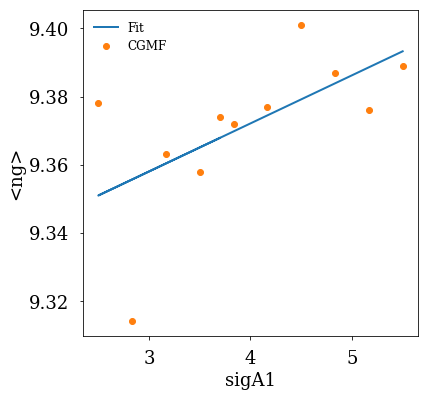

ACCEPTABLE LINEAR FIT between sigA1 and g-mom2. 
chi^2/dof = 1.2E-03


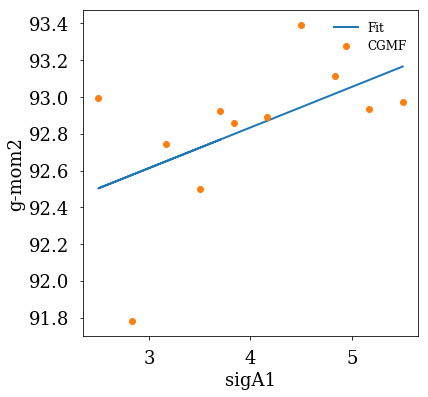

ACCEPTABLE LINEAR FIT between sigA1 and g-mom3. 
chi^2/dof = 2.8E-02


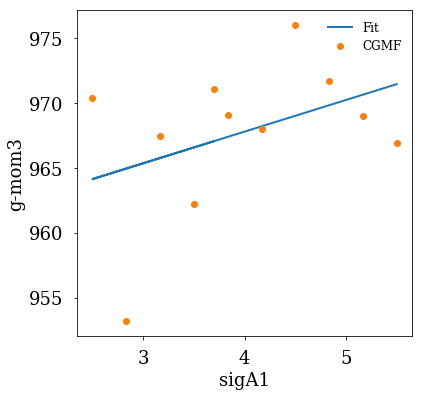

ACCEPTABLE LINEAR FIT between sigA1 and <En>CM. 
chi^2/dof = 4.5E-06


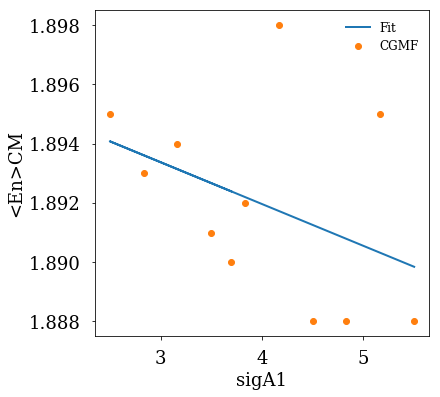

ACCEPTABLE LINEAR FIT between sigA1 and <En>CM1sig. 
chi^2/dof = 6.4E-06


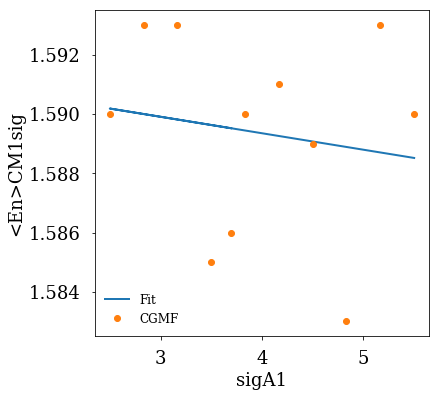

ACCEPTABLE LINEAR FIT between sigA1 and <Eg>CM. 
chi^2/dof = 5.0E-06


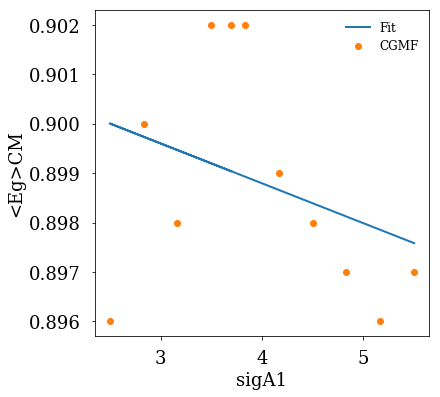

ACCEPTABLE LINEAR FIT between sigA1 and <Eg>CM1sig. 
chi^2/dof = 3.7E-06


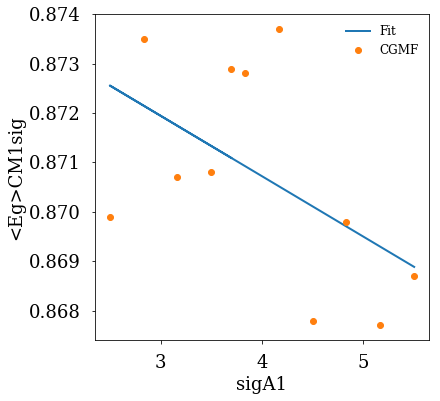

ACCEPTABLE LINEAR FIT between sigA1 and <En>Lab. 
chi^2/dof = 5.9E-06


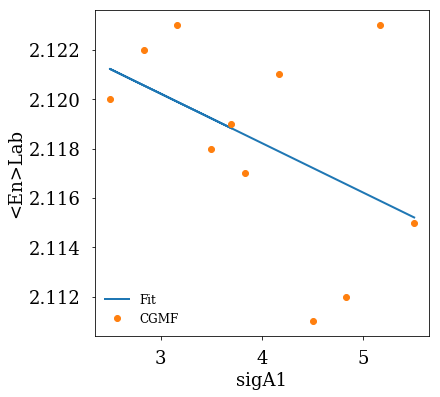

ACCEPTABLE LINEAR FIT between sigA1 and <En>Lab1sig. 
chi^2/dof = 6.3E-06


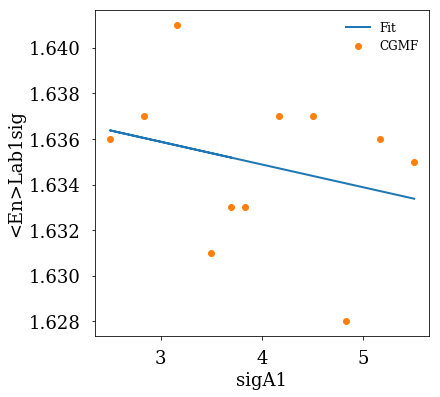

ACCEPTABLE LINEAR FIT between sigA1 and <Eg>Lab. 
chi^2/dof = 2.8E-06


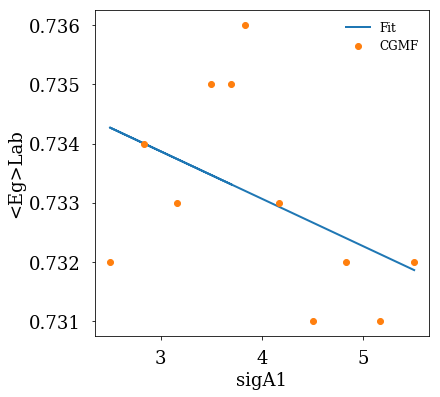

ACCEPTABLE LINEAR FIT between sigA1 and <Eg>Lab1sig. 
chi^2/dof = 3.2E-06


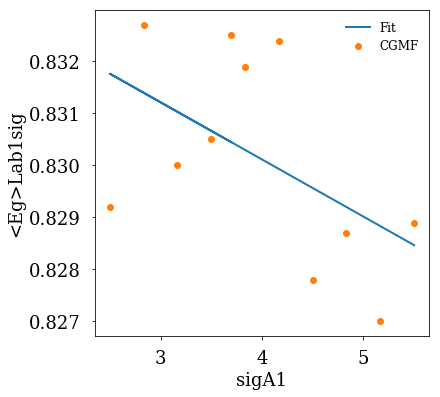

ACCEPTABLE LINEAR FIT between sigA2 and <TXE>. 
chi^2/dof = 1.7E-05


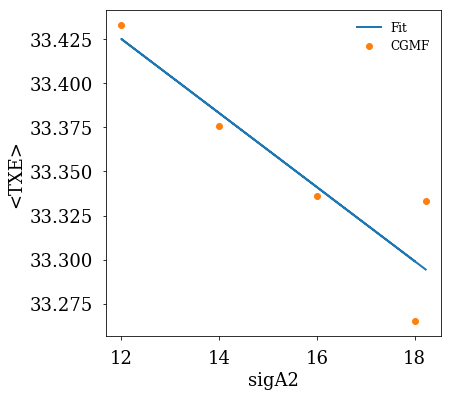

ACCEPTABLE LINEAR FIT between sigA2 and <TXE>1sig. 
chi^2/dof = 3.5E-05


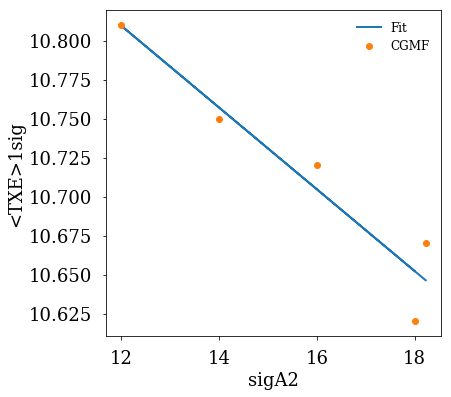

ACCEPTABLE LINEAR FIT between sigA2 and <TKE>. 
chi^2/dof = 1.8E-06


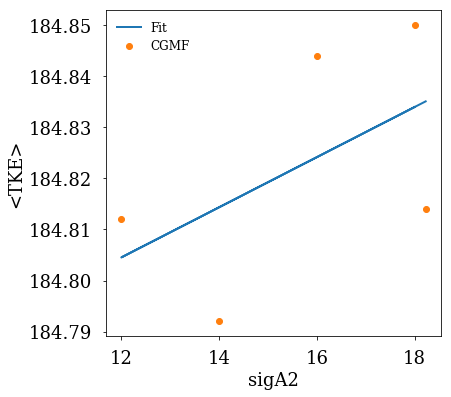

ACCEPTABLE LINEAR FIT between sigA2 and <TKE>1sig. 
chi^2/dof = 2.9E-05


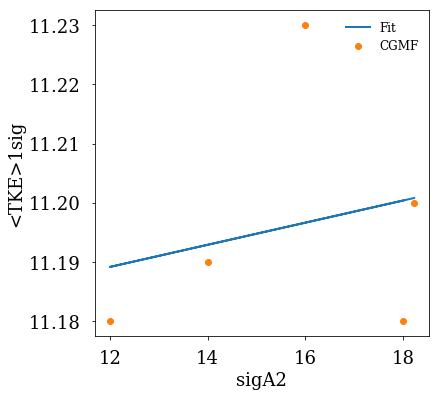

ACCEPTABLE LINEAR FIT between sigA2 and <J>. 
chi^2/dof = 5.4E-06


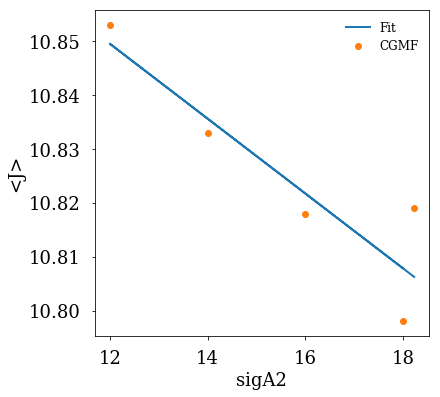

ACCEPTABLE LINEAR FIT between sigA2 and <J>1sig. 
chi^2/dof = 2.5E-05


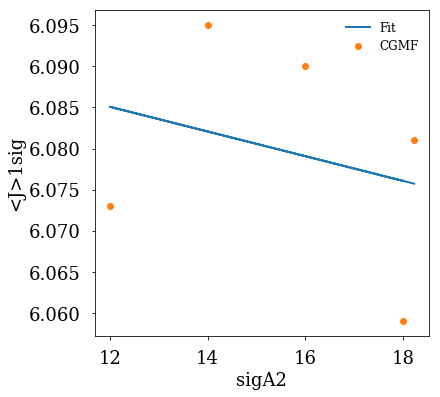

ACCEPTABLE LINEAR FIT between sigA2 and <nn>. 
chi^2/dof = 3.6E-07


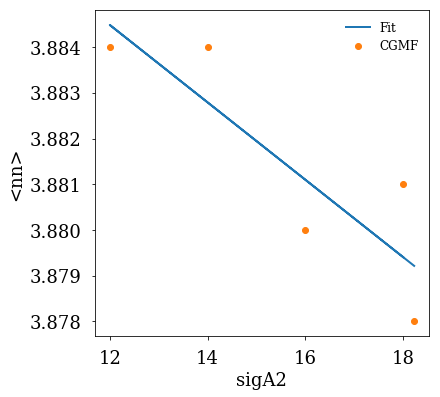

ACCEPTABLE LINEAR FIT between sigA2 and n-mom2. 
chi^2/dof = 8.9E-06


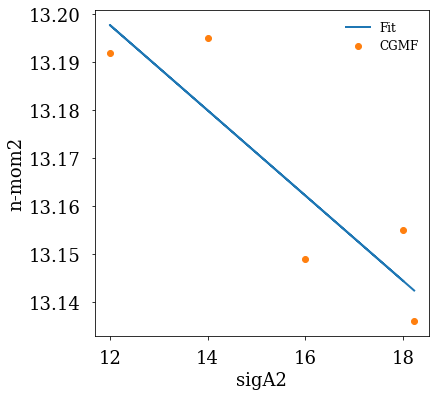

ACCEPTABLE LINEAR FIT between sigA2 and n-mom3. 
chi^2/dof = 1.8E-04


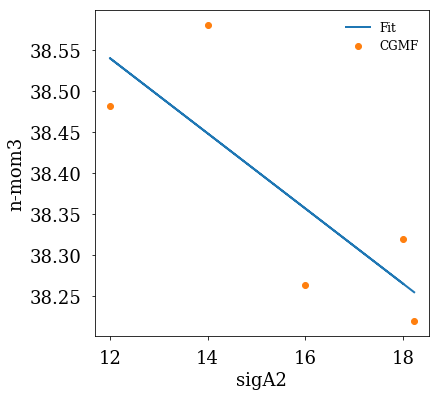

ACCEPTABLE LINEAR FIT between sigA2 and <ng>. 
chi^2/dof = 3.1E-05


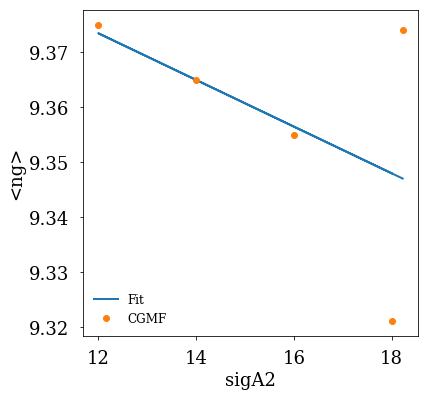

ACCEPTABLE LINEAR FIT between sigA2 and g-mom2. 
chi^2/dof = 1.7E-03


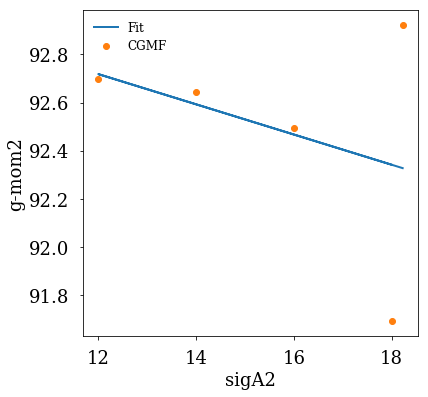

ACCEPTABLE LINEAR FIT between sigA2 and g-mom3. 
chi^2/dof = 6.1E-02


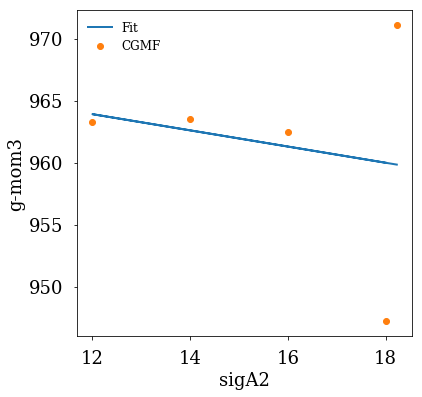

ACCEPTABLE LINEAR FIT between sigA2 and <En>CM. 
chi^2/dof = 6.6E-07


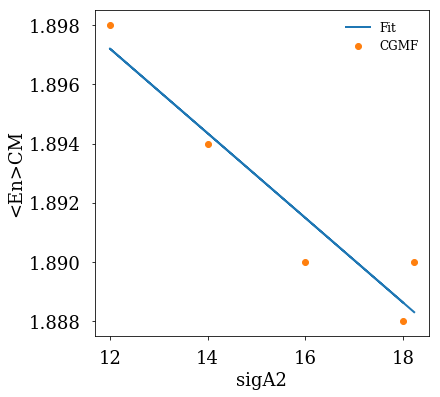

ACCEPTABLE LINEAR FIT between sigA2 and <En>CM1sig. 
chi^2/dof = 1.5E-06


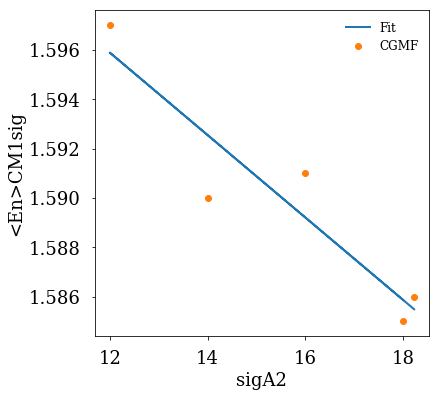

ACCEPTABLE LINEAR FIT between sigA2 and <Eg>CM. 
chi^2/dof = 3.2E-06


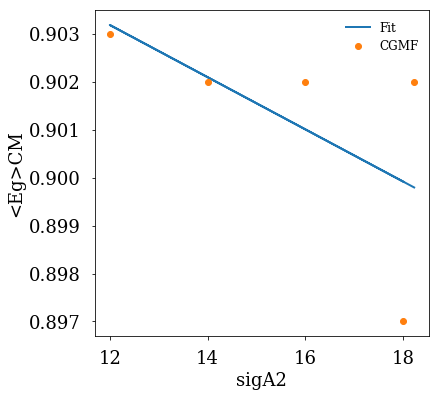

ACCEPTABLE LINEAR FIT between sigA2 and <Eg>CM1sig. 
chi^2/dof = 4.7E-06


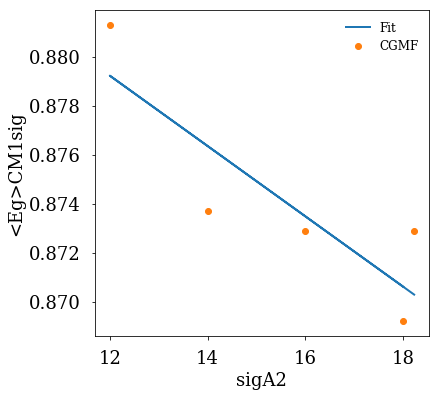

ACCEPTABLE LINEAR FIT between sigA2 and <En>Lab. 
chi^2/dof = 2.9E-06


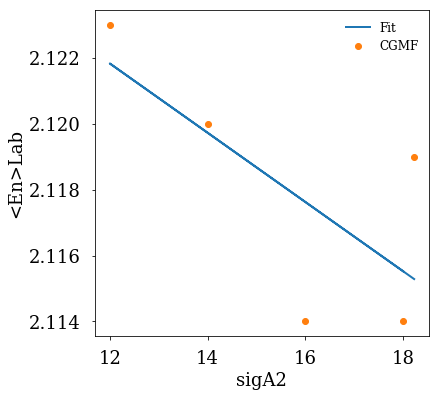

ACCEPTABLE LINEAR FIT between sigA2 and <En>Lab1sig. 
chi^2/dof = 1.7E-06


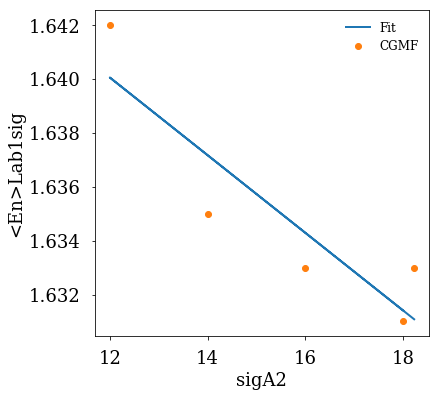

ACCEPTABLE LINEAR FIT between sigA2 and <Eg>Lab. 
chi^2/dof = 1.5E-06


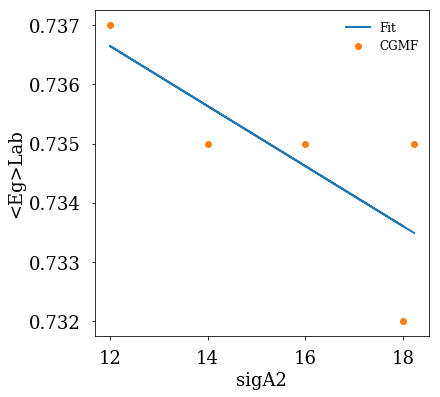

ACCEPTABLE LINEAR FIT between sigA2 and <Eg>Lab1sig. 
chi^2/dof = 3.2E-06


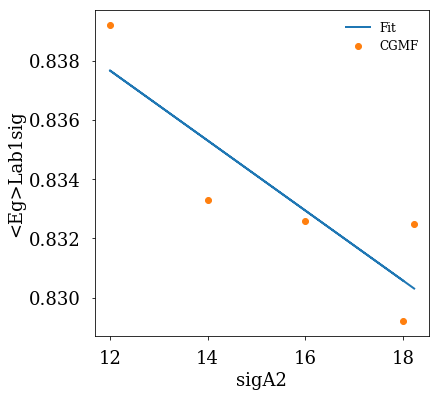

In [5]:
# rembember that the nominal values for the parameters and responses is the first element of each array

SRx = {}
for k in param_keys:
    SRx[k] = {}
    for R in response_keys:
        SRx[k][R] = get_SRx(Rdata[k][k], Rdata[k][R], Rdata[k][k][0], Rdata[k][R][0])
        test_SRx(Rdata[k][k], Rdata[k][R], Rdata[k][k][0], Rdata[k][R][0], k, R)

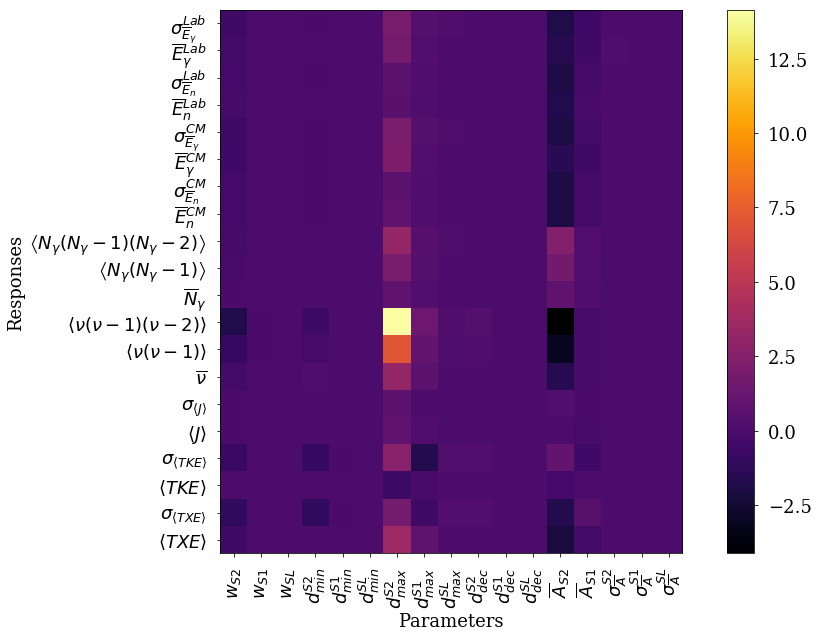

In [6]:
# Make the cool overall imshow plot with all responses and parameters

fig, axes = pl.subplots(1, 1, figsize=(10,10))

# transfer SRx library to a 2d array
SRxArr = np.zeros((len(response_keys), len(param_keys)))

for i in range(len(response_keys)):
    for j in range(len(param_keys)):
        SRxArr[i,j] = SRx[param_keys[j]][response_keys[i]]
        
param_labels = [r'$w_{S2}$', r'$w_{S1}$', r'$w_{SL}$',
               r'$d_{min}^{S2}$', r'$d_{min}^{S1}$', r'$d_{min}^{SL}$',
               r'$d_{max}^{S2}$', r'$d_{max}^{S1}$', r'$d_{max}^{SL}$',
               r'$d_{dec}^{S2}$', r'$d_{dec}^{S1}$', r'$d_{dec}^{SL}$',
               r'$\overline{A}_{S2}$', r'$\overline{A}_{S1}$', 
               r'$\sigma_{\overline{A}}^{S2}$', r'$\sigma_{\overline{A}}^{S1}$', r'$\sigma_{\overline{A}}^{SL}$']

response_labels = [r'$\left \langle TXE \right \rangle$', 
                   r'$\sigma_{\left \langle TXE \right \rangle}$',
                   r'$\left \langle TKE \right \rangle$', 
                   r'$\sigma_{\left \langle TKE \right \rangle}$',
                   r'$\left \langle J \right \rangle$', 
                   r'$\sigma_{\left \langle J \right \rangle}$',
                   r'$\overline{\nu}$', 
                   r'$\left \langle \nu(\nu-1) \right \rangle$',
                   r'$\left \langle \nu(\nu-1)(\nu-2) \right \rangle$',
                   r'$\overline{N}_{\gamma}$', 
                   r'$\left \langle {N_{\gamma}}({N_{\gamma}}-1) \right \rangle$',
                   r'$\left \langle {N_{\gamma}}({N_{\gamma}}-1)({N_{\gamma}}-2) \right \rangle$',
                   r'$\overline{E}_{n}^{CM}$',
                   r'$\sigma_{\overline{E}_{n}}^{CM}$',
                   r'$\overline{E}_{\gamma}^{CM}$',
                   r'$\sigma_{\overline{E}_{\gamma}}^{CM}$',
                   r'$\overline{E}_{n}^{Lab}$',
                   r'$\sigma_{\overline{E}_{n}}^{Lab}$',
                   r'$\overline{E}_{\gamma}^{Lab}$',
                   r'$\sigma_{\overline{E}_{\gamma}}^{Lab}$']

plt.xlabel('Parameters')
plt.xticks(np.linspace(0,len(param_keys)-1, len(param_keys)), param_labels, rotation='vertical')
plt.ylabel('Responses')
plt.yticks(np.linspace(0,len(response_keys)-1, len(response_keys)), response_labels)
plt.imshow(SRxArr,  origin="lower")
plt.colorbar(fraction=0.06, pad=0.08)
plt.show()

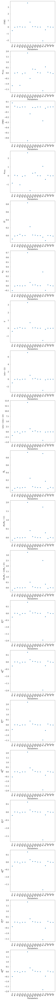

In [7]:
fig, axes = pl.subplots(20,1, figsize=(8,180))

i = 1
for k in range(len(response_keys)):
    plt.subplot(20,1,i)
    plt.plot(np.linspace(0,len(param_keys)-1, len(param_keys)), SRxArr[k,:], 'o')
    plt.xticks(np.linspace(0,len(param_keys)-1, len(param_keys)), param_labels, rotation='vertical')
    plt.xlabel('Parameters')
    plt.ylabel(response_labels[k])
    i+=1

***************************************
Parameter: w0
***************************************


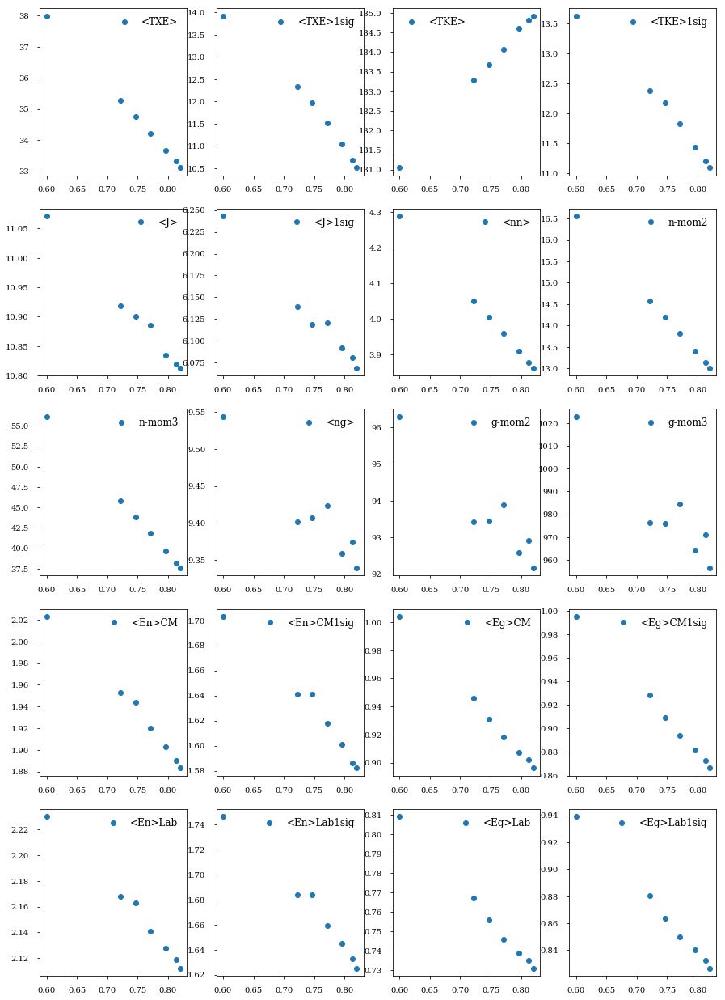

***************************************
Parameter: w1
***************************************


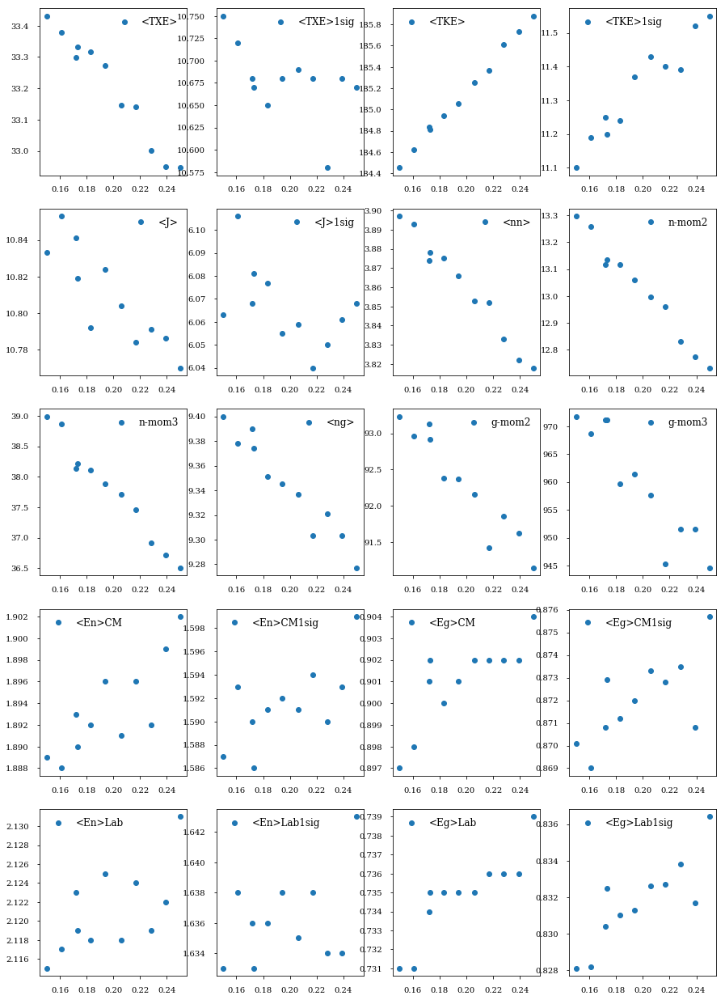

***************************************
Parameter: w2
***************************************


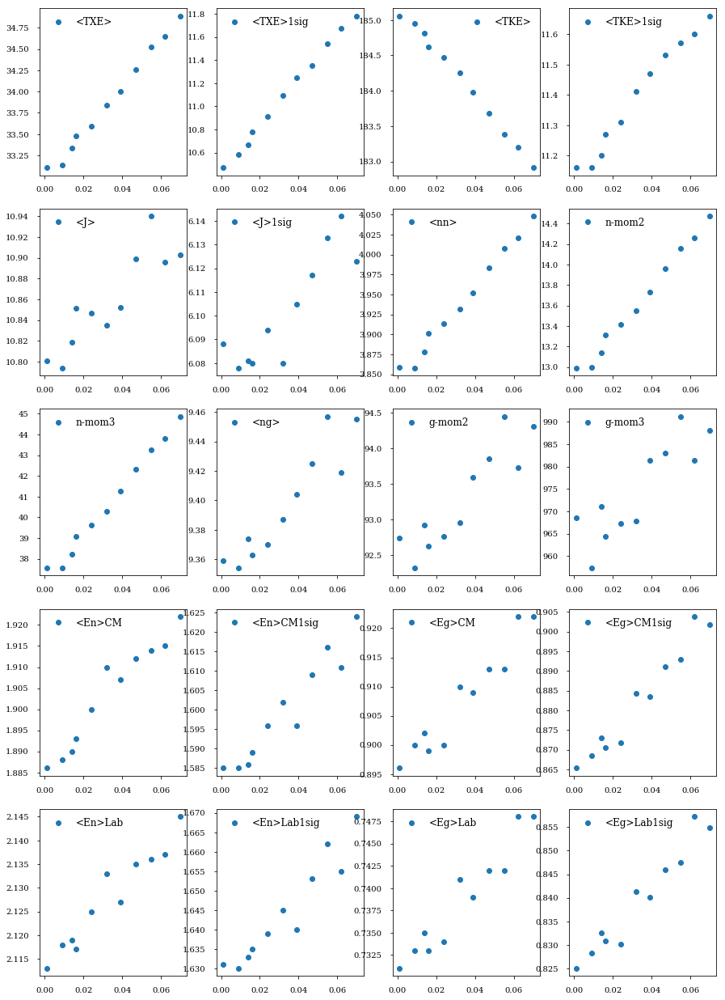

***************************************
Parameter: dmin0
***************************************


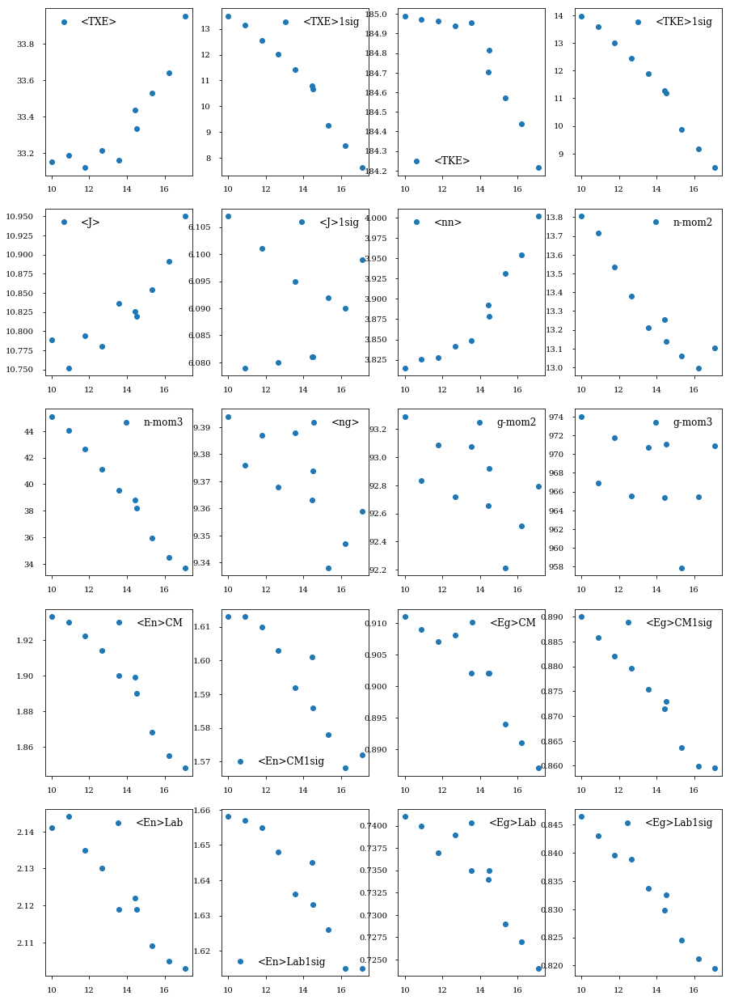

***************************************
Parameter: dmin1
***************************************


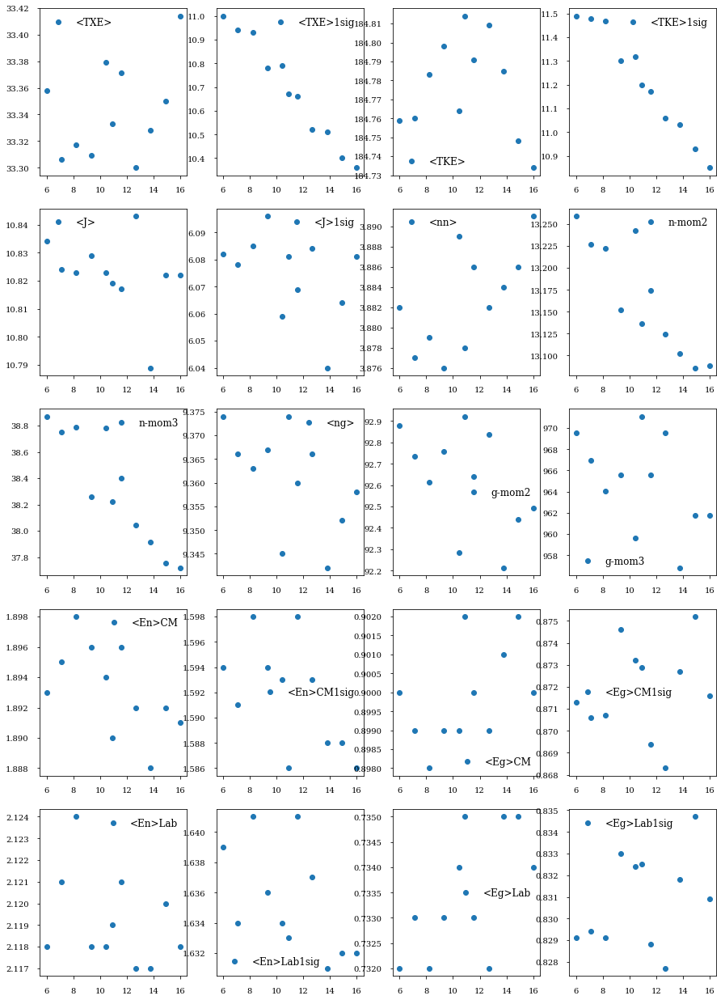

***************************************
Parameter: dmin2
***************************************


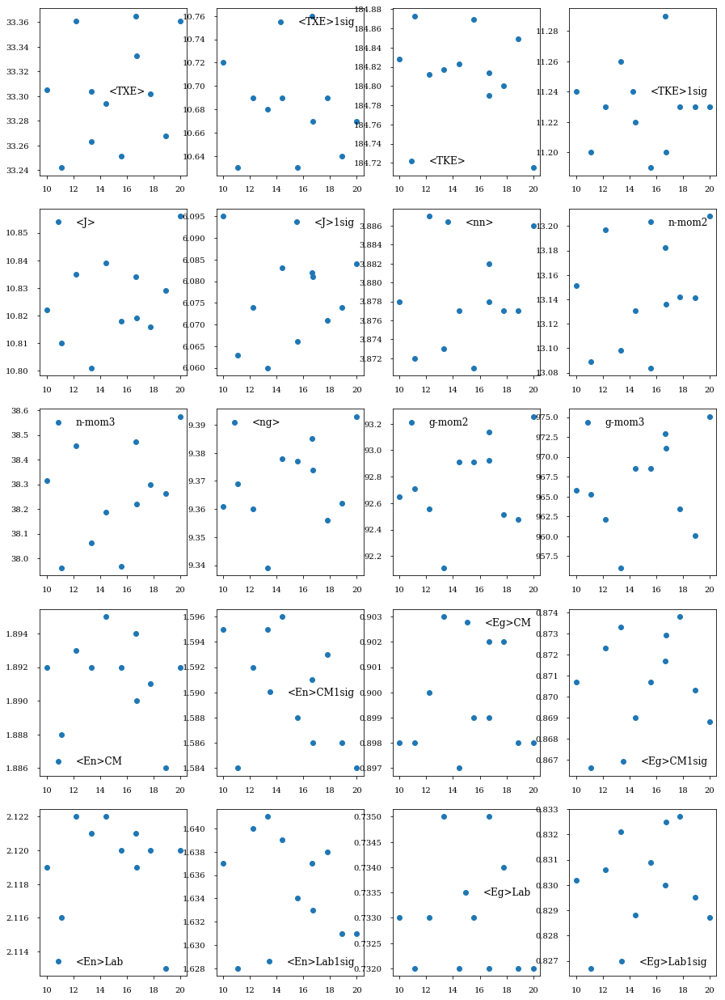

***************************************
Parameter: dmax0
***************************************


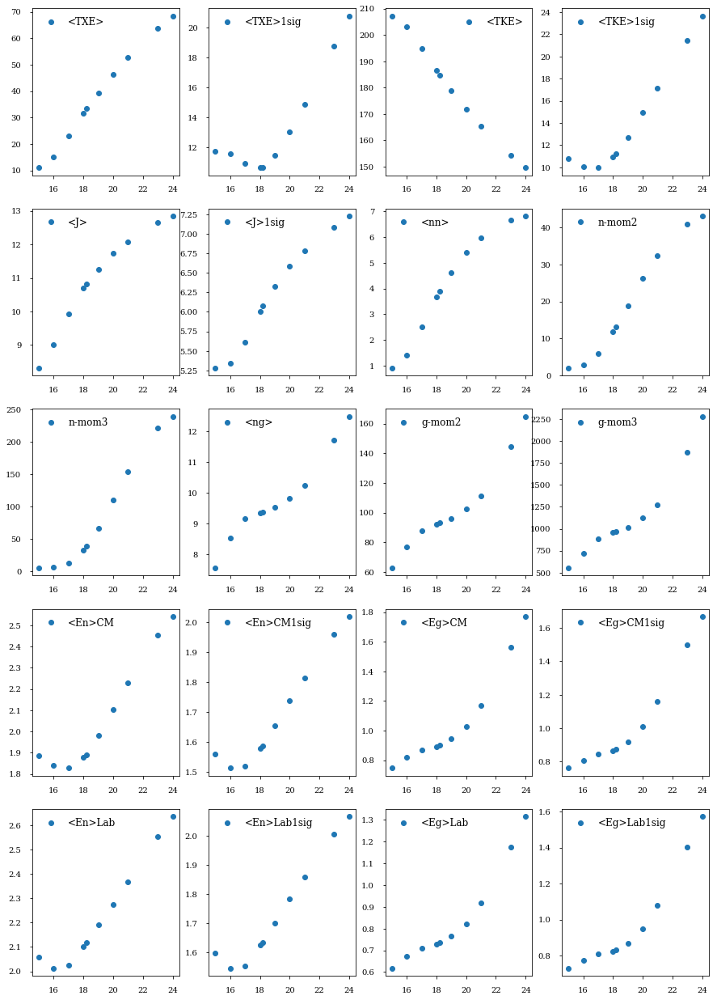

***************************************
Parameter: dmax1
***************************************


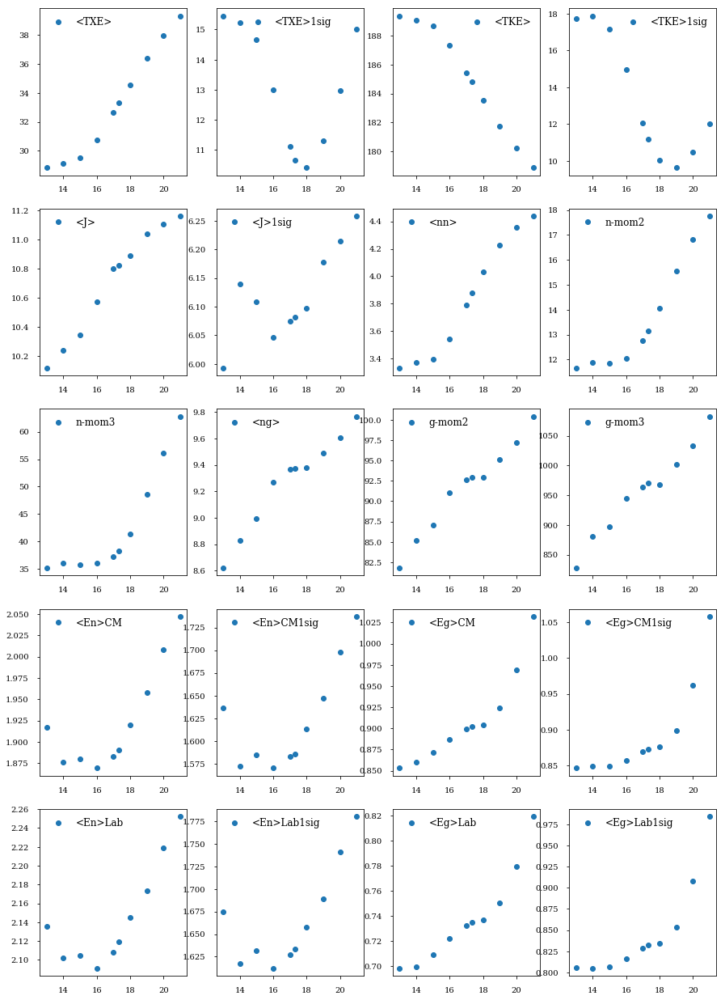

***************************************
Parameter: dmax2
***************************************


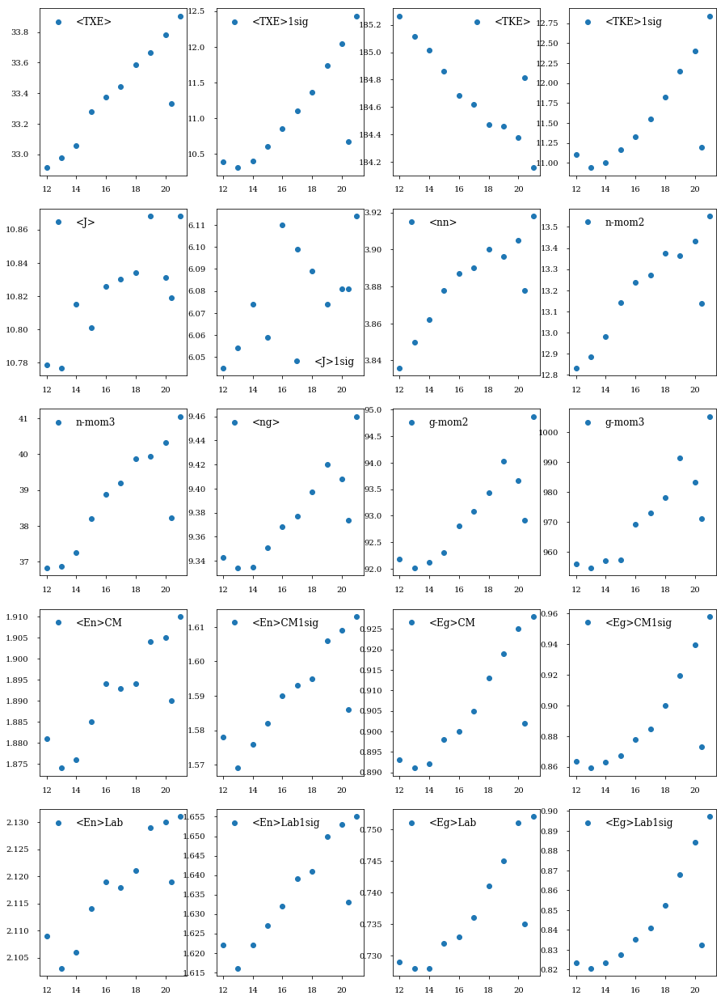

***************************************
Parameter: ddec0
***************************************


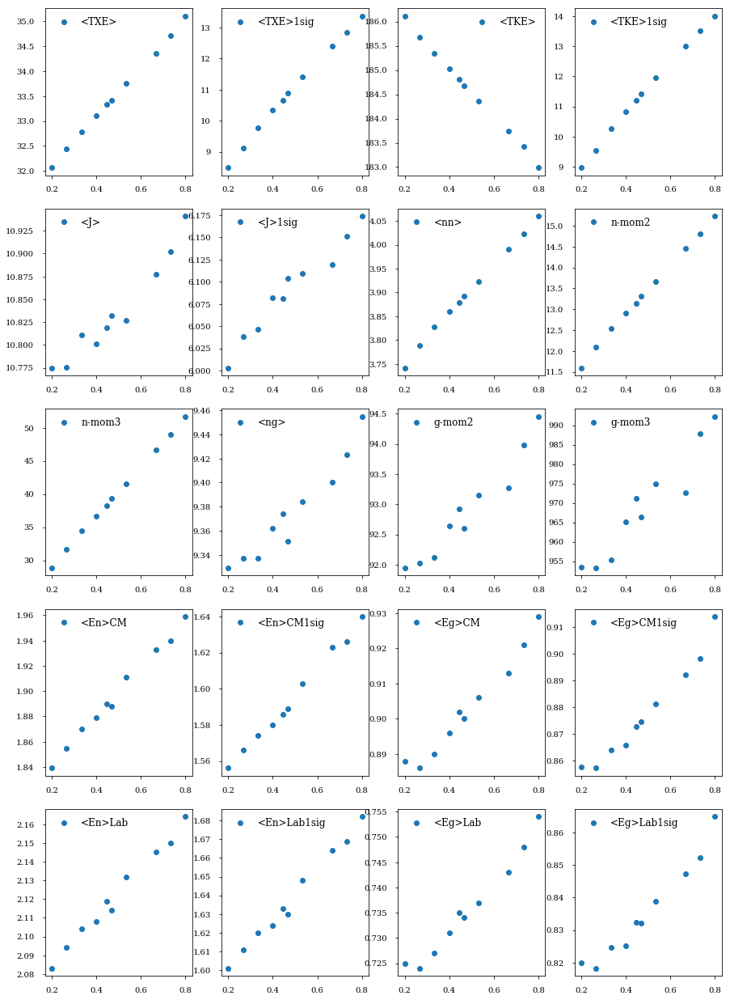

***************************************
Parameter: ddec1
***************************************


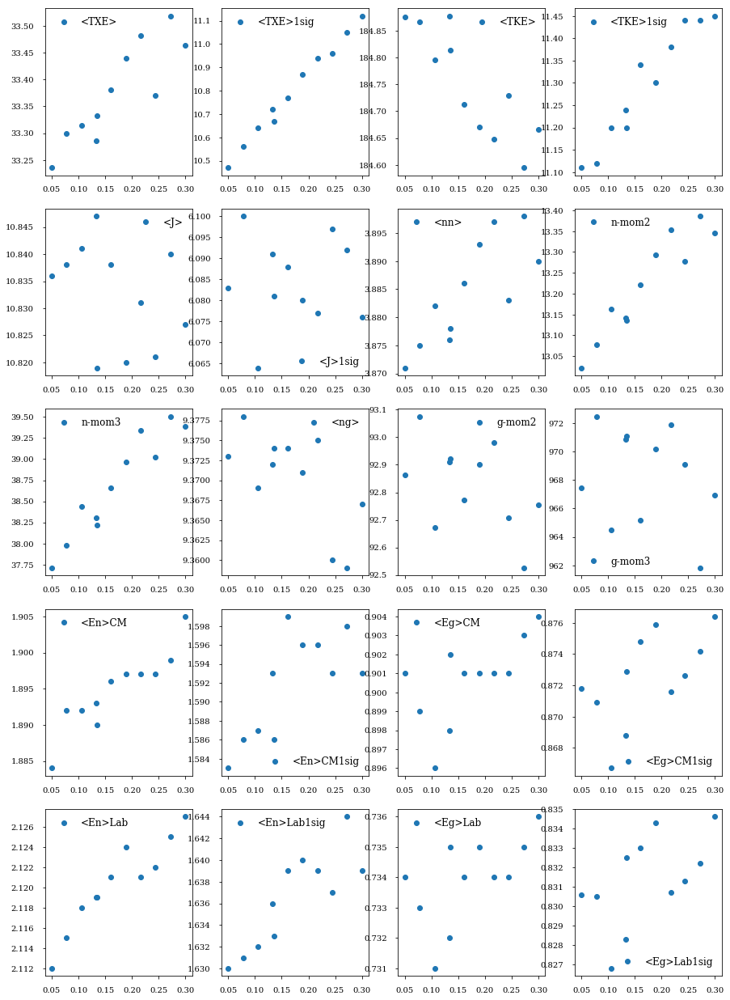

***************************************
Parameter: ddec2
***************************************


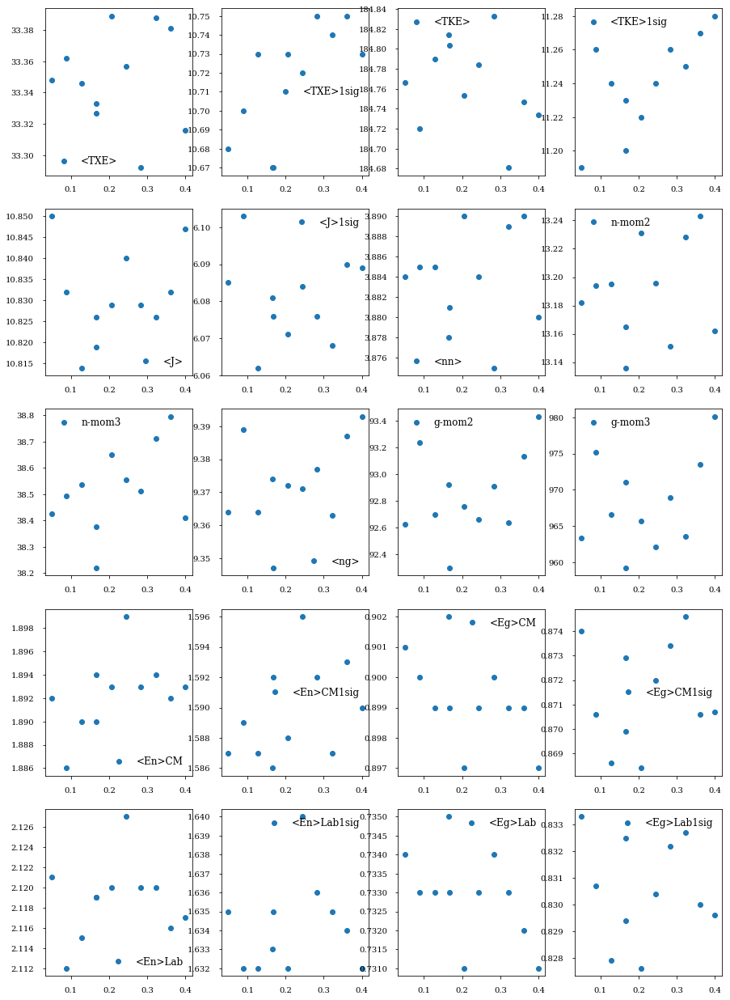

***************************************
Parameter: Abar0
***************************************


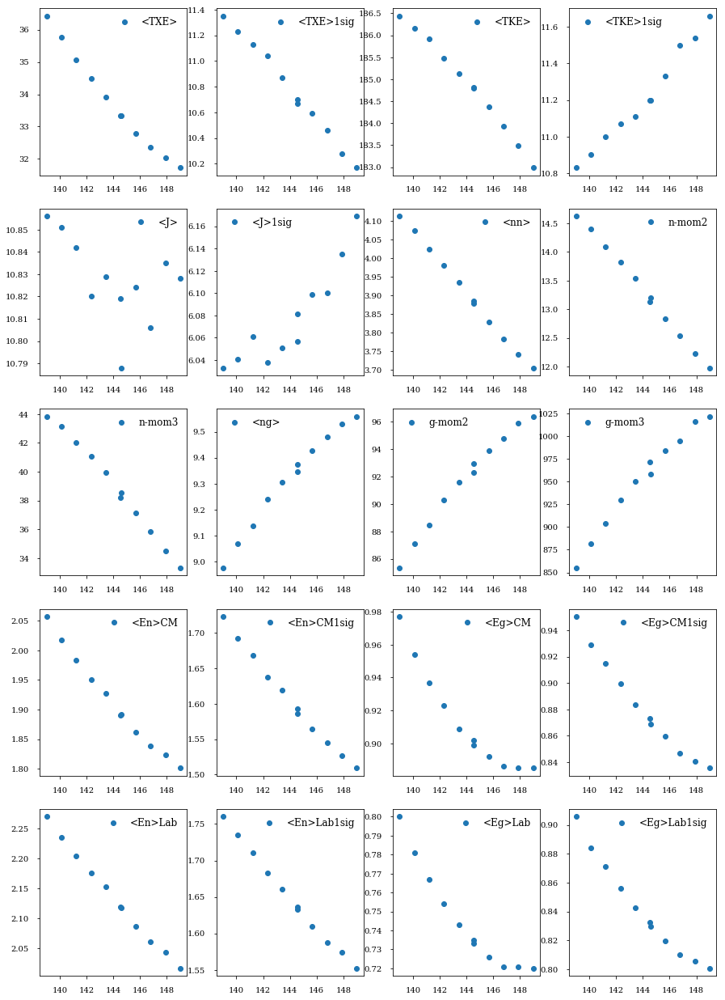

***************************************
Parameter: Abar1
***************************************


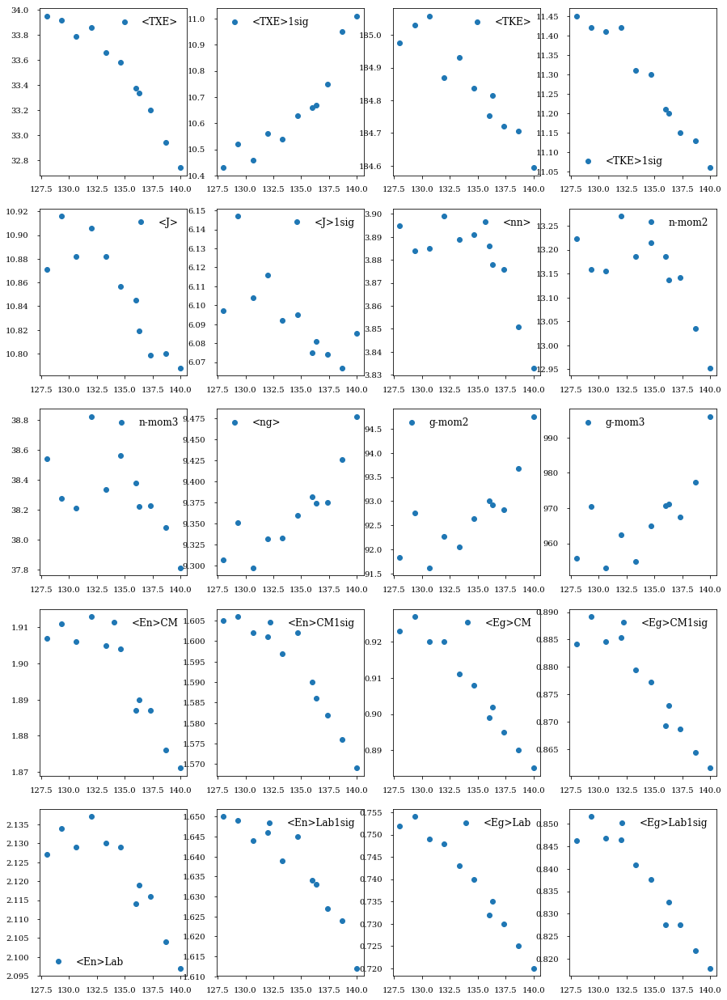

***************************************
Parameter: sigA0
***************************************


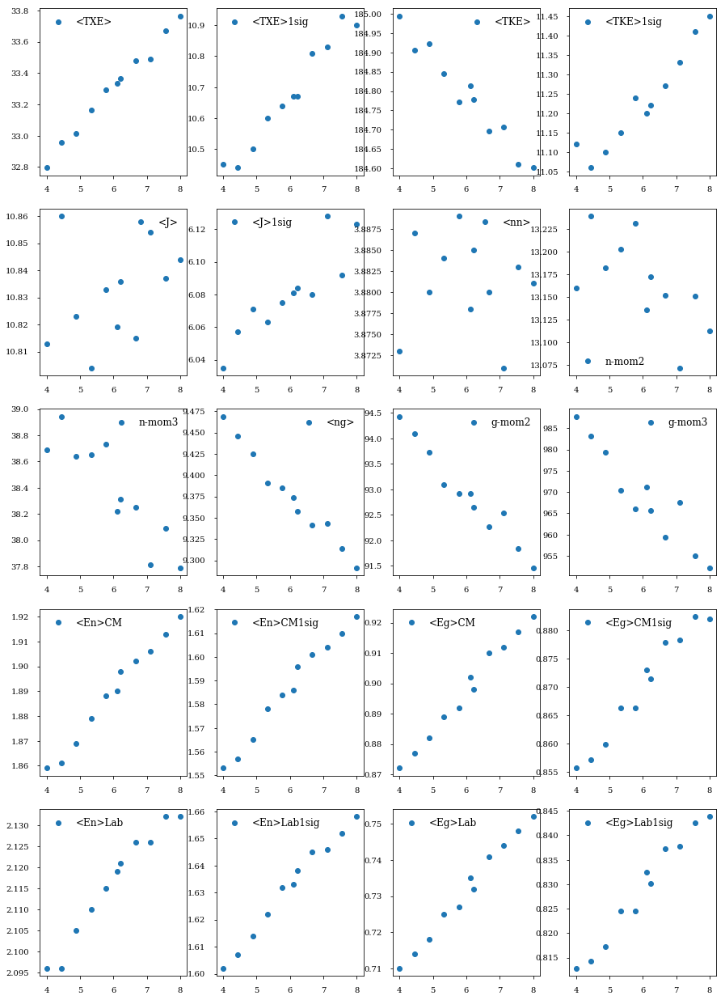

***************************************
Parameter: sigA1
***************************************


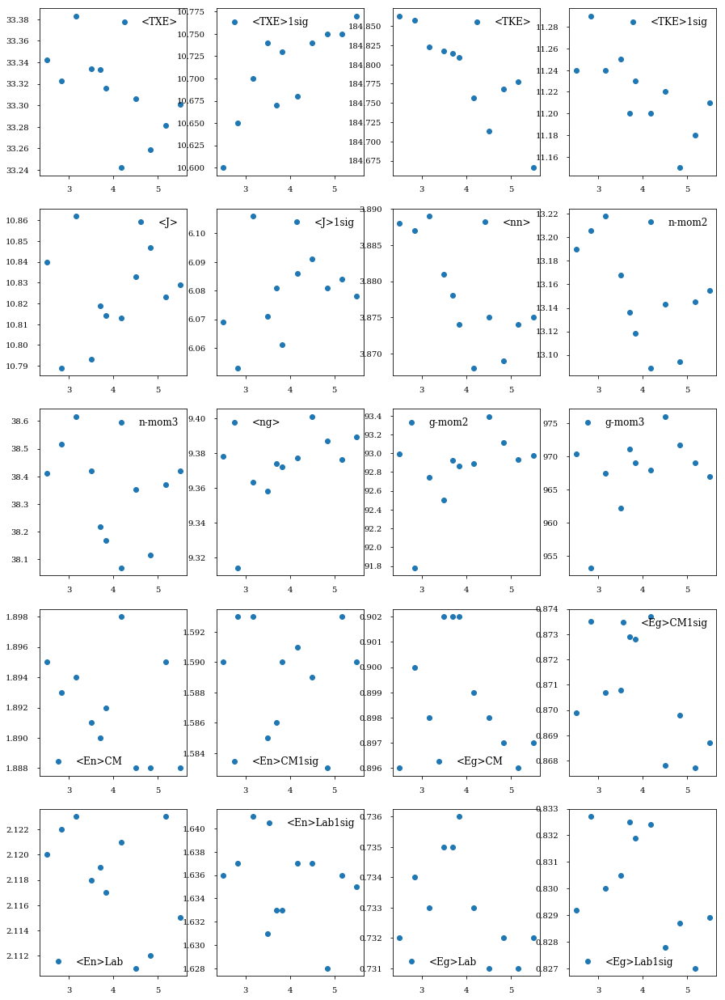

***************************************
Parameter: sigA2
***************************************


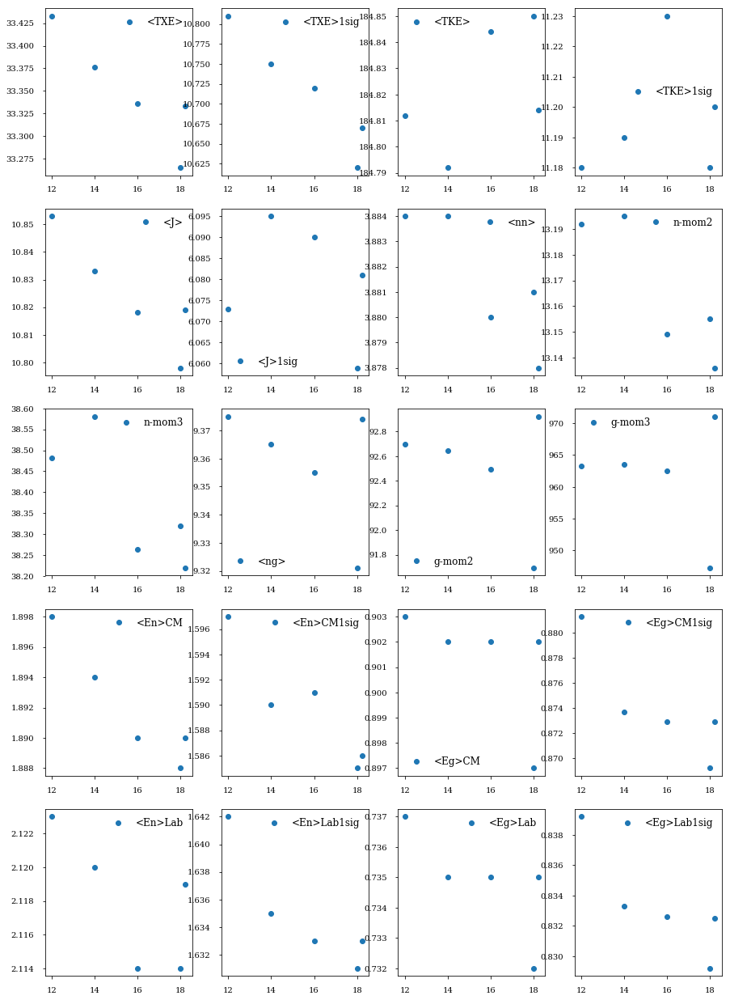

In [8]:
mpl.rcParams['axes.labelsize'] = 10.
mpl.rcParams['xtick.labelsize'] = 10.
mpl.rcParams['ytick.labelsize'] = 10.
mpl.rcParams['lines.linewidth'] = 2.

for x in param_keys:
    print("***************************************")
    print("Parameter: {}".format(x))
    print("***************************************")
    fig, axes = pl.subplots(5,4, figsize=(15, 22))

    i = 1
    for R in response_keys:
        plt.subplot(5,4,i)
        plt.plot(Rdata[x][x],Rdata[x][R], 'o' ,label = R)
        lg = plt.legend(numpoints=1,fontsize=12, loc='best')
        lg.draw_frame(False)
        i+=1
    plt.show()